<a href="https://colab.research.google.com/github/Yuanranzhu/SINN/blob/main/FPU_chain_SINN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!hostname

gnode014.cluster


In [2]:
!nvidia-smi

Wed Feb 21 13:34:20 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 545.23.08              Driver Version: 545.23.08    CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA H100 PCIe               Off | 00000000:A8:00.0 Off |                    0 |
| N/A   27C    P0              47W / 350W |      4MiB / 81559MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [3]:
import itertools as it
import pickle
import torch
import torch.nn as nn
import torch.optim as optim
import torch.fft
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sdeint
from toolbox import (
    make_loss,
    StatLoss,
    SINN,
    FPU
)
import time

In [4]:
torch.cuda.is_available()

True

In [5]:
device = torch.device('cuda')

In [6]:
print(torch.__version__)
print(torch.version.cuda)

2.0.1+cu118
11.8


In [7]:
seed = 1234
torch.set_default_dtype(torch.float)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)

In [8]:
%%time

######### Generating SINN training data by solving SDE
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.integrate import quad



###### Parameters 
mag=1              # Magnitude of the coupling
beta=1             # Inverse temperature 
alpha=1            
gamma=1            # Anharmonic potential U(x)=alpha/2* x^2  + gamma/4* x^4
N=100              # Total number of oscillators in the chain 
N_mid=int(N/2)     # Coordinate of the center CG-oscillator 
dt=0.01 
delta_t=0.5
batch = 400
sec_length = 400

Time = 5*delta_t*sec_length
print(Time)
length=int(Time/dt)+1
t = np.linspace(0,Time,length) # define time axis
gap=int(delta_t/dt)
t_store=t[0:-1:gap]



# (q49,q50)
q49_store = np.zeros([t_store.size+1,batch])    
q50_store = np.zeros([t_store.size+1,batch])

q=np.zeros((1,length)) 

p1=np.zeros((N,batch))
q1=np.zeros((N,batch))
p0=np.zeros((N,batch))
q0=np.zeros((N,batch))

# solve SDE

j=1
for i in range(1,length):
    q1=q0+dt*(p0-np.roll(p0,1,axis=0))
    p1=(1-mag*dt)*p0+dt*alpha*(np.roll(q0,-1,axis=0)-q0)+dt*gamma*(np.roll(q0,-1,axis=0)**3-q0**3)+np.sqrt(2*dt*gamma/beta)*np.random.randn(N,batch)
    if i % gap ==0:        
        q49_store[j,:]= np.sum(q1[0:N_mid-1,:], axis=0)
        q50_store[j,:]= np.sum(q1[0:N_mid,:], axis=0)
        j=j+1
    p0=p1
    q0=q1
                                
Toss=int(t_store.size/4)
q49_store=q49_store[Toss:-1,:] 
q50_store=q50_store[Toss:-1,:] 

1000.0
CPU times: user 9min 8s, sys: 13.1 ms, total: 9min 8s
Wall time: 9min 9s


Text(0.5, 1.0, 'Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$')

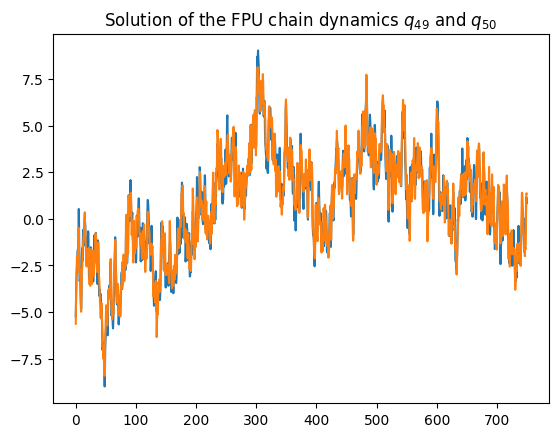

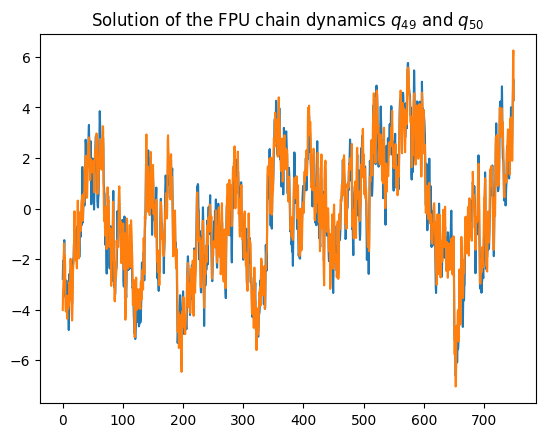

In [9]:
plt.figure(0)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

plt.figure(1)
plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,1])
plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,1])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$ and $q_{50}$")

(400, 400) (400, 400) (400, 400)
(400, 400) (400, 400, 2)


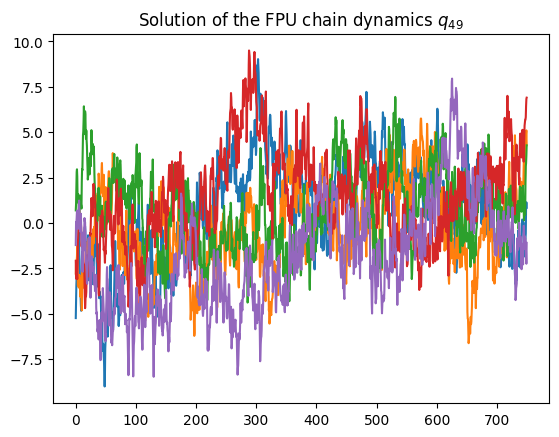

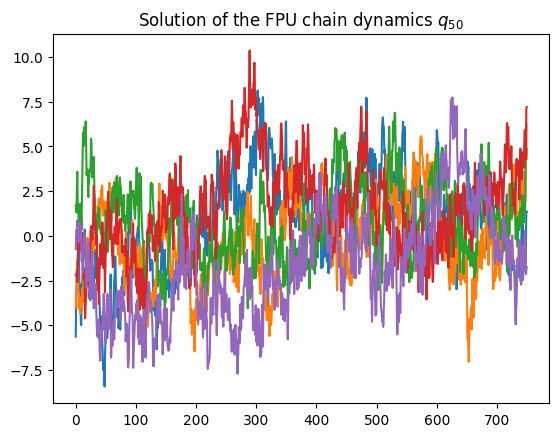

In [10]:
plt.figure(0)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{49}$")

plt.figure(1)
for i in range(5):
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,i])
plt.title(r"Solution of the FPU chain dynamics $q_{50}$")

###########################################   Construct the sample traj for the LSTM learning 
ini=np.random.randn(sec_length,batch)
Traj49 = q49_store[0:sec_length,:]
Traj50 = q50_store[0:sec_length,:]
print(ini.shape, Traj49.shape, Traj50.shape)

Traj = np.empty((sec_length,batch,2))
Traj[:,:,0] = Traj49
Traj[:,:,1] = Traj50
T=np.arange(len(Traj[:,1]))*delta_t
x=np.linspace(-5,5,sec_length)
print(ini.shape, Traj.shape)

In [11]:
# Reformulating data into Torch tensors 
# Input of SINN should be of the form (seq_len, batch, input_size)

ini = np.random.randn(2*sec_length,2*batch).astype(np.float32) 
input = torch.from_numpy(ini.reshape(2*sec_length, batch, 2)).to(device)
batch_validation = batch
val_set = torch.normal(0.0, 1.0, (2*sec_length, batch_validation, 2), device=device)


Traj = Traj.astype(np.float32) 
target = torch.from_numpy(Traj.reshape(sec_length, batch, 2)).to(device)
print('The torch input size is', input.size(), input.dtype)
print('The torch validation size is', val_set.size(), val_set.dtype)
print('The torch target size is', target.size(), target.dtype)

The torch input size is torch.Size([800, 400, 2]) torch.float32
The torch validation size is torch.Size([800, 400, 2]) torch.float32
The torch target size is torch.Size([400, 400, 2]) torch.float32


In [12]:
# Defining Loss functions
LAGS = 400
N = 400
loss_acf_fft = make_loss('acf[fft]', target, lags=LAGS, device=device)
loss_acf_sec_moment = make_loss('acf[fft]', target**2, lags=LAGS, device=device)
loss_acf_bruteforce = make_loss('acf[bruteforce]', target, lags=LAGS, device=device)
loss_acf_randbrute = make_loss('acf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_ccf_fft = make_loss('ccf[fft]', target, lags=LAGS, device=device)
loss_ccf_sec_moment = make_loss('ccf[fft]', target**2, lags=LAGS, device=device)
loss_ccf_bruteforce = make_loss('ccf[bruteforce]', target, lags=LAGS, device=device)
loss_ccf_randbrute = make_loss('ccf[randombrute]', target, lags=LAGS, sample_lags=20, device=device)

loss_pdf_empirical1 = make_loss('pdf', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2 = make_loss('pdf6', target, lower=-5, upper=5, n=N, bw=None, device=device)
loss_pdf_empirical2D = make_loss('pdf2D', target, lower=-5, upper=5, n=N, bw=None, device=device)

torch.Size([400, 2])


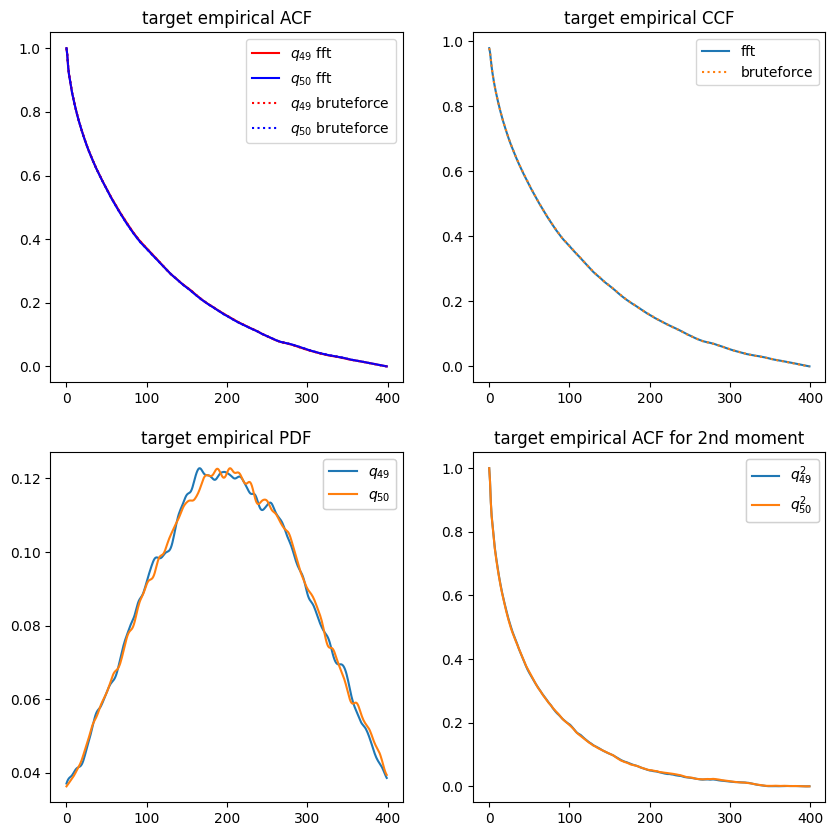

In [13]:
# Plotting target ACFs and PDF
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
axs[0,0].plot(loss_acf_fft._target.cpu()[...,0],'r', label=r'$q_{49}$ fft')
axs[0,0].plot(loss_acf_fft._target.cpu()[...,1],'b', label=r'$q_{50}$ fft')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,0],'r:', label= r'$q_{49}$ bruteforce')
axs[0,0].plot(loss_acf_bruteforce._target.cpu()[...,1], 'b:', label=r'$q_{50}$ bruteforce')
axs[0,0].legend()
axs[0,0].set_title('target empirical ACF')

axs[0,1].plot(loss_ccf_fft._target.cpu()[...,1:3], label='fft')
axs[0,1].plot(loss_ccf_bruteforce._target.cpu()[...,1:3],':',label='bruteforce')
# legend2 = axs[0,1].legend(iter(bf), ('q bf', 'p bf'), loc=1)
# axs[0,1].add_artist(legend2)
axs[0,1].legend()
axs[0,1].set_title('target empirical CCF')

x_grid=-np.linspace(-5,5,num=sec_length)
pdf = axs[1,0].plot(loss_pdf_empirical1._target.cpu())
legend3 = axs[1,0].legend(iter(pdf), (r'$q_{49}$',r'$q_{50}$'), loc=1)
axs[1,0].add_artist(legend3)
axs[1,0].set_title('target empirical PDF')


print(loss_acf_sec_moment._target.cpu().size())
sec_moment = axs[1,1].plot(loss_acf_sec_moment._target.cpu())
legend4 = axs[1,1].legend(iter(sec_moment), (r'$q_{49}^2$',r'$q_{50}^2$'),loc=1)
axs[1,1].set_title('target empirical ACF for 2nd moment')
axs[1,1].add_artist(legend4)

plt.show()

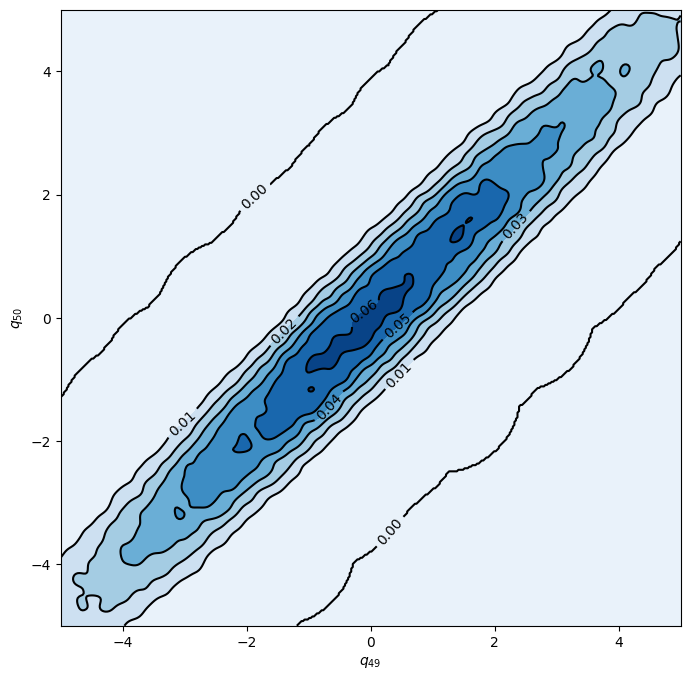

In [14]:
xmin, xmax = -5, 5
ymin, ymax = -5, 5

xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
fig = plt.figure(figsize=(8, 8))
ax = fig.gca()
ax.set_xlim(xmin, xmax)
ax.set_ylim(ymin, ymax)

# Contourf plot
cfset = ax.contourf(xx, yy, loss_pdf_empirical2D._target.cpu(), cmap='Blues')
## Or kernel density estimate plot instead of the contourf plot

# Contour plot
cset = ax.contour(xx, yy, loss_pdf_empirical2D._target.cpu(), colors='k')
# Label plot
ax.clabel(cset, inline=1, fontsize=10)
ax.set_xlabel(r'$q_{49}$')
ax.set_ylabel(r'$q_{50}$')

plt.show()

Text(0.5, 1.0, 'target empirical PDF')

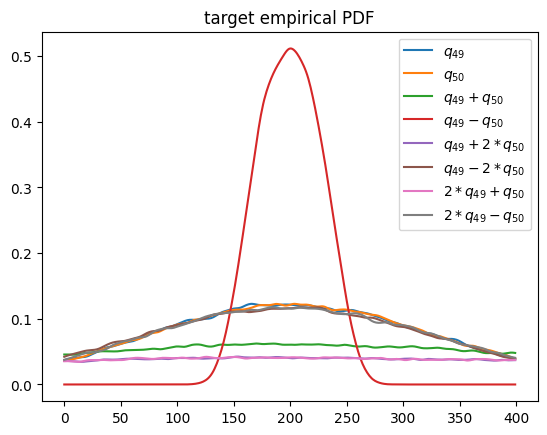

In [15]:
x_grid=-np.linspace(-5,5,num=sec_length)
plt.plot(loss_pdf_empirical1._target.cpu()[...,0],label=r'$q_{49}$')
plt.plot(loss_pdf_empirical1._target.cpu()[...,1],label=r'$q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,0],label=r'$q_{49}+q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,1],label=r'$q_{49}-q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,2],label=r'$q_{49}+2*q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,3],label=r'$q_{49}-2*q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,4],label=r'$2*q_{49}+q_{50}$')
plt.plot(loss_pdf_empirical2._target.cpu()[...,5],label=r'$2*q_{49}-q_{50}$')
plt.legend()
plt.title('target empirical PDF')

In [16]:
class Model:
    def __init__(self, net):

        self.x_acf_s = None
        self.x_ccf_s = None
        self.x_pdf_s = None
        self.x_pdf2_s = None
        self.x_acf2_s = None
        self.s_collect = []

        self.net = net

        self.T_error=[]
        self.V_error=[]
        self.T_ccf=[]
        self.V_ccf=[]
        self.T_pdf=[]
        self.V_pdf=[]
        self.T_pdf2=[]
        self.V_pdf2=[]
        self.T_acf=[]
        self.V_acf=[]
        self.T_acf2=[]
        self.V_acf2=[]
        self.Step=[]
        self.iter = 0
        self.time = 0

    def train_U(self, x):
        return self.net(x)

    def predict_U(self, x):
        return self.train_U(x)

    def likelihood_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        loss = torch.reciprocal(2. * self.x_acf_s ** 2) * loss_acf.detach()      \
               + torch.reciprocal(2. * self.x_ccf_s ** 2) * loss_ccf.detach()    \
               + torch.reciprocal(2. * self.x_pdf_s ** 2) * loss_pdf.detach()    \
               + torch.reciprocal(2. * self.x_pdf2_s ** 2) * loss_pdf2.detach()  \
               + torch.reciprocal(2. * self.x_acf2_s ** 2) * loss_acf2.detach()  \
               + torch.log(self.x_acf_s * self.x_ccf_s * self.x_pdf_s * self.x_pdf2_s * self.x_acf2_s)
        return loss

    def true_loss(self, loss_acf, loss_ccf, loss_pdf, loss_pdf2, loss_acf2):
        return torch.reciprocal(2. * self.x_acf_s.detach() ** 2) * loss_acf + torch.reciprocal(2. * self.x_ccf_s.detach() ** 2) * loss_ccf + torch.reciprocal(2. * self.x_pdf_s.detach() ** 2) * loss_pdf + torch.reciprocal(2. * self.x_pdf2_s.detach() ** 2) * loss_pdf2 + torch.reciprocal(2. * self.x_acf2_s.detach() ** 2) * loss_acf2


    def run_baseline(self):
        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        for step in range(20000):
            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val)+ loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break

        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')



    def run_AW(self):
        self.x_acf_s = nn.Parameter(self.x_acf_s, requires_grad=True)
        self.x_ccf_s = nn.Parameter(self.x_ccf_s, requires_grad=True)
        self.x_pdf_s = nn.Parameter(self.x_pdf_s, requires_grad=True)
        self.x_pdf2_s = nn.Parameter(self.x_pdf2_s, requires_grad=True)
        self.x_acf2_s = nn.Parameter(self.x_acf2_s, requires_grad=True)


        optimizer_adam = optim.Adam(self.net.parameters(), lr=1e-3)
        optimizer_adam_weight = optim.Adam([self.x_acf_s] + [self.x_ccf_s] + [self.x_pdf_s] + [self.x_pdf2_s] + [self.x_acf2_s],
                                                     lr=1e-3)

        for step in range(20000):
            self.s_collect.append([self.iter, self.x_acf_s.item(), self.x_ccf_s.item(), self.x_pdf_s.item(), self.x_pdf2_s.item(), self.x_acf2_s.item()])

            optimizer_adam.zero_grad()
            ini = np.random.randn(2*sec_length, batch*self.net.lstm.input_size).astype(np.float32) 
            input = torch.from_numpy(ini.reshape(2*sec_length, batch, self.net.lstm.input_size)).to(device)
            prediction, _ = self.train_U(input)
            prediction = prediction[-LAGS:,:,:]
            loss = self.true_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam.step()
            self.iter += 1
            if step % 50 == 0: 
                with torch.no_grad():
                    loss = loss_acf_fft(prediction)+loss_ccf_fft(prediction)+loss_pdf_empirical1(prediction)+loss_pdf_empirical2(prediction)+loss_acf_sec_moment(prediction**2)
                    pred_val, _ = self.predict_U(val_set)
                    pred_val = pred_val[-LAGS:,:,:]
                    loss_val = loss_acf_bruteforce(pred_val)+loss_ccf_bruteforce(pred_val)+ loss_pdf_empirical1(pred_val) + loss_pdf_empirical2(pred_val) + loss_acf_sec_moment(pred_val**2)
                    acf = loss_acf_bruteforce(pred_val)
                    ccf = loss_ccf_bruteforce(pred_val)
                    pdf = loss_pdf_empirical1(pred_val)
                    pdf2 = loss_pdf_empirical2(pred_val)
                    acf_sec_moment = loss_acf_sec_moment(pred_val**2)
                    print('[%d]-th step loss: %.4f, %.4f, acf: %.5f, ccf: %.5f, pdf: %.5f, pdf2: %.5f, acf2: %.5f' % (step, loss, loss_val, acf, ccf, pdf, pdf2, acf_sec_moment))
                    self.T_acf.append(loss_acf_fft(prediction).detach().cpu().numpy())
                    self.V_acf.append(loss_acf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_ccf.append(loss_ccf_fft(prediction).detach().cpu().numpy())
                    self.V_ccf.append(loss_ccf_bruteforce(pred_val).detach().cpu().numpy())
                    self.T_pdf.append(loss_pdf_empirical1(prediction).detach().cpu().numpy())
                    self.V_pdf.append(loss_pdf_empirical1(pred_val).detach().cpu().numpy())
                    self.T_pdf2.append(loss_pdf_empirical2(prediction).detach().cpu().numpy())
                    self.V_pdf2.append(loss_pdf_empirical2(pred_val).detach().cpu().numpy())
                    self.T_acf2.append(loss_acf_sec_moment(prediction**2).detach().cpu().numpy())
                    self.V_acf2.append(loss_acf_sec_moment(pred_val**2).detach().cpu().numpy())
                    self.T_error.append(loss.detach().cpu().numpy())
                    self.V_error.append(loss_val.detach().cpu().numpy())
                    self.Step.append(step)
            if loss <=0.0005 and loss_val <=0.0005:
                break
            optimizer_adam_weight.zero_grad()
            loss = self.likelihood_loss(loss_acf_fft(prediction), loss_ccf_fft(prediction),loss_pdf_empirical1(prediction),loss_pdf_empirical2(prediction),loss_acf_sec_moment(prediction**2))
            loss.backward()
            optimizer_adam_weight.step()
            
        if loss > 0.0005 or loss_val > 0.0005:
            print ('Training failed')
        print('Training finished')


    def train(self):
        self.x_acf_s = torch.tensor(2.).float()
        self.x_ccf_s = torch.tensor(2.).float()
        self.x_pdf_s = torch.tensor(0.2).float()
        self.x_pdf2_s = torch.tensor(0.2).float()
        self.x_acf2_s = torch.tensor(0.2).float()
        start_time = time.time()
        if model_type == 0:
            self.run_baseline()
        elif model_type == 1:
            self.run_AW()
        elapsed = time.time() - start_time
        self.time = elapsed
        print('Training time: %.2f' % elapsed)
        avg_time = elapsed/self.iter
        print('Training time per iteration: %.2f' % avg_time)
        print('Number of Iterations:%d' %self.iter)

In [17]:
### Defining SINN model
net = SINN(2, 75, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension

In [18]:
model = Model(net=net)

In [19]:
model_type = 1

In [20]:
model.train()

[0]-th step loss: 0.8260, 0.8227, acf: 0.09871, ccf: 0.09895, pdf: 0.29319, pdf2: 0.28971, acf2: 0.04214
[50]-th step loss: 0.2942, 0.3502, acf: 0.06122, ccf: 0.06109, pdf: 0.10427, pdf2: 0.09109, acf2: 0.03255
[100]-th step loss: 0.1454, 0.1461, acf: 0.04767, ccf: 0.04758, pdf: 0.02060, pdf2: 0.01997, acf2: 0.01028
[150]-th step loss: 0.0875, 0.0694, acf: 0.02355, ccf: 0.02348, pdf: 0.01140, pdf2: 0.01042, acf2: 0.00059
[200]-th step loss: 0.0741, 0.0788, acf: 0.02761, ccf: 0.02753, pdf: 0.00622, pdf2: 0.01495, acf2: 0.00252
[250]-th step loss: 0.1010, 0.1489, acf: 0.05985, ccf: 0.05974, pdf: 0.00531, pdf2: 0.01202, acf2: 0.01200
[300]-th step loss: 0.1202, 0.1299, acf: 0.05308, ccf: 0.05320, pdf: 0.00587, pdf2: 0.00501, acf2: 0.01276
[350]-th step loss: 0.0363, 0.0437, acf: 0.01999, ccf: 0.02009, pdf: 0.00098, pdf2: 0.00077, acf2: 0.00190
[400]-th step loss: 0.0783, 0.0774, acf: 0.03801, ccf: 0.03810, pdf: 0.00007, pdf2: 0.00009, acf2: 0.00110
[450]-th step loss: 0.0963, 0.0914, acf:

In [21]:
def draw_loss(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot",fontsize=15) 
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'r',label='Training error')
    plt.plot(model.Step, model.V_error,'b--',label='Validation error')
#     plt.loglog(model.Step, model.T_error,'r',label='Training error')
#     plt.loglog(model.Step, model.V_error,'b--',label='Validation error')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)

In [22]:
def draw_errors(model):
    ### Plotting the training and the generalization error
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Error plot for loss functions w/o coeff",fontsize=15)
    plt.yscale('log')
    plt.plot(model.Step, model.T_error,'k',label='Training error')
    plt.plot(model.Step, model.V_error,'k--')
    plt.plot(model.Step, model.T_acf,'r',label='acf error')
    plt.plot(model.Step, model.V_acf,'r--')
    plt.plot(model.Step, model.T_ccf,'b',label='ccf error')
    plt.plot(model.Step, model.V_ccf,'b--')
    plt.plot(model.Step, model.T_pdf,'y',label='pdf error')
    plt.plot(model.Step, model.V_pdf,'y--')
    plt.plot(model.Step, model.T_pdf2,'m',label='pdf2 error')
    plt.plot(model.Step, model.V_pdf2,'m--')
    plt.plot(model.Step, model.T_acf2,'g',label='acf2 error')
    plt.plot(model.Step, model.V_acf2,'g--')
    
#     plt.loglog(model.Step, model.T_error,'k',label='Training error')
#     plt.loglog(model.Step, model.V_error,'k--')
#     plt.loglog(model.Step, model.T_acf,'r',label='acf error')
#     plt.loglog(model.Step, model.V_acf,'r--')
#     plt.loglog(model.Step, model.T_ccf,'b',label='ccf error')
#     plt.loglog(model.Step, model.V_ccf,'b--')
#     plt.loglog(model.Step, model.T_pdf,'y',label='pdf error')
#     plt.loglog(model.Step, model.V_pdf,'y--')
#     plt.loglog(model.Step, model.T_pdf2,'m',label='pdf2 error')
#     plt.loglog(model.Step, model.V_pdf2,'m--')
#     plt.loglog(model.Step, model.T_acf2,'g',label='acf2 error')
#     plt.loglog(model.Step, model.V_acf2,'g--')
    plt.xlabel(r'Training times $n$',fontsize=15)
    plt.ylabel(r'$l_1+l_2$',fontsize=15)
    plt.legend(frameon=False,fontsize=15, bbox_to_anchor=(1.1, 1.05))

In [23]:
def draw_adaptive_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
#     plt.yscale('log')
    plt.plot(s_collect[:, 0], s_collect[:, 1], 'r-', label=r'$\epsilon_{acf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 2], 'b-', label='$\epsilon_{ccf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 3], 'y-', label='$\epsilon_{pdf}$')
    plt.plot(s_collect[:, 0], s_collect[:, 4], 'm-', label='$\epsilon_{pdf2}$')
    plt.plot(s_collect[:, 0], s_collect[:, 5], 'g-', label='$\epsilon_{acf2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$s$')
#     plt.xscale('log')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

In [24]:
def draw_epoch_w(model):
    s_collect = np.array(model.s_collect)
    np.savetxt('s_RAM-AW.npy', s_collect)
    plt.yscale('log')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 1]**2), 'r-', label=r'$\frac{1}{2\epsilon_{acf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 2]**2), 'b-', label=r'$\frac{1}{2\epsilon_{ccf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 3]**2), 'y-', label=r'$\frac{1}{2\epsilon_{pdf}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 4]**2), 'm-', label=r'$\frac{1}{2\epsilon_{pdf2}^2}$')
    plt.plot(s_collect[:, 0], np.reciprocal(2. * s_collect[:, 5]**2), 'g-', label=r'$\frac{1}{2\epsilon_{acf2}^2}$')
    plt.xlabel('$Iters$')
    plt.ylabel('$\omega$')
    plt.legend()
#     plt.savefig('2dpossion_S_RAM-AW.pdf')
    plt.show()

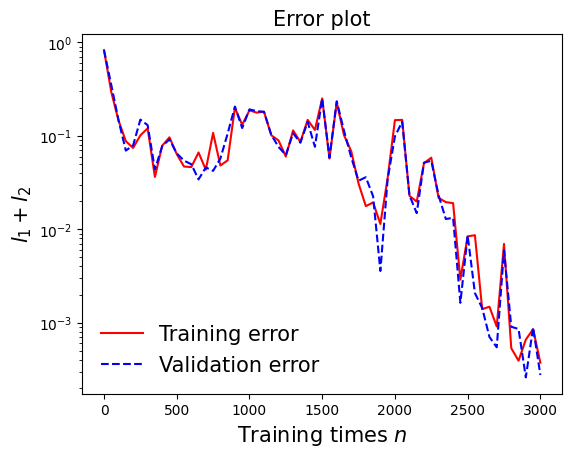

In [25]:
draw_loss(model)

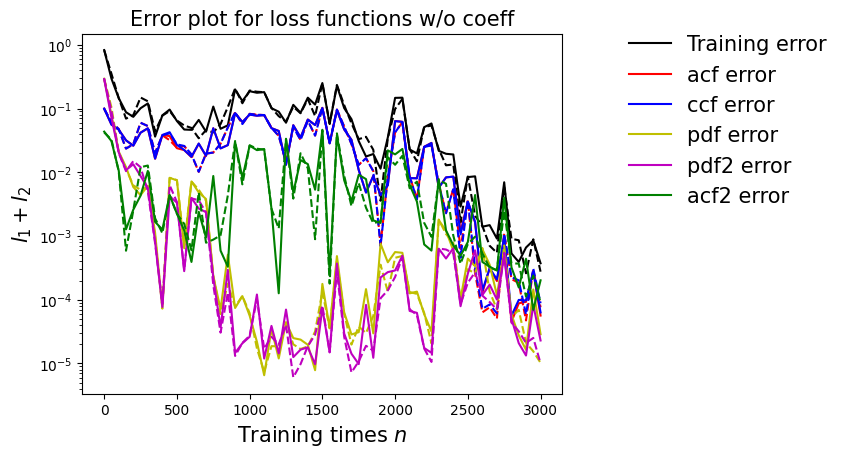

In [26]:
draw_errors(model)

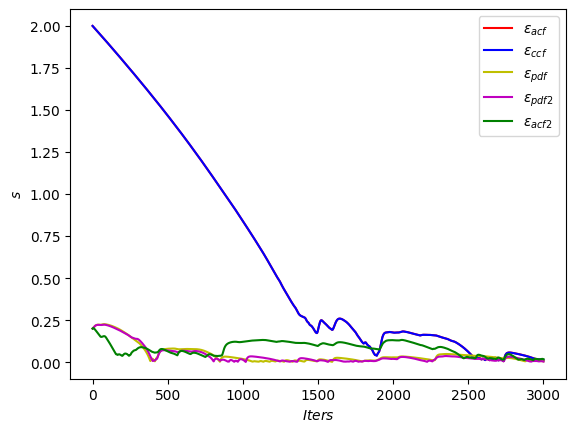

In [27]:
draw_adaptive_w(model)

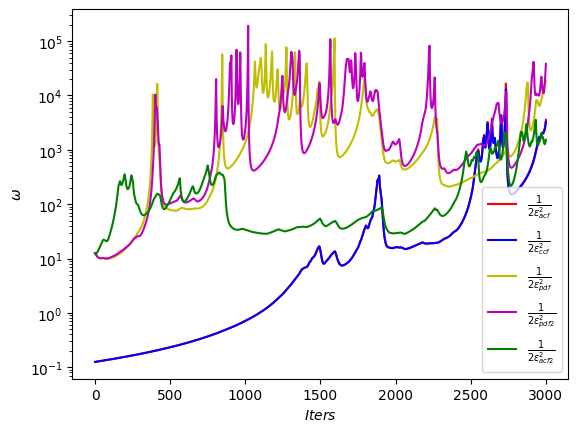

In [28]:
draw_epoch_w(model)

## Test 1: plot the sample path generated by SINN and the exact sample path 

In [29]:
def test1(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    # Test 1: plot the sample path generated by SINN and the exact sample path 
    skip = 0

    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.plot(T[skip:]-T[skip], Traj[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$\tilde{q}_1(t)$ and $\tilde{q}_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.plot(T[skip:]-T[skip], prediction[skip:, 0])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_1(t)$ and $q_2(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF

In [30]:
def test2(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 2: plot the CCF of the sample path generated by the SINN and the exact CCF  
    acf_p=StatLoss.acf(Pred[-sec_length:,:,:])
    acf_t=StatLoss.acf(target)
    corr_p1=acf_p.detach().cpu().numpy()
    corr_t1=acf_t.detach().cpu().numpy()
    ccf_p=StatLoss.ccf(Pred[-sec_length:,:,:])
    ccf_t=StatLoss.ccf(target)
    corr_p2=ccf_p.detach().cpu().numpy()
    corr_t2=ccf_t.detach().cpu().numpy()
    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_1$',fontsize=15)    
    plt.plot(T, corr_t1[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $\tilde{q}_2$',fontsize=15)          
    plt.plot(T, corr_t1[...,-1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, corr_p1[...,-1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized CCF',fontsize=15)    
    plt.plot(T, corr_t2[:,:],'r')        # correlation function of the target 
    plt.plot(T, corr_p2[:,:], 'b--')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
#     plt.ylim(-0.05,0.05)

## Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  

In [31]:
def test3(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    
    # Test 3: plot the PDF of the sample path generated by SINN and the exact PDF  
    rho_data =  StatLoss.gauss_kde(target, -5, 5, 400, None).cpu()
    rho_input = StatLoss.gauss_kde(ran_input, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    rho_data2 =  StatLoss.gauss_kde6(target, -5, 5, 400, None).cpu()
    rho_prediction2 = StatLoss.gauss_kde6(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()


    x=np.linspace(-5, 5, 400)
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function",fontsize=15)    
    plt.plot(x, rho_data.numpy()[...,0],label=r'Exact PDF of $q_{49}$')    # target PDF
    plt.plot(x, rho_data.numpy()[...,1],label=r'Exact PDF of $q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction.numpy()[...,0], ':',label=r'PDF of the output $q_{49}$')  # PDF after the training 
    plt.plot(x, rho_prediction.numpy()[...,1], ':',label=r'PDF of the output $q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,0],label=r'Exact PDF of $q_{49}+q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,1],label=r'Exact PDF of $q_{49}-q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,0], ':',label=r'PDF of the output $q_{49}+q_{50}$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,1], ':',label=r'PDF of the output $q_{49}-q_{50}$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,2],label=r'Exact PDF of $q_{49}+2q_{50}$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,3],label=r'Exact PDF of $q_{49}-2q_{50}$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,2], ':',label=r'PDF of the output $q_{49}+2\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,3], ':',label=r'PDF of the output $q_{49}-2\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    
    fig = plt.figure(3)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r"Equilibrium probability density function of sum and diff",fontsize=15)    
    plt.plot(x, rho_data2.numpy()[...,4],label=r'Exact PDF of $2q_{49}+\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_data2.numpy()[...,5],label=r'Exact PDF of $2q_{49}-\tilde{q}_2$')    # target PDF
    plt.plot(x, rho_input.numpy(), 'b--', label=r'PDF of the input')     # PDF of the input
    plt.plot(x, rho_prediction2.numpy()[...,4], ':',label=r'PDF of the output $2q_{49}+\tilde{q}_2$')  # PDF after the training 
    plt.plot(x, rho_prediction2.numpy()[...,5], ':',label=r'PDF of the output $2q_{49}-\tilde{q}_2$')  # PDF after the training 
    plt.xlim(-5,5)
    plt.ylim(0,0.6)
    plt.xlabel(r'$x$',fontsize=15)
    plt.ylabel(r'$\rho(x)$',fontsize=15)
    plt.legend(frameon=False,fontsize=10)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 4: Comparing the higher-order ACF

In [32]:
def test4(model):
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    # Test 4: Comparing the higher-order ACF
    acf2=StatLoss.acf(target**2)
    pred_norm=torch.from_numpy((prediction).reshape(sec_length, batch,2))
    acf2_app=StatLoss.acf(pred_norm**2)

    
    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{49}^2$',fontsize=15)    
    plt.plot(T, acf2.detach().cpu().numpy()[...,0],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,0], 'b--',label='SINN')        # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()
    
    fig = plt.figure(1)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title(r'Normalized ACF of $q_{50}^2$',fontsize=15)          
    plt.plot(T, acf2.detach().cpu().numpy()[...,1],'r',label='Exact')        # correlation function of the target 
    plt.plot(T, acf2_app.detach().cpu().numpy()[...,1], 'b--',label='SINN')     # Correlation function after the training      # Correlation function after the training 
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$C(t)/C(0)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.xlim(0,T[-1])
    plt.yticks([-0.2,0,0.2,0.4,0.6,0.8,1.0],fontsize=15)
    plt.legend()    

## Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 

In [33]:
def test5(model):
    # Test 5: plot the expolation result, i.e. Prediction of the FPU-Langevin dynamics for longer time 
    [a,b,c]=input.size()
    skip=20
    scale=10
    burnin=3
    fold=800
    batch_new=50
    ran_input=torch.randn(((scale-burnin)*a,batch_new,c),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred_L, _= model.predict_U(ran_input)
    prediction_ext=Pred_L.detach().cpu().numpy().reshape((scale-burnin)*a, batch_new,2)
    ccf_p=StatLoss.ccf(Pred_L,method='bruteforce')

    LT=np.linspace(0,(scale-burnin)*a*delta_t,num=(scale-burnin)*a+1)
    LT=LT[0:-1]


    fig = plt.figure(0)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q49_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 0],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{49}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

    fig = plt.figure(2)
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Short-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,80])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)



    fig = plt.figure(figsize=(16, 4))
    ax = fig.add_axes([0.15, 0.15, 0.75, 0.75])
    plt.title("Long-time trajectories",fontsize=15)
    plt.plot(t_store[Toss:]-t_store[Toss],q50_store[:,0],label='MD simulation')
    plt.plot(LT[skip:]-LT[skip], prediction_ext[skip:, 0, 1],'--',label='SINN simulation')
    plt.xlim([0,500])
    plt.xlabel(r'$t$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.legend(frameon=False,fontsize=15)
    plt.yticks([-2,-1,0,1,2],fontsize=15)
    plt.xticks(fontsize=15)

## Test 6: comparing scatter plots

In [34]:
def test6(model):
    # Test 6: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    fig = plt.figure(0)
    plt.title("MD trajectories",fontsize=15) 
    plt.scatter(Traj[:,:,0], Traj[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15) 


    fig = plt.figure(1)
    plt.title("SINN trajectories",fontsize=15)    
    plt.scatter(prediction[:,:,0],prediction[:,:,1])
    plt.xlabel(r'$q_{49}(t)$',fontsize=15)
    plt.ylabel(r'$q_{50}(t)$',fontsize=15)
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)

## Test 7: comparing joint PDF contours

In [35]:
def test7(model):
    # Test 5: scatter plot of SINN
    ran_input=torch.randn(input.size(),dtype=input.dtype,layout=input.layout, device=input.device)
    Pred,_= model.predict_U(ran_input)
    prediction=Pred[-sec_length:,:,:].detach().cpu().numpy().reshape(sec_length, batch, 2)
    
    rho_data =  StatLoss.gauss_kde2D(target, -5, 5, 400, None).cpu()
    rho_prediction = StatLoss.gauss_kde2D(Pred[-sec_length:,:,:].detach(), -5, 5, 400,None).cpu()
    
    fig = plt.figure(0, figsize=(5, 5))
    plt.title("PDF Contours",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

    xx, yy = np.mgrid[xmin:xmax:400j, ymin:ymax:400j]
    axs[0]  = fig.gca()
    plt.xlim(xmin, xmax)
    plt.ylim(ymin, ymax)
    
    plt.contour(xx,yy,rho_data.numpy(),colors='r')
    plt.contour(xx,yy,rho_prediction.numpy(),colors='b',linestyles='dashed')

    plt.xlabel(r'$q_{49}$')
    plt.ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(1,figsize=(5, 5))
    plt.title("MD trajectories",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_data.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_data.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

    
    
    fig = plt.figure(2,figsize=(5, 5))
    plt.title("SINN output",fontsize=15) 
    xmin, xmax = -5, 5
    ymin, ymax = -5, 5

#     xx, yy = np.mgrid[xmin:xmax:20j, ymin:ymax:20j]
    ax  = fig.gca()
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    cfset = ax.contourf(xx, yy, rho_prediction.numpy(), cmap='Blues')
    cset = ax.contour(xx, yy, rho_prediction.numpy(), colors='k')

    ax.clabel(cset, inline=1, fontsize=10)
    ax.set_xlabel(r'$q_{49}$')
    ax.set_ylabel(r'$q_{50}$')

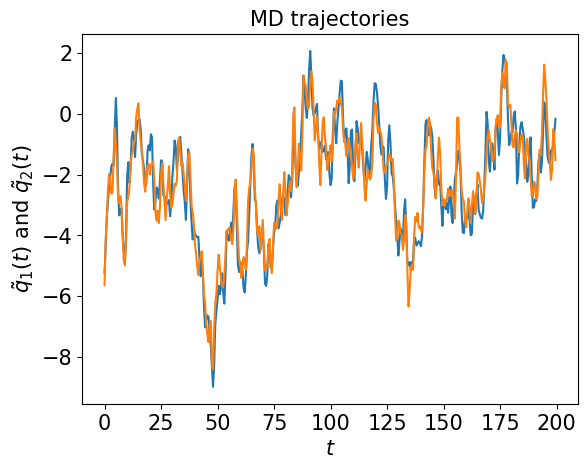

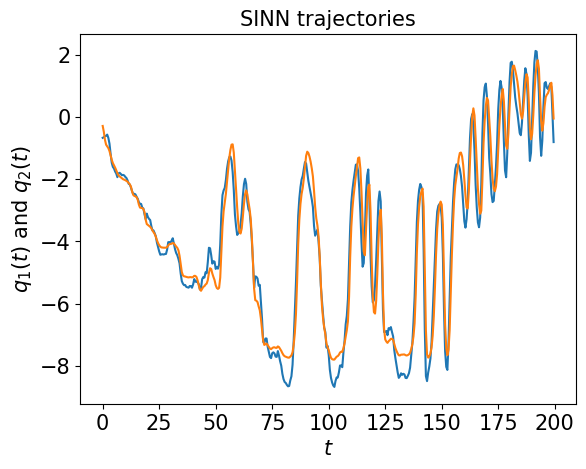

In [36]:
test1(model)

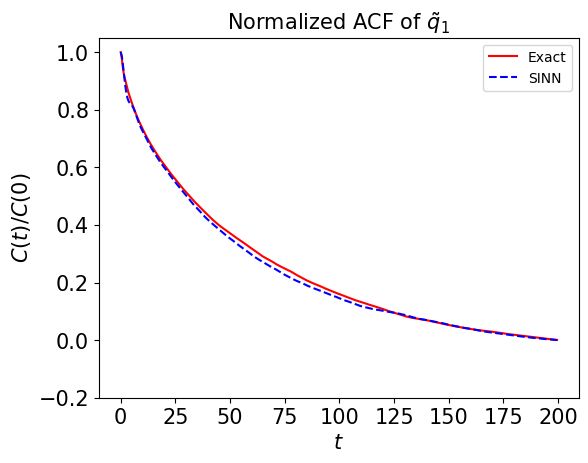

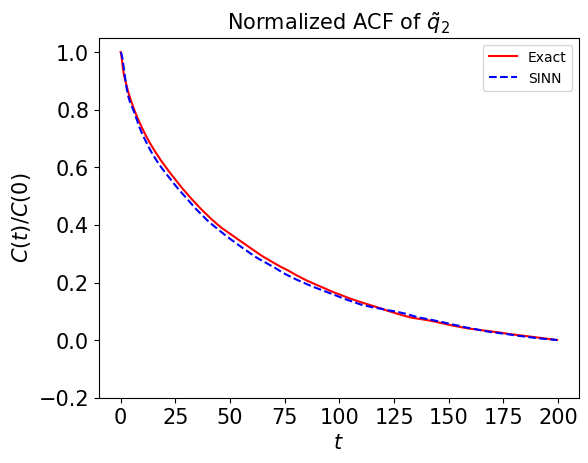

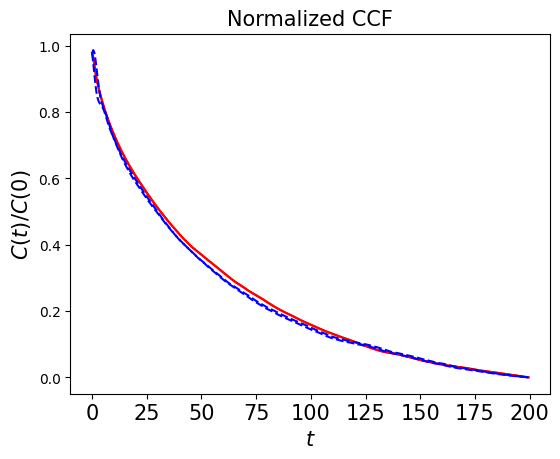

In [37]:
test2(model)

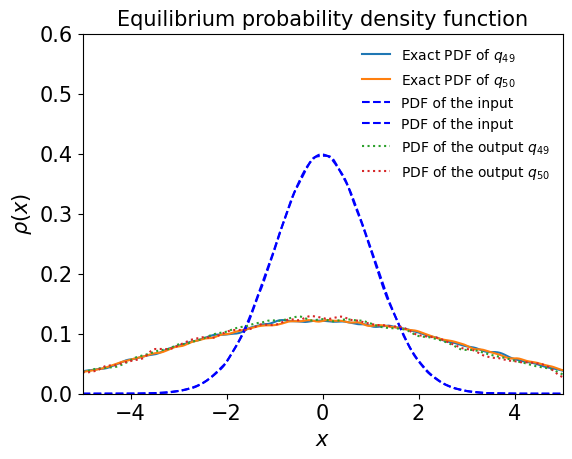

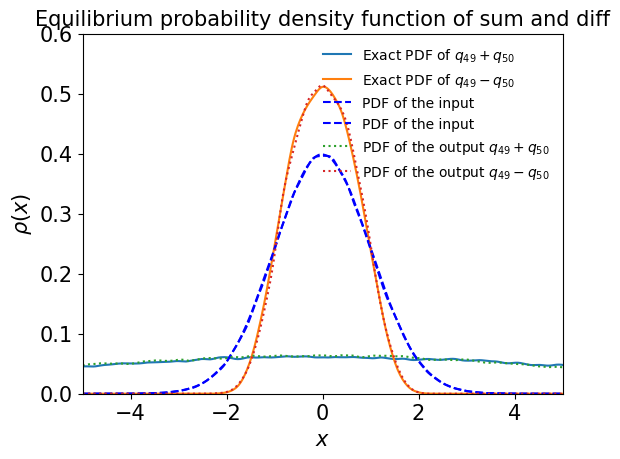

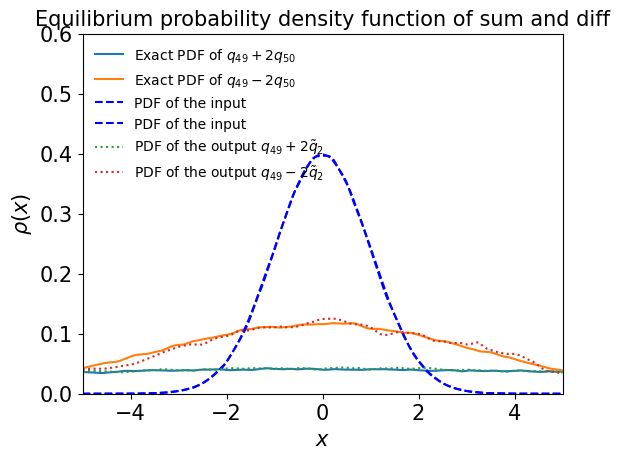

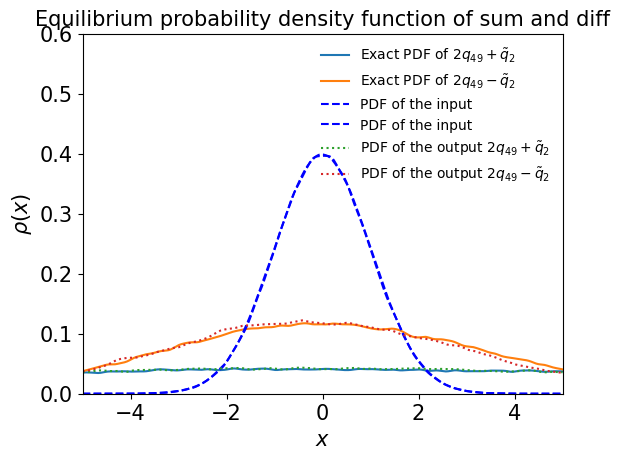

In [38]:
test3(model)

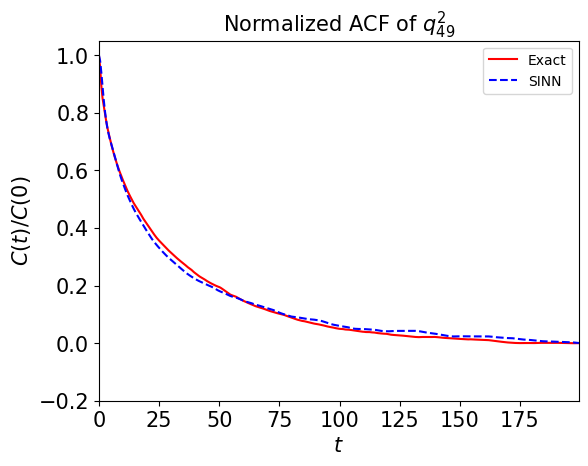

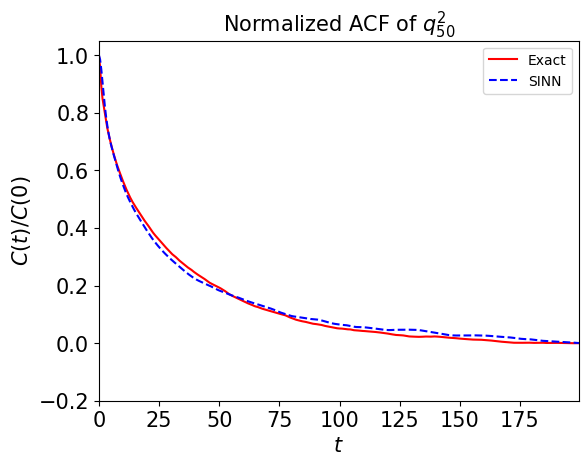

In [39]:
test4(model)

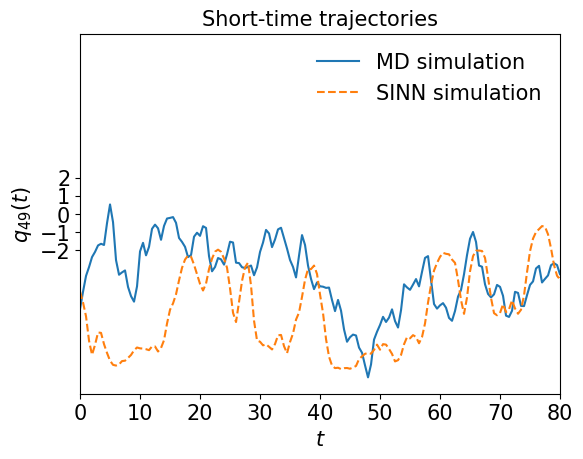

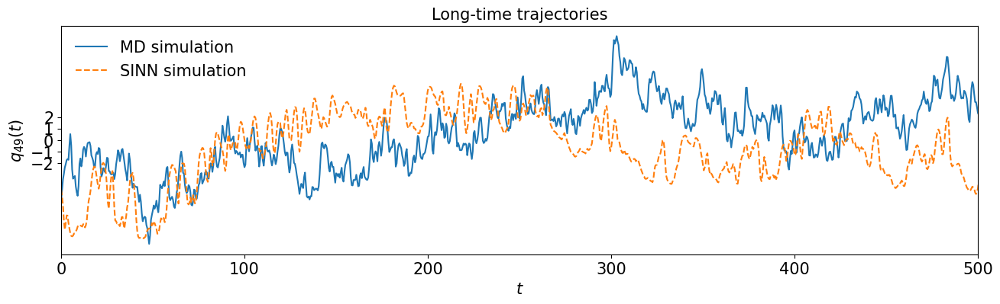

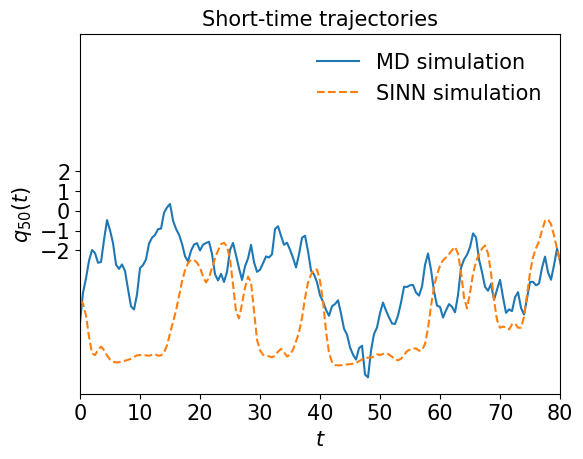

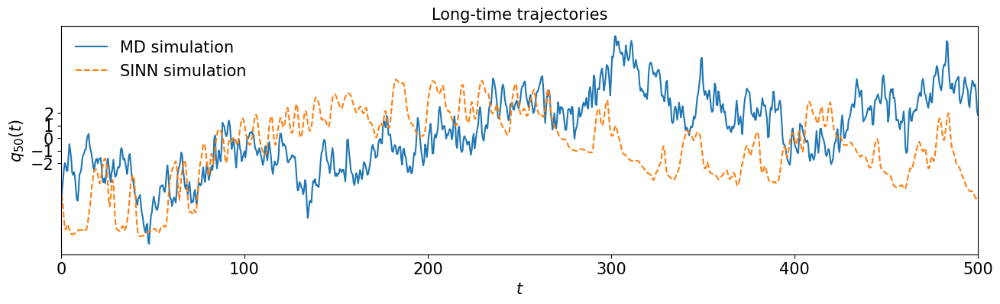

In [40]:
test5(model)

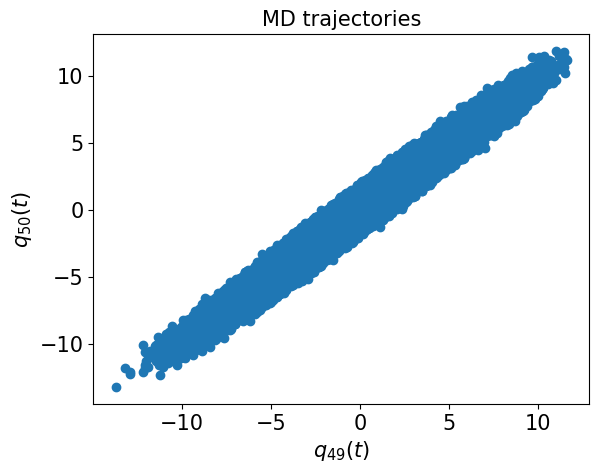

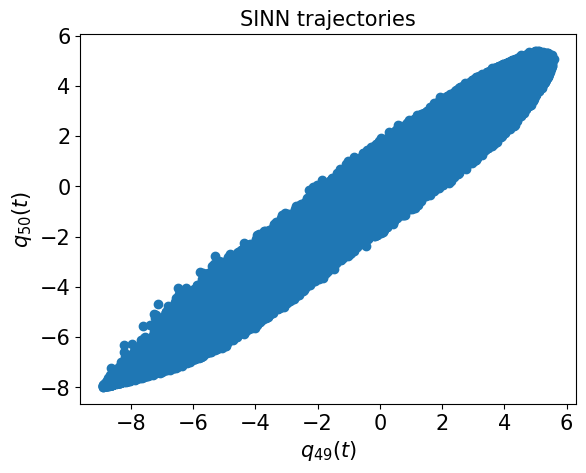

In [41]:
test6(model)

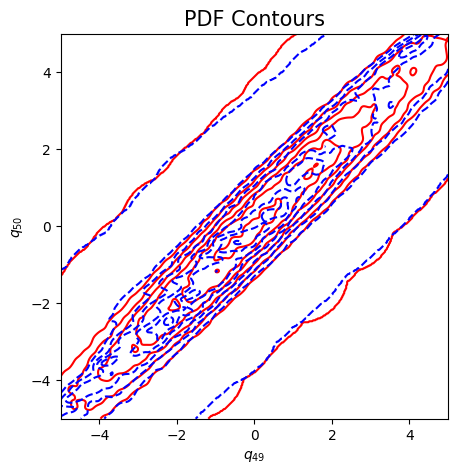

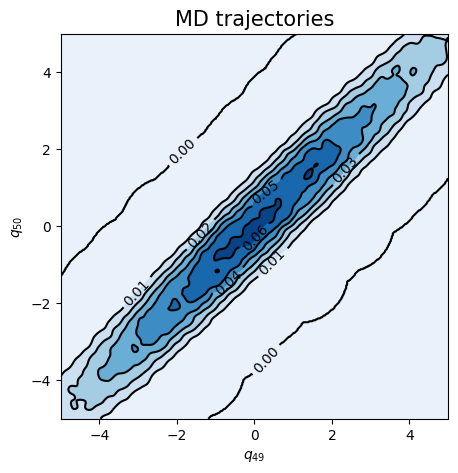

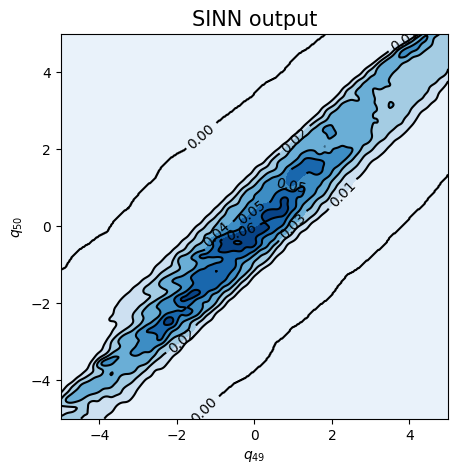

In [42]:
test7(model)

In [43]:
### Defining SINN model
net1 = SINN(2, 75, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model1 = Model(net=net1)
model1.train()

[0]-th step loss: 0.8667, 0.8686, acf: 0.09732, ccf: 0.14683, pdf: 0.29305, pdf2: 0.29015, acf2: 0.04124
[50]-th step loss: 0.3401, 0.3414, acf: 0.06166, ccf: 0.23416, pdf: 0.00853, pdf2: 0.01869, acf2: 0.01833
[100]-th step loss: 0.3358, 0.3359, acf: 0.06705, ccf: 0.21749, pdf: 0.01150, pdf2: 0.02152, acf2: 0.01835
[150]-th step loss: 0.3283, 0.3200, acf: 0.03667, ccf: 0.26265, pdf: 0.00378, pdf2: 0.01495, acf2: 0.00199
[200]-th step loss: 0.3481, 0.3418, acf: 0.02818, ccf: 0.29450, pdf: 0.00386, pdf2: 0.01290, acf2: 0.00238
[250]-th step loss: 0.3359, 0.3343, acf: 0.03733, ccf: 0.27184, pdf: 0.00559, pdf2: 0.01644, acf2: 0.00310
[300]-th step loss: 0.3494, 0.3517, acf: 0.08841, ccf: 0.16109, pdf: 0.00829, pdf2: 0.05962, acf2: 0.03430
[350]-th step loss: 0.1070, 0.0990, acf: 0.01538, ccf: 0.01531, pdf: 0.00829, pdf2: 0.05962, acf2: 0.00042
[400]-th step loss: 0.1100, 0.0992, acf: 0.01568, ccf: 0.01561, pdf: 0.00829, pdf2: 0.05958, acf2: 0.00005
[450]-th step loss: 0.1022, 0.0968, acf:

[3850]-th step loss: 0.0461, 0.0495, acf: 0.01477, ccf: 0.01470, pdf: 0.00829, pdf2: 0.01167, acf2: 0.00005
[3900]-th step loss: 0.0547, 0.0532, acf: 0.01729, ccf: 0.01722, pdf: 0.00829, pdf2: 0.01025, acf2: 0.00014
[3950]-th step loss: 0.0618, 0.0525, acf: 0.01639, ccf: 0.01632, pdf: 0.00829, pdf2: 0.01145, acf2: 0.00007
[4000]-th step loss: 0.0587, 0.0516, acf: 0.01641, ccf: 0.01634, pdf: 0.00829, pdf2: 0.01051, acf2: 0.00010
[4050]-th step loss: 0.0489, 0.0454, acf: 0.01303, ccf: 0.01297, pdf: 0.00829, pdf2: 0.01097, acf2: 0.00010
[4100]-th step loss: 0.0489, 0.0538, acf: 0.01751, ccf: 0.01747, pdf: 0.00829, pdf2: 0.01038, acf2: 0.00014
[4150]-th step loss: 0.0473, 0.0473, acf: 0.01439, ccf: 0.01434, pdf: 0.00829, pdf2: 0.01023, acf2: 0.00004
[4200]-th step loss: 0.0467, 0.0500, acf: 0.01573, ccf: 0.01567, pdf: 0.00829, pdf2: 0.01031, acf2: 0.00005
[4250]-th step loss: 0.0441, 0.0504, acf: 0.01599, ccf: 0.01593, pdf: 0.00829, pdf2: 0.01009, acf2: 0.00005
[4300]-th step loss: 0.0417,

[7650]-th step loss: 0.0012, 0.0018, acf: 0.00040, ccf: 0.00071, pdf: 0.00036, pdf2: 0.00014, acf2: 0.00017
[7700]-th step loss: 0.0014, 0.0012, acf: 0.00030, ccf: 0.00044, pdf: 0.00006, pdf2: 0.00004, acf2: 0.00039
[7750]-th step loss: 0.0031, 0.0023, acf: 0.00027, ccf: 0.00049, pdf: 0.00025, pdf2: 0.00023, acf2: 0.00108
[7800]-th step loss: 0.0006, 0.0007, acf: 0.00014, ccf: 0.00024, pdf: 0.00004, pdf2: 0.00005, acf2: 0.00027
[7850]-th step loss: 0.0014, 0.0014, acf: 0.00041, ccf: 0.00047, pdf: 0.00012, pdf2: 0.00006, acf2: 0.00036
[7900]-th step loss: 0.0008, 0.0007, acf: 0.00008, ccf: 0.00024, pdf: 0.00005, pdf2: 0.00006, acf2: 0.00027
[7950]-th step loss: 0.0009, 0.0006, acf: 0.00010, ccf: 0.00011, pdf: 0.00007, pdf2: 0.00006, acf2: 0.00022
[8000]-th step loss: 0.0013, 0.0012, acf: 0.00041, ccf: 0.00041, pdf: 0.00004, pdf2: 0.00010, acf2: 0.00021
[8050]-th step loss: 0.0004, 0.0003, acf: 0.00006, ccf: 0.00006, pdf: 0.00009, pdf2: 0.00005, acf2: 0.00005
Training finished
Training t

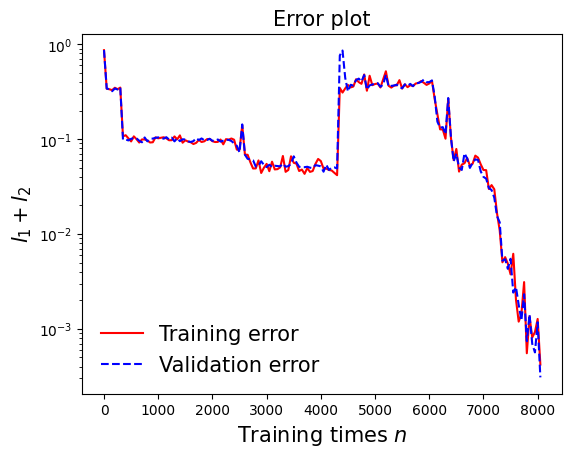

In [44]:
draw_loss(model1)

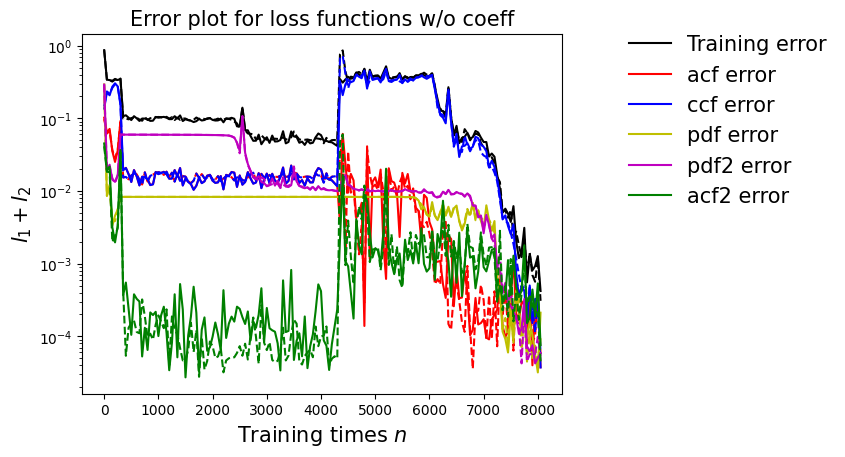

In [45]:
draw_errors(model1)

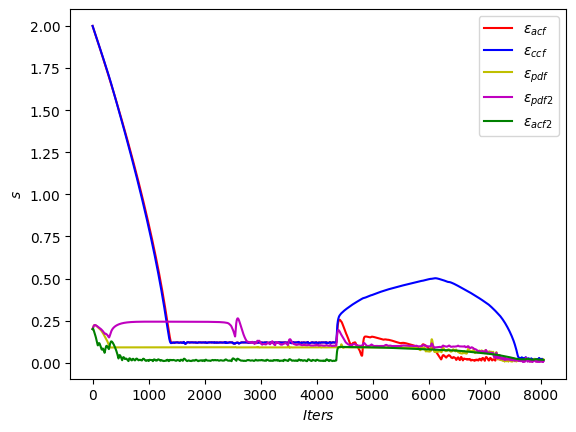

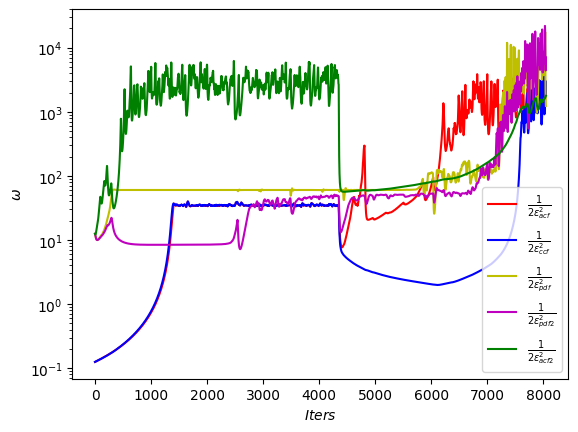

In [46]:
draw_adaptive_w(model1)
draw_epoch_w(model1)

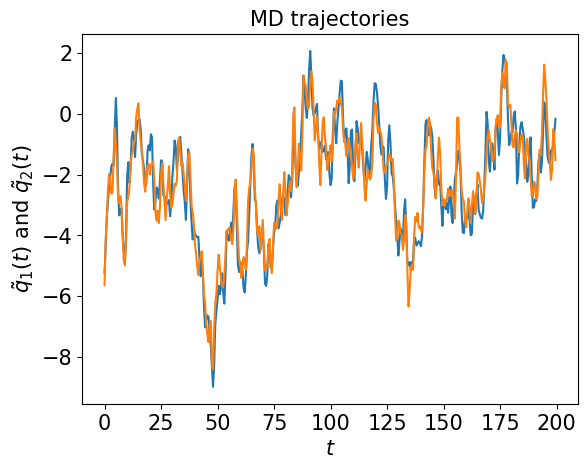

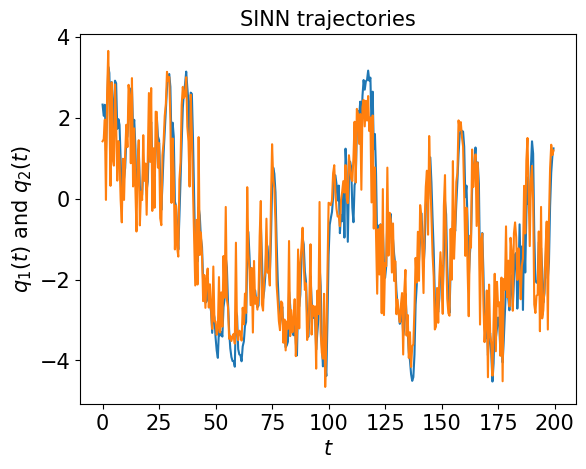

In [47]:
test1(model1)

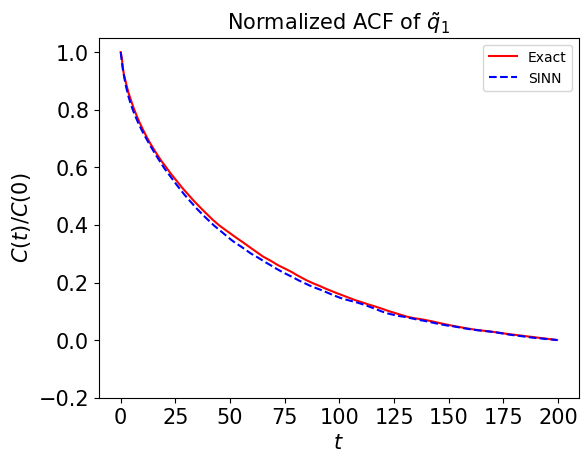

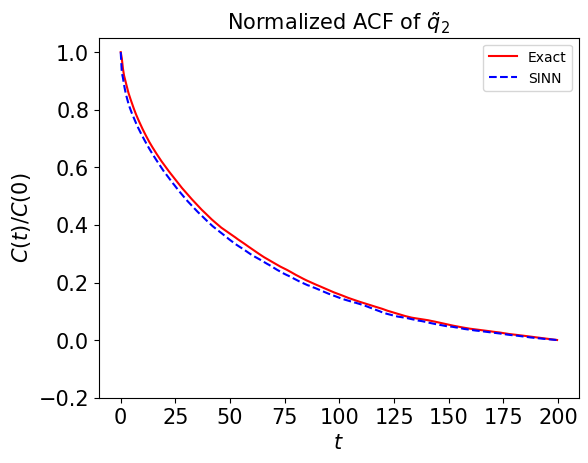

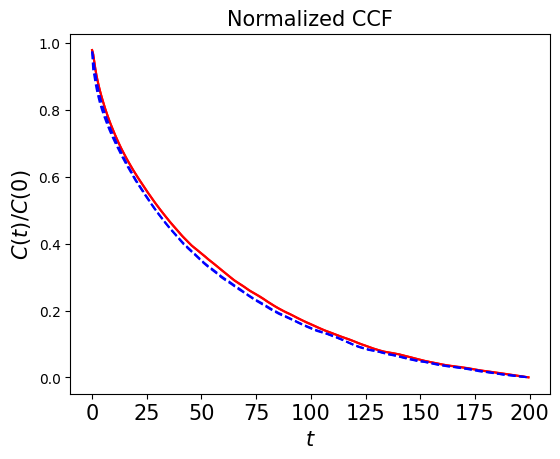

In [48]:
test2(model1)

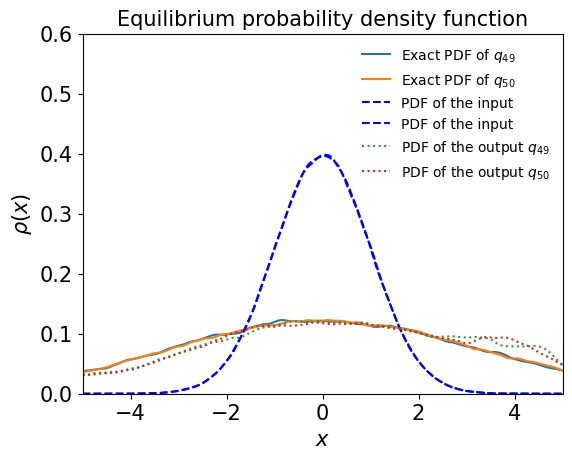

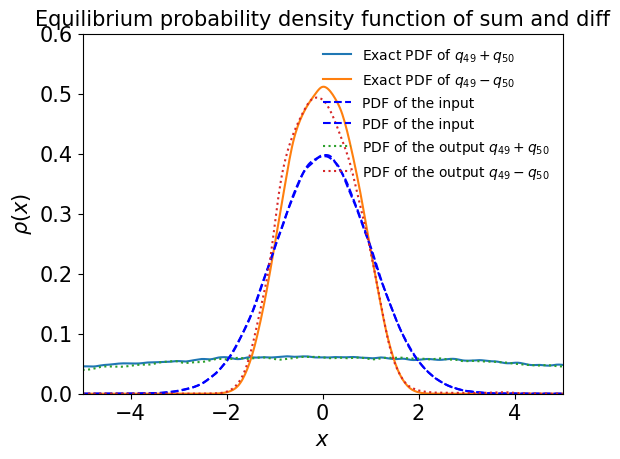

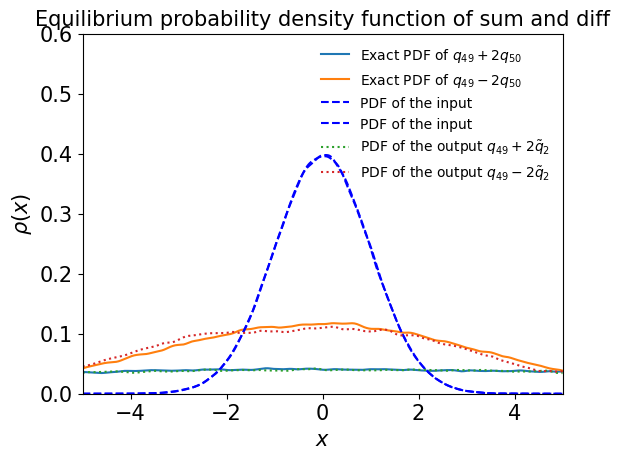

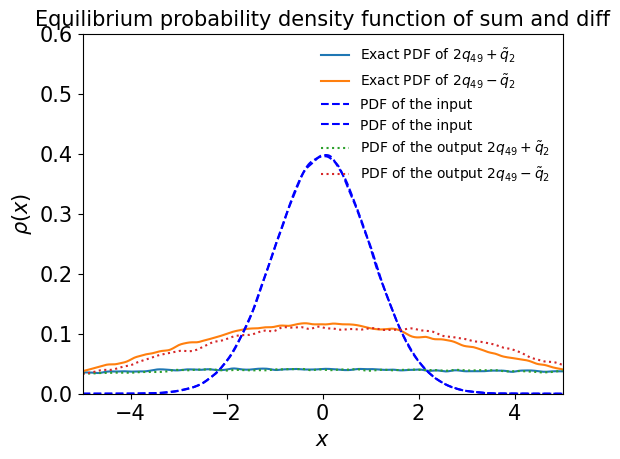

In [49]:
test3(model1)

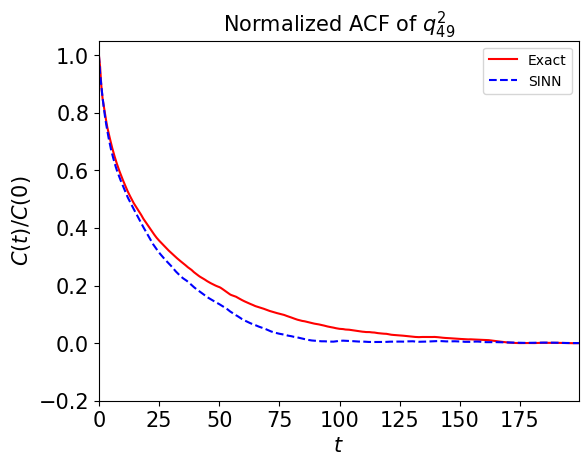

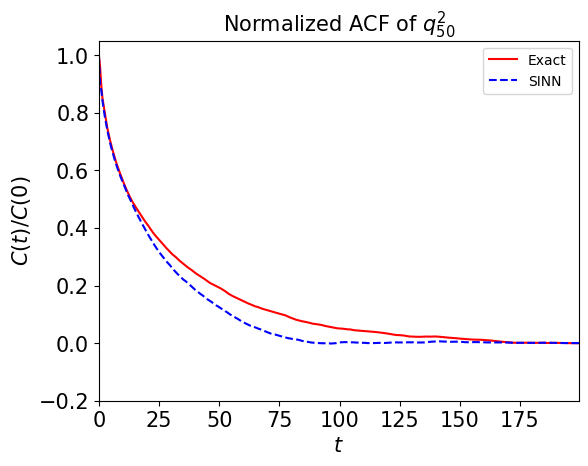

In [50]:
test4(model1)

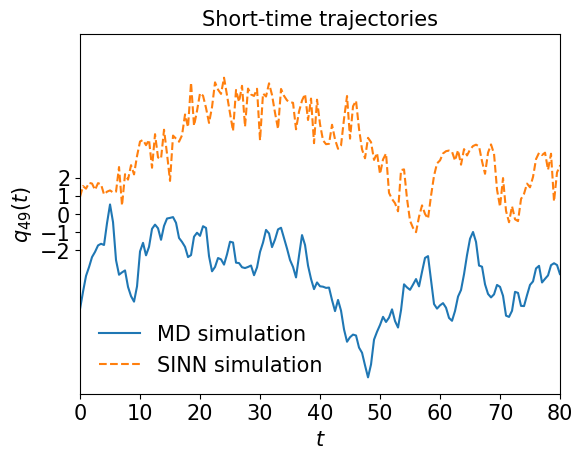

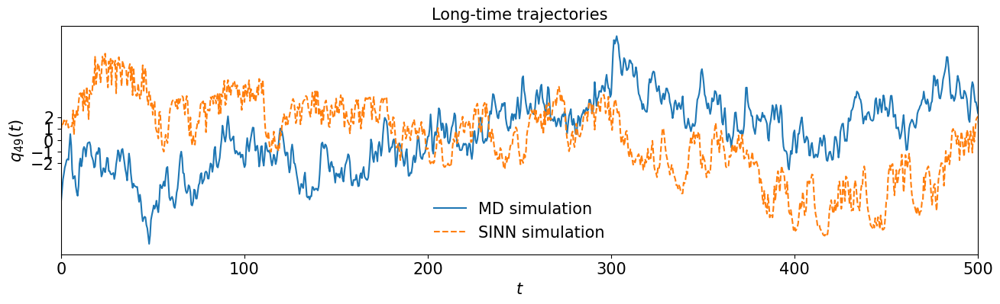

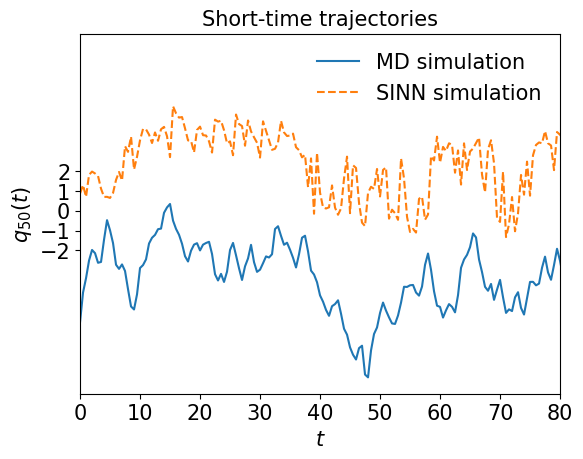

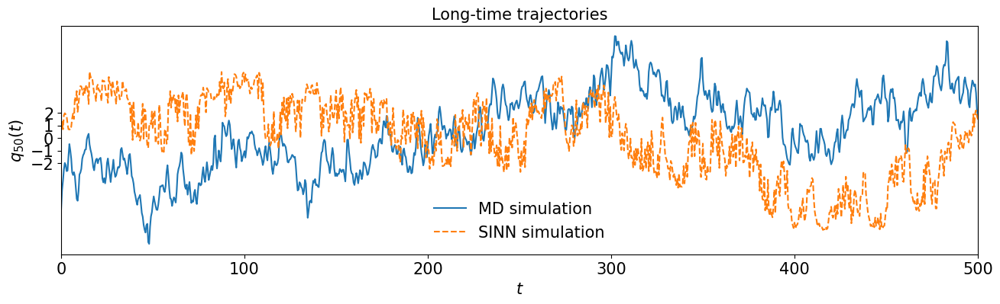

In [51]:
test5(model1)

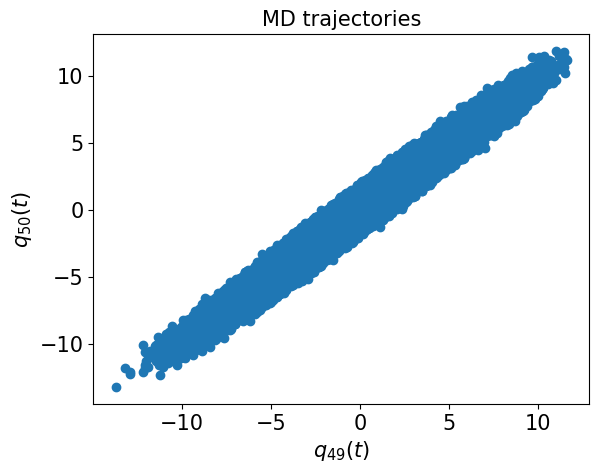

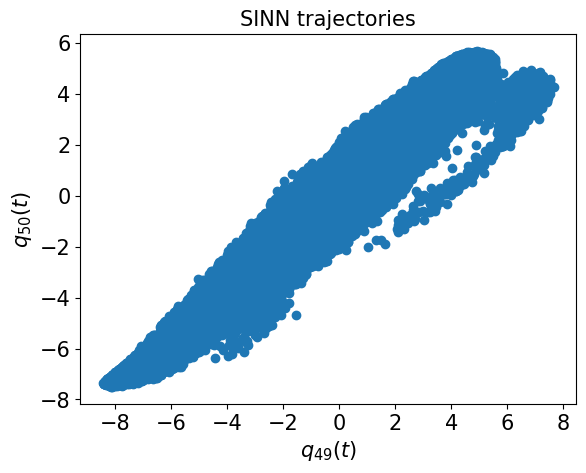

In [52]:
test6(model1)

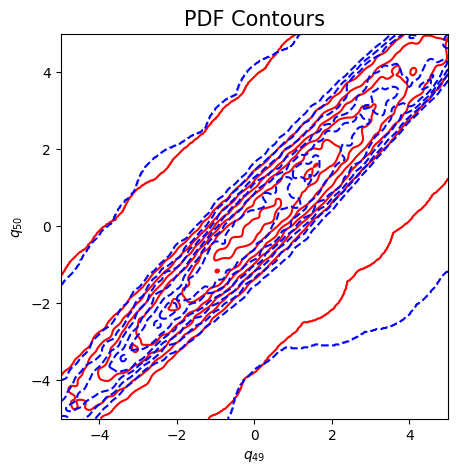

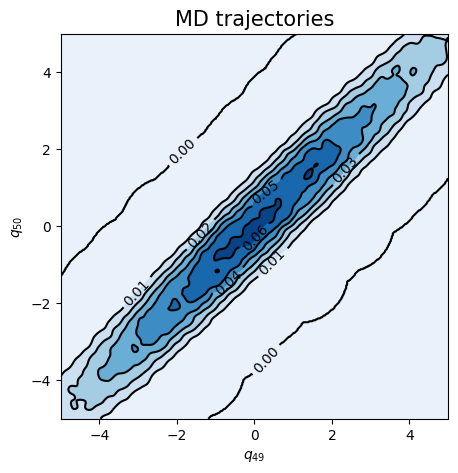

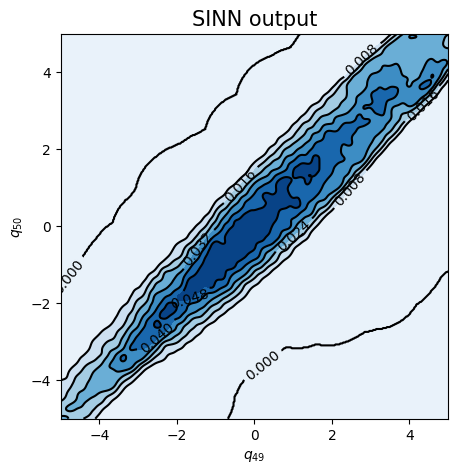

In [53]:
test7(model1)

In [54]:
### Defining SINN model
net2 = SINN(2, 75, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model2 = Model(net=net2)
model2.train()

[0]-th step loss: 0.8611, 0.8621, acf: 0.09717, ccf: 0.14066, pdf: 0.29313, pdf2: 0.29000, acf2: 0.04112
[50]-th step loss: 0.4239, 0.3840, acf: 0.02871, ccf: 0.31241, pdf: 0.02114, pdf2: 0.01841, acf2: 0.00335
[100]-th step loss: 0.3951, 0.4346, acf: 0.00384, ccf: 0.40319, pdf: 0.01161, pdf2: 0.01210, acf2: 0.00391
[150]-th step loss: 0.3376, 0.3297, acf: 0.05740, ccf: 0.22931, pdf: 0.01597, pdf2: 0.01130, acf2: 0.01569
[200]-th step loss: 0.3682, 0.3495, acf: 0.02947, ccf: 0.29960, pdf: 0.00884, pdf2: 0.00923, acf2: 0.00238
[250]-th step loss: 0.3227, 0.3323, acf: 0.02824, ccf: 0.28949, pdf: 0.00573, pdf2: 0.00840, acf2: 0.00041
[300]-th step loss: 0.3490, 0.3508, acf: 0.02071, ccf: 0.31148, pdf: 0.00829, pdf2: 0.00917, acf2: 0.00113
[350]-th step loss: 0.3177, 0.3202, acf: 0.08469, ccf: 0.17567, pdf: 0.01472, pdf2: 0.01199, acf2: 0.03313
[400]-th step loss: 0.3121, 0.3141, acf: 0.04256, ccf: 0.26056, pdf: 0.00251, pdf2: 0.00773, acf2: 0.00073
[450]-th step loss: 0.3733, 0.3623, acf:

[3850]-th step loss: 0.3959, 0.4016, acf: 0.01448, ccf: 0.31911, pdf: 0.00829, pdf2: 0.05953, acf2: 0.00016
[3900]-th step loss: 0.4061, 0.4164, acf: 0.01186, ccf: 0.33647, pdf: 0.00829, pdf2: 0.05953, acf2: 0.00024
[3950]-th step loss: 0.4008, 0.3948, acf: 0.01620, ccf: 0.31046, pdf: 0.00829, pdf2: 0.05955, acf2: 0.00031
[4000]-th step loss: 0.4158, 0.4061, acf: 0.01321, ccf: 0.32488, pdf: 0.00829, pdf2: 0.05954, acf2: 0.00019
[4050]-th step loss: 0.4115, 0.4104, acf: 0.01245, ccf: 0.32995, pdf: 0.00829, pdf2: 0.05953, acf2: 0.00018
[4100]-th step loss: 0.4082, 0.4077, acf: 0.01323, ccf: 0.32648, pdf: 0.00829, pdf2: 0.05954, acf2: 0.00013
[4150]-th step loss: 0.4059, 0.4033, acf: 0.01366, ccf: 0.32160, pdf: 0.00829, pdf2: 0.05954, acf2: 0.00022
[4200]-th step loss: 0.4029, 0.4036, acf: 0.01538, ccf: 0.32033, pdf: 0.00829, pdf2: 0.05953, acf2: 0.00004
[4250]-th step loss: 0.4104, 0.4143, acf: 0.01170, ccf: 0.33455, pdf: 0.00829, pdf2: 0.05954, acf2: 0.00025
[4300]-th step loss: 0.4119,

[7650]-th step loss: 0.4138, 0.4138, acf: 0.01240, ccf: 0.33339, pdf: 0.00829, pdf2: 0.05954, acf2: 0.00015
[7700]-th step loss: 0.4105, 0.4128, acf: 0.01259, ccf: 0.33222, pdf: 0.00829, pdf2: 0.05953, acf2: 0.00013
[7750]-th step loss: 0.4004, 0.4063, acf: 0.01400, ccf: 0.32438, pdf: 0.00829, pdf2: 0.05954, acf2: 0.00005
[7800]-th step loss: 0.4043, 0.4051, acf: 0.01494, ccf: 0.32235, pdf: 0.00829, pdf2: 0.05953, acf2: 0.00002
[7850]-th step loss: 0.4106, 0.4176, acf: 0.01117, ccf: 0.33830, pdf: 0.00829, pdf2: 0.05954, acf2: 0.00030
[7900]-th step loss: 0.4104, 0.4121, acf: 0.01258, ccf: 0.33158, pdf: 0.00829, pdf2: 0.05953, acf2: 0.00013
[7950]-th step loss: 0.4015, 0.4088, acf: 0.01338, ccf: 0.32751, pdf: 0.00829, pdf2: 0.05953, acf2: 0.00007
[8000]-th step loss: 0.4069, 0.4029, acf: 0.01489, ccf: 0.32009, pdf: 0.00829, pdf2: 0.05954, acf2: 0.00004
[8050]-th step loss: 0.4063, 0.4090, acf: 0.01379, ccf: 0.32737, pdf: 0.00829, pdf2: 0.05954, acf2: 0.00005
[8100]-th step loss: 0.4182,

[11450]-th step loss: 0.4038, 0.4128, acf: 0.01290, ccf: 0.33193, pdf: 0.00829, pdf2: 0.05955, acf2: 0.00010
[11500]-th step loss: 0.4068, 0.4024, acf: 0.01517, ccf: 0.31939, pdf: 0.00829, pdf2: 0.05955, acf2: 0.00004
[11550]-th step loss: 0.3980, 0.4049, acf: 0.01486, ccf: 0.32216, pdf: 0.00829, pdf2: 0.05955, acf2: 0.00002
[11600]-th step loss: 0.4058, 0.4105, acf: 0.01289, ccf: 0.32969, pdf: 0.00829, pdf2: 0.05955, acf2: 0.00010
[11650]-th step loss: 0.4038, 0.4136, acf: 0.01323, ccf: 0.33240, pdf: 0.00829, pdf2: 0.05954, acf2: 0.00011
[11700]-th step loss: 0.4020, 0.4044, acf: 0.01455, ccf: 0.32200, pdf: 0.00829, pdf2: 0.05956, acf2: 0.00004
[11750]-th step loss: 0.4015, 0.4044, acf: 0.01472, ccf: 0.32186, pdf: 0.00829, pdf2: 0.05954, acf2: 0.00003
[11800]-th step loss: 0.4069, 0.4062, acf: 0.01530, ccf: 0.32304, pdf: 0.00829, pdf2: 0.05954, acf2: 0.00004
[11850]-th step loss: 0.4034, 0.3980, acf: 0.01734, ccf: 0.31267, pdf: 0.00829, pdf2: 0.05955, acf2: 0.00012
[11900]-th step los

[15250]-th step loss: 0.4075, 0.4071, acf: 0.01413, ccf: 0.32500, pdf: 0.00829, pdf2: 0.05959, acf2: 0.00004
[15300]-th step loss: 0.4074, 0.3987, acf: 0.01794, ccf: 0.31272, pdf: 0.00829, pdf2: 0.05958, acf2: 0.00018
[15350]-th step loss: 0.3976, 0.3954, acf: 0.01782, ccf: 0.30949, pdf: 0.00829, pdf2: 0.05959, acf2: 0.00017
[15400]-th step loss: 0.4171, 0.4005, acf: 0.01643, ccf: 0.31609, pdf: 0.00829, pdf2: 0.05959, acf2: 0.00007
[15450]-th step loss: 0.4150, 0.4046, acf: 0.01552, ccf: 0.32120, pdf: 0.00829, pdf2: 0.05959, acf2: 0.00004
[15500]-th step loss: 0.4148, 0.4034, acf: 0.01645, ccf: 0.31896, pdf: 0.00829, pdf2: 0.05959, acf2: 0.00008
[15550]-th step loss: 0.3986, 0.4029, acf: 0.01559, ccf: 0.31942, pdf: 0.00829, pdf2: 0.05959, acf2: 0.00004
[15600]-th step loss: 0.4111, 0.4078, acf: 0.01423, ccf: 0.32563, pdf: 0.00829, pdf2: 0.05959, acf2: 0.00004
[15650]-th step loss: 0.4170, 0.3988, acf: 0.01623, ccf: 0.31459, pdf: 0.00829, pdf2: 0.05959, acf2: 0.00008
[15700]-th step los

[19050]-th step loss: 0.3993, 0.3990, acf: 0.01692, ccf: 0.31412, pdf: 0.00829, pdf2: 0.05959, acf2: 0.00009
[19100]-th step loss: 0.4100, 0.3992, acf: 0.01738, ccf: 0.31383, pdf: 0.00829, pdf2: 0.05959, acf2: 0.00012
[19150]-th step loss: 0.4096, 0.3998, acf: 0.01653, ccf: 0.31537, pdf: 0.00829, pdf2: 0.05958, acf2: 0.00007
[19200]-th step loss: 0.4104, 0.4032, acf: 0.01627, ccf: 0.31903, pdf: 0.00829, pdf2: 0.05958, acf2: 0.00007
[19250]-th step loss: 0.4139, 0.4039, acf: 0.01464, ccf: 0.32134, pdf: 0.00829, pdf2: 0.05959, acf2: 0.00004
[19300]-th step loss: 0.4138, 0.4044, acf: 0.01531, ccf: 0.32118, pdf: 0.00829, pdf2: 0.05959, acf2: 0.00003
[19350]-th step loss: 0.4040, 0.3993, acf: 0.01691, ccf: 0.31444, pdf: 0.00829, pdf2: 0.05959, acf2: 0.00010
[19400]-th step loss: 0.3968, 0.3927, acf: 0.01969, ccf: 0.30474, pdf: 0.00829, pdf2: 0.05959, acf2: 0.00036
[19450]-th step loss: 0.4051, 0.4087, acf: 0.01398, ccf: 0.32677, pdf: 0.00829, pdf2: 0.05959, acf2: 0.00005
[19500]-th step los

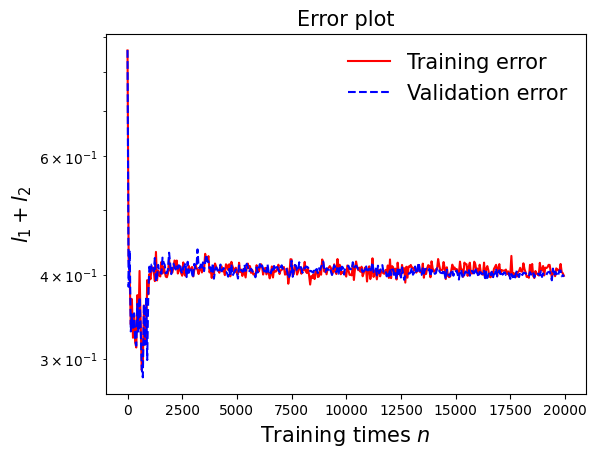

In [55]:
draw_loss(model2)

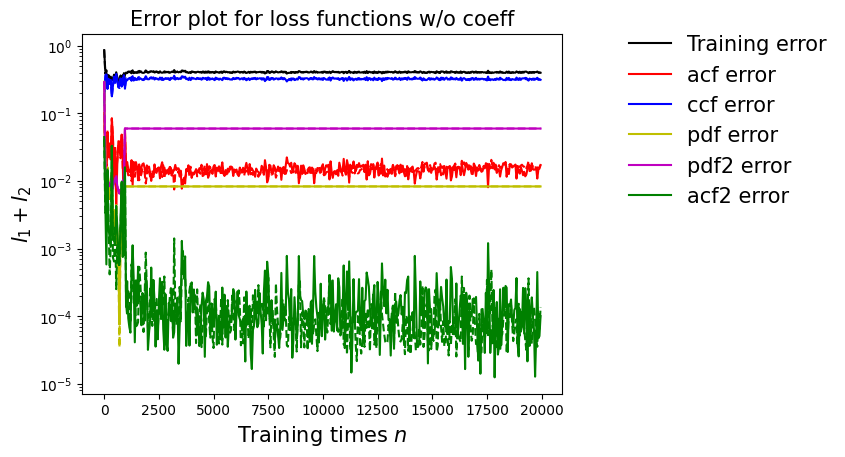

In [56]:
draw_errors(model2)

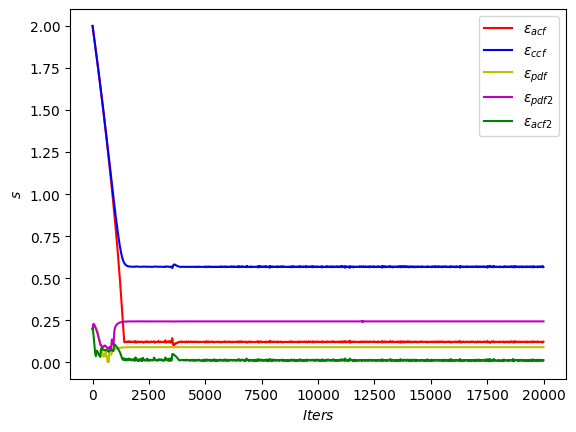

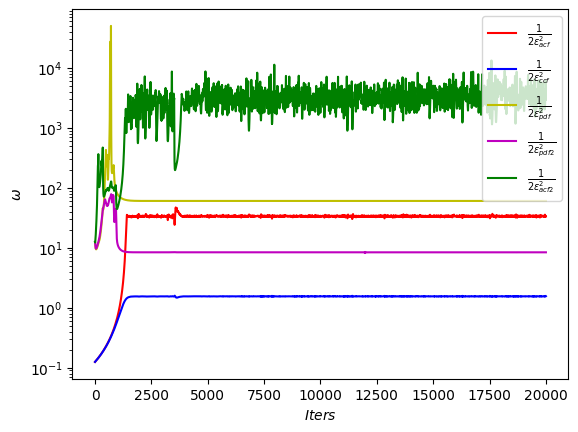

In [57]:
draw_adaptive_w(model2)
draw_epoch_w(model2)

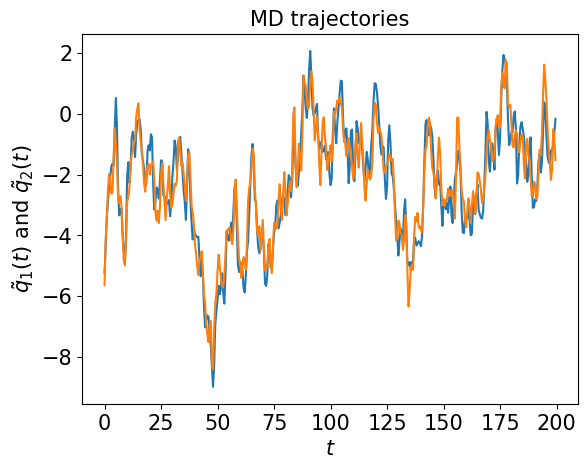

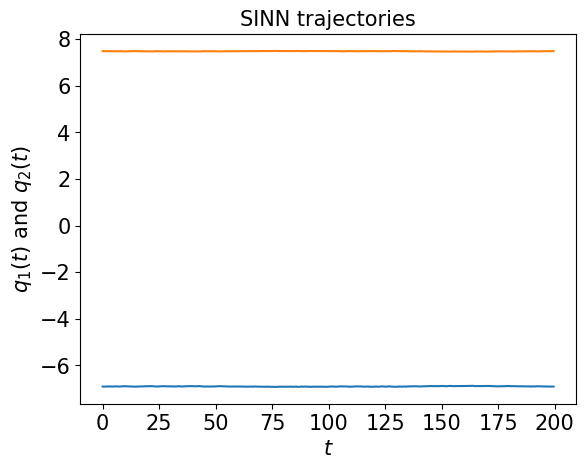

In [58]:
test1(model2)

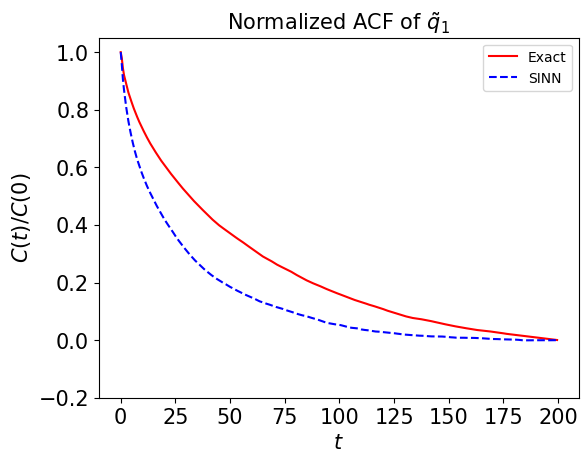

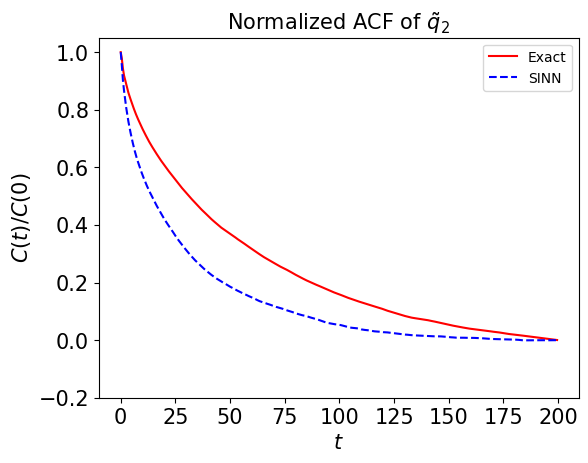

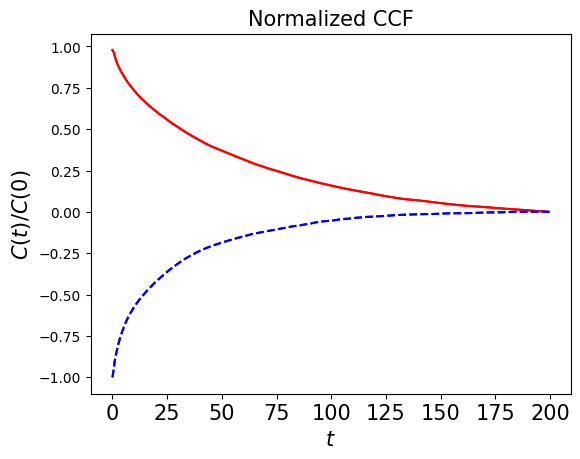

In [59]:
test2(model2)

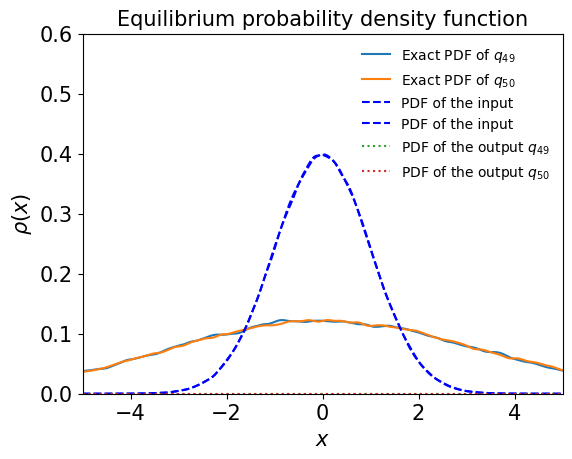

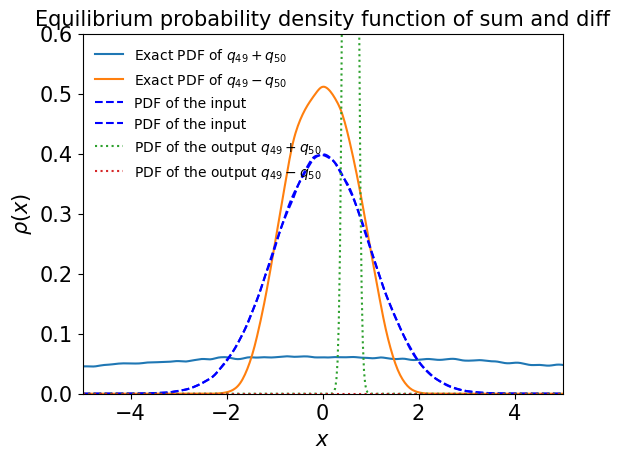

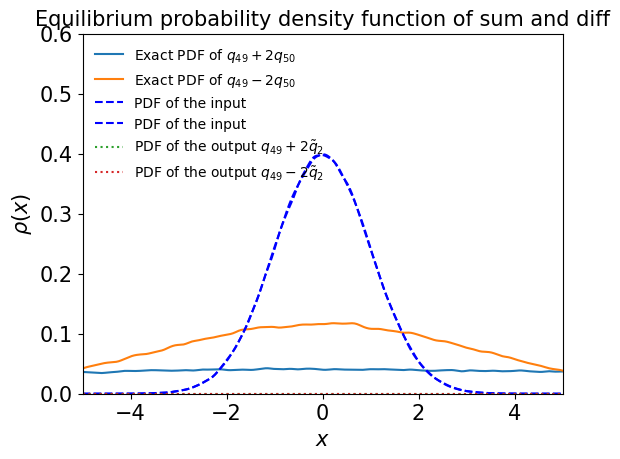

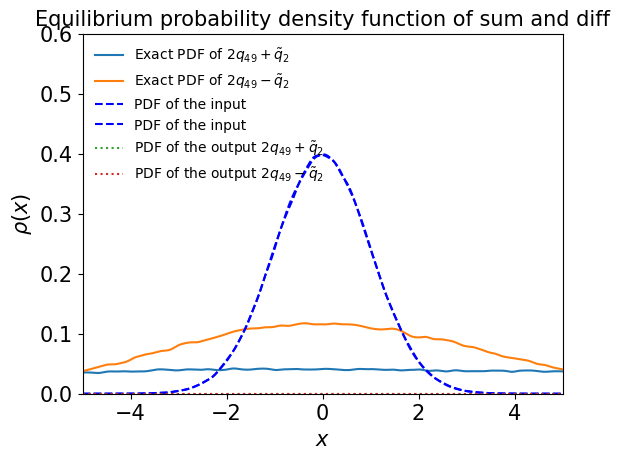

In [60]:
test3(model2)

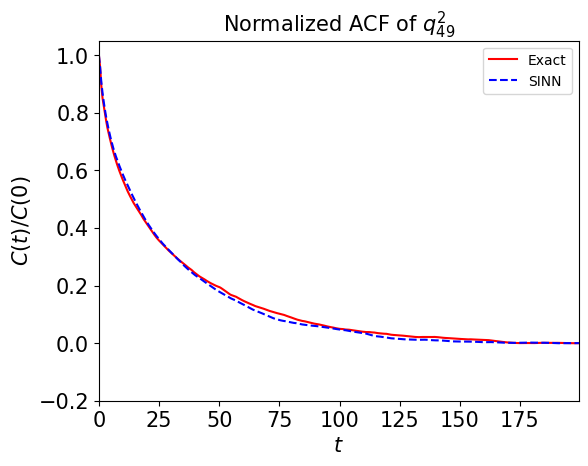

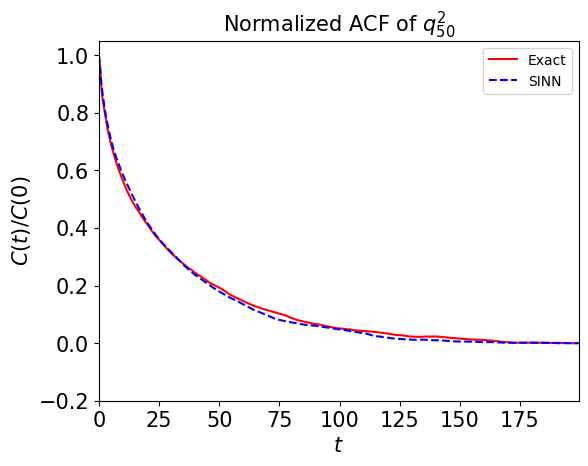

In [61]:
test4(model2)

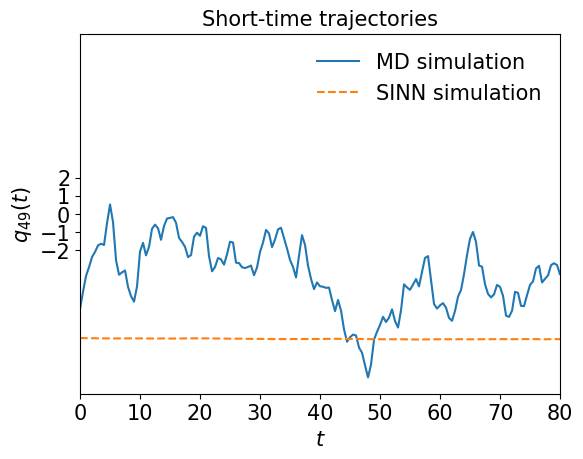

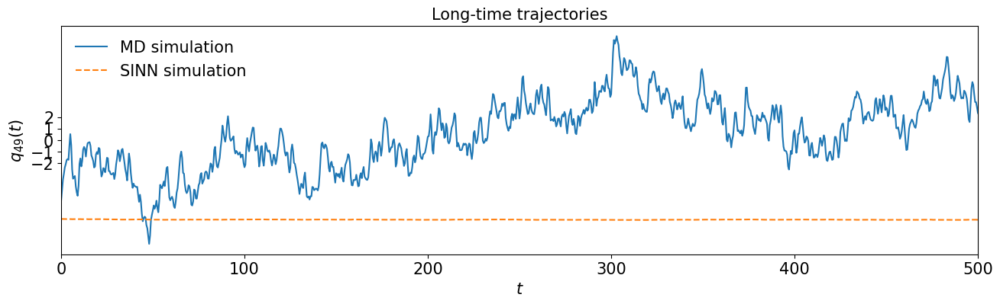

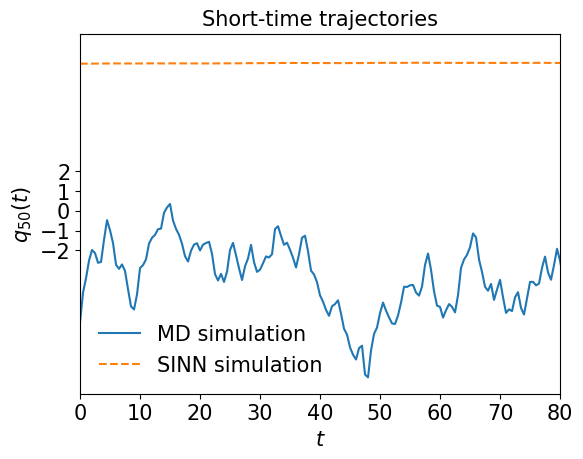

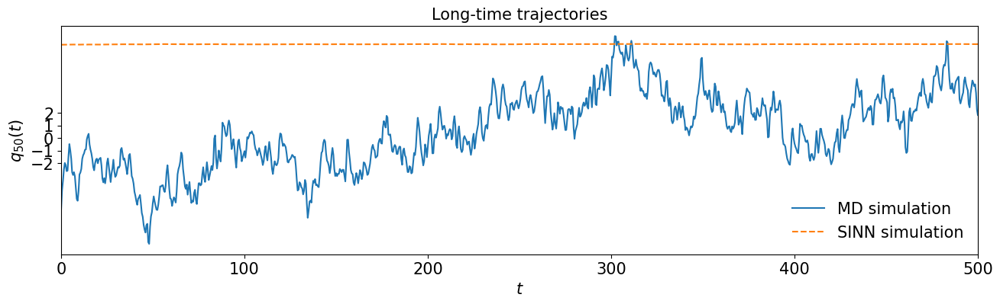

In [62]:
test5(model2)

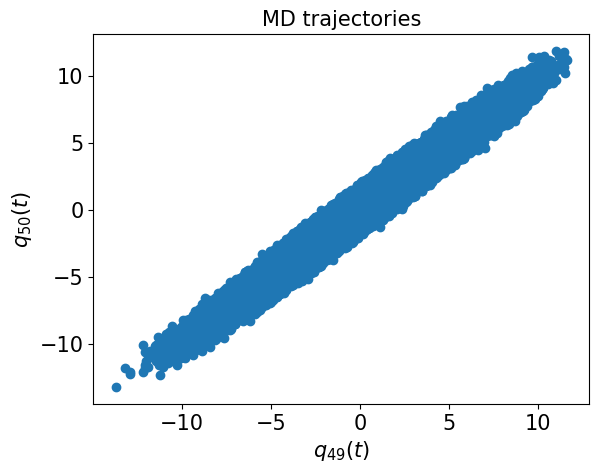

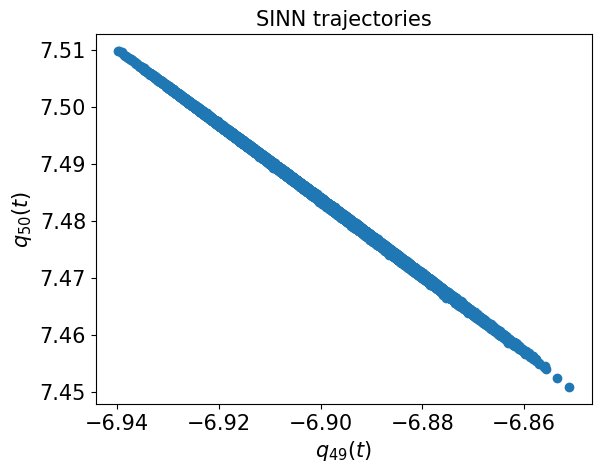

In [63]:
test6(model2)

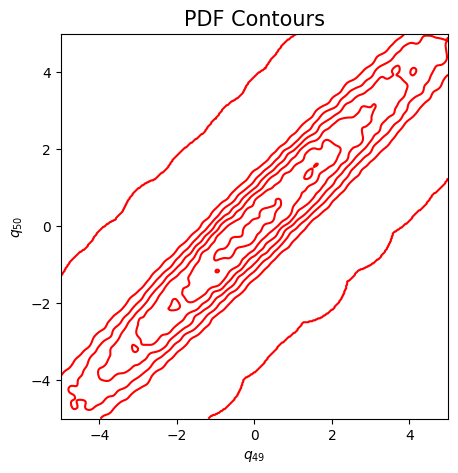

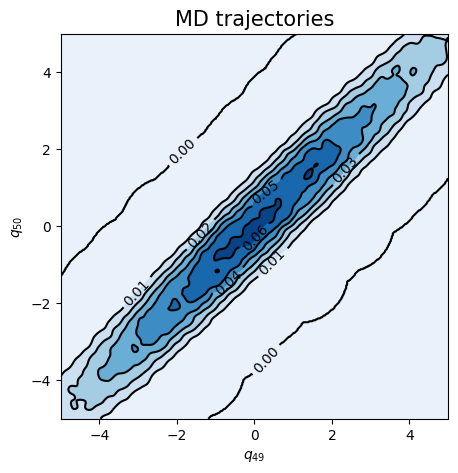

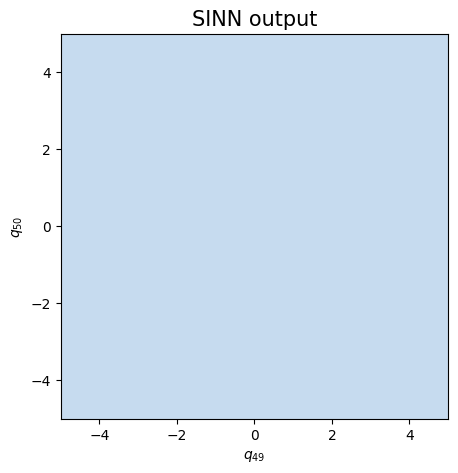

In [64]:
test7(model2)

In [65]:
### Defining SINN model
net3 = SINN(2, 75, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model3 = Model(net=net3)
model3.train()

[0]-th step loss: 0.8498, 0.8344, acf: 0.09761, ccf: 0.11244, pdf: 0.29317, pdf2: 0.28983, acf2: 0.04139
[50]-th step loss: 0.1353, 0.1313, acf: 0.04561, ccf: 0.04554, pdf: 0.01994, pdf2: 0.01120, acf2: 0.00904
[100]-th step loss: 0.0806, 0.0667, acf: 0.02861, ccf: 0.02956, pdf: 0.00511, pdf2: 0.00260, acf2: 0.00087
[150]-th step loss: 0.0792, 0.0769, acf: 0.02759, ccf: 0.02772, pdf: 0.01108, pdf2: 0.00822, acf2: 0.00234
[200]-th step loss: 0.2456, 0.2423, acf: 0.08026, ccf: 0.08010, pdf: 0.00829, pdf2: 0.04521, acf2: 0.02848
[250]-th step loss: 0.0919, 0.1114, acf: 0.02235, ccf: 0.03267, pdf: 0.00829, pdf2: 0.04535, acf2: 0.00278
[300]-th step loss: 0.1112, 0.1017, acf: 0.01708, ccf: 0.03105, pdf: 0.00829, pdf2: 0.04478, acf2: 0.00048
[350]-th step loss: 0.1032, 0.1013, acf: 0.01694, ccf: 0.03091, pdf: 0.00829, pdf2: 0.04474, acf2: 0.00037
[400]-th step loss: 0.1031, 0.1049, acf: 0.01854, ccf: 0.03302, pdf: 0.00829, pdf2: 0.04473, acf2: 0.00027
[450]-th step loss: 0.1014, 0.1018, acf:

[3850]-th step loss: 0.0882, 0.0835, acf: 0.01528, ccf: 0.01520, pdf: 0.00829, pdf2: 0.04470, acf2: 0.00003
[3900]-th step loss: 0.0927, 0.0839, acf: 0.01550, ccf: 0.01542, pdf: 0.00829, pdf2: 0.04470, acf2: 0.00003
[3950]-th step loss: 0.0915, 0.0858, acf: 0.01640, ccf: 0.01632, pdf: 0.00829, pdf2: 0.04470, acf2: 0.00006
[4000]-th step loss: 0.0725, 0.0786, acf: 0.01278, ccf: 0.01271, pdf: 0.00829, pdf2: 0.04470, acf2: 0.00011
[4050]-th step loss: 0.0802, 0.0839, acf: 0.01548, ccf: 0.01540, pdf: 0.00829, pdf2: 0.04471, acf2: 0.00005
[4100]-th step loss: 0.0817, 0.0777, acf: 0.01230, ccf: 0.01223, pdf: 0.00829, pdf2: 0.04472, acf2: 0.00015
[4150]-th step loss: 0.0872, 0.0865, acf: 0.01675, ccf: 0.01668, pdf: 0.00829, pdf2: 0.04470, acf2: 0.00007
[4200]-th step loss: 0.0851, 0.0811, acf: 0.01405, ccf: 0.01398, pdf: 0.00829, pdf2: 0.04471, acf2: 0.00003
[4250]-th step loss: 0.0802, 0.0830, acf: 0.01504, ccf: 0.01496, pdf: 0.00829, pdf2: 0.04470, acf2: 0.00002
[4300]-th step loss: 0.0842,

[7650]-th step loss: 0.0808, 0.0895, acf: 0.01821, ccf: 0.01814, pdf: 0.00829, pdf2: 0.04468, acf2: 0.00021
[7700]-th step loss: 0.0837, 0.0879, acf: 0.01742, ccf: 0.01734, pdf: 0.00829, pdf2: 0.04470, acf2: 0.00014
[7750]-th step loss: 0.0846, 0.0844, acf: 0.01571, ccf: 0.01564, pdf: 0.00829, pdf2: 0.04469, acf2: 0.00008
[7800]-th step loss: 0.0770, 0.0810, acf: 0.01403, ccf: 0.01396, pdf: 0.00829, pdf2: 0.04468, acf2: 0.00006
[7850]-th step loss: 0.0768, 0.0856, acf: 0.01627, ccf: 0.01620, pdf: 0.00829, pdf2: 0.04469, acf2: 0.00010
[7900]-th step loss: 0.0850, 0.0852, acf: 0.01609, ccf: 0.01602, pdf: 0.00829, pdf2: 0.04469, acf2: 0.00006
[7950]-th step loss: 0.0775, 0.0875, acf: 0.01726, ccf: 0.01719, pdf: 0.00829, pdf2: 0.04468, acf2: 0.00013
[8000]-th step loss: 0.0834, 0.0867, acf: 0.01682, ccf: 0.01674, pdf: 0.00829, pdf2: 0.04471, acf2: 0.00009
[8050]-th step loss: 0.0814, 0.0836, acf: 0.01533, ccf: 0.01526, pdf: 0.00828, pdf2: 0.04469, acf2: 0.00006
[8100]-th step loss: 0.0844,

[11450]-th step loss: 0.0696, 0.0664, acf: 0.00009, ccf: 0.00009, pdf: 0.00829, pdf2: 0.04462, acf2: 0.01335
[11500]-th step loss: 0.0641, 0.0655, acf: 0.00019, ccf: 0.00018, pdf: 0.00829, pdf2: 0.04464, acf2: 0.01224
[11550]-th step loss: 0.0671, 0.0665, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.04464, acf2: 0.01344
[11600]-th step loss: 0.0650, 0.0681, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.04464, acf2: 0.01513
[11650]-th step loss: 0.0701, 0.0718, acf: 0.00022, ccf: 0.00022, pdf: 0.00829, pdf2: 0.04462, acf2: 0.01842
[11700]-th step loss: 0.0682, 0.0713, acf: 0.00018, ccf: 0.00018, pdf: 0.00829, pdf2: 0.04462, acf2: 0.01803
[11750]-th step loss: 0.0683, 0.0677, acf: 0.00007, ccf: 0.00007, pdf: 0.00829, pdf2: 0.04464, acf2: 0.01462
[11800]-th step loss: 0.0633, 0.0674, acf: 0.00006, ccf: 0.00006, pdf: 0.00829, pdf2: 0.04464, acf2: 0.01436
[11850]-th step loss: 0.0687, 0.0680, acf: 0.00004, ccf: 0.00004, pdf: 0.00829, pdf2: 0.04461, acf2: 0.01506
[11900]-th step los

[15250]-th step loss: 0.0638, 0.0671, acf: 0.00013, ccf: 0.00013, pdf: 0.00829, pdf2: 0.04461, acf2: 0.01393
[15300]-th step loss: 0.0646, 0.0673, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.04458, acf2: 0.01442
[15350]-th step loss: 0.0650, 0.0677, acf: 0.00002, ccf: 0.00002, pdf: 0.00829, pdf2: 0.04457, acf2: 0.01480
[15400]-th step loss: 0.0640, 0.0665, acf: 0.00014, ccf: 0.00014, pdf: 0.00829, pdf2: 0.04461, acf2: 0.01336
[15450]-th step loss: 0.0642, 0.0676, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.04459, acf2: 0.01466
[15500]-th step loss: 0.0705, 0.0685, acf: 0.00005, ccf: 0.00005, pdf: 0.00829, pdf2: 0.04459, acf2: 0.01549
[15550]-th step loss: 0.0718, 0.0706, acf: 0.00015, ccf: 0.00016, pdf: 0.00829, pdf2: 0.04461, acf2: 0.01735
[15600]-th step loss: 0.0692, 0.0709, acf: 0.00015, ccf: 0.00015, pdf: 0.00829, pdf2: 0.04459, acf2: 0.01767
[15650]-th step loss: 0.0648, 0.0681, acf: 0.00003, ccf: 0.00003, pdf: 0.00829, pdf2: 0.04458, acf2: 0.01517
[15700]-th step los

[19050]-th step loss: 0.0689, 0.0703, acf: 0.00010, ccf: 0.00011, pdf: 0.00828, pdf2: 0.04456, acf2: 0.01720
[19100]-th step loss: 0.0715, 0.0697, acf: 0.00007, ccf: 0.00008, pdf: 0.00828, pdf2: 0.04454, acf2: 0.01677
[19150]-th step loss: 0.0666, 0.0725, acf: 0.00029, ccf: 0.00030, pdf: 0.00828, pdf2: 0.04455, acf2: 0.01911
[19200]-th step loss: 0.0640, 0.0641, acf: 0.00054, ccf: 0.00053, pdf: 0.00829, pdf2: 0.04460, acf2: 0.01013
[19250]-th step loss: 0.0655, 0.0697, acf: 0.00008, ccf: 0.00009, pdf: 0.00828, pdf2: 0.04456, acf2: 0.01674
[19300]-th step loss: 0.0679, 0.0711, acf: 0.00016, ccf: 0.00017, pdf: 0.00828, pdf2: 0.04454, acf2: 0.01796
[19350]-th step loss: 0.0669, 0.0716, acf: 0.00021, ccf: 0.00022, pdf: 0.00828, pdf2: 0.04455, acf2: 0.01833
[19400]-th step loss: 0.0699, 0.0694, acf: 0.00006, ccf: 0.00006, pdf: 0.00828, pdf2: 0.04454, acf2: 0.01646
[19450]-th step loss: 0.0704, 0.0692, acf: 0.00004, ccf: 0.00005, pdf: 0.00828, pdf2: 0.04454, acf2: 0.01626
[19500]-th step los

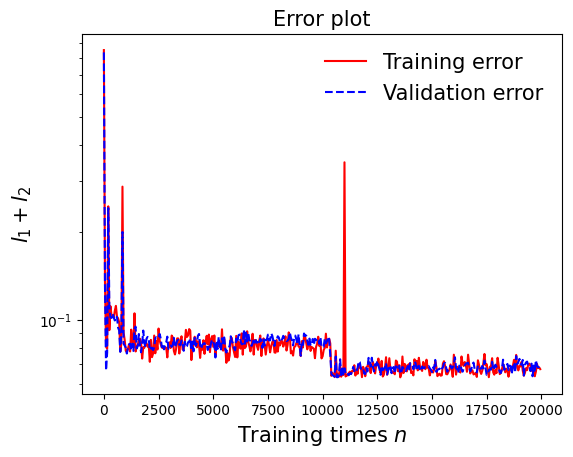

In [66]:
draw_loss(model3)

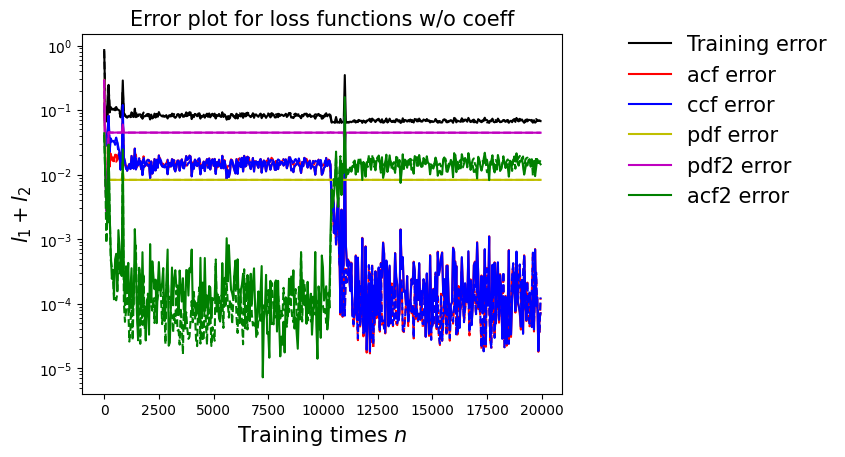

In [67]:
draw_errors(model3)

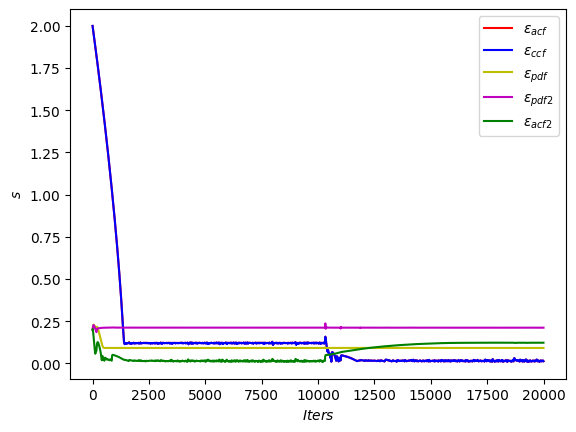

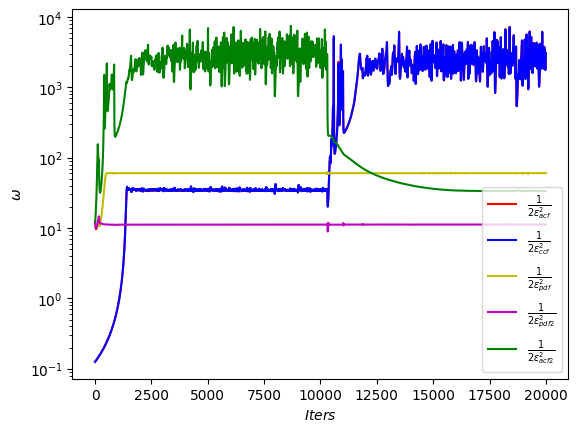

In [68]:
draw_adaptive_w(model3)
draw_epoch_w(model3)

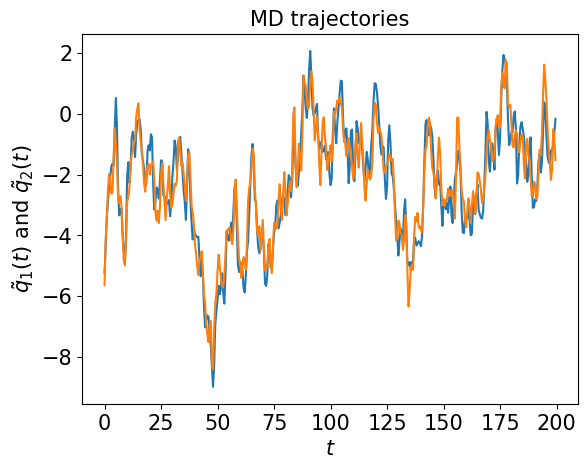

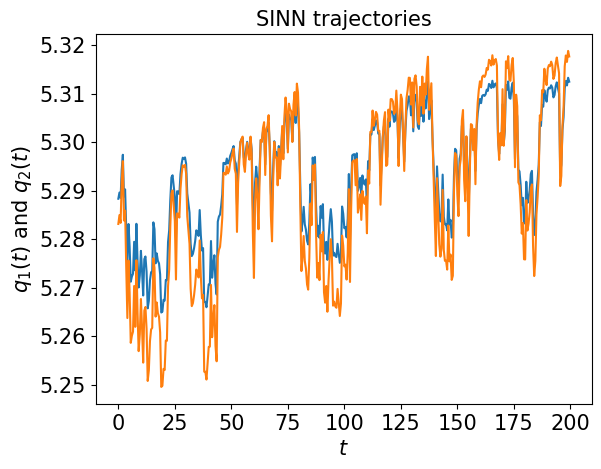

In [69]:
test1(model3)

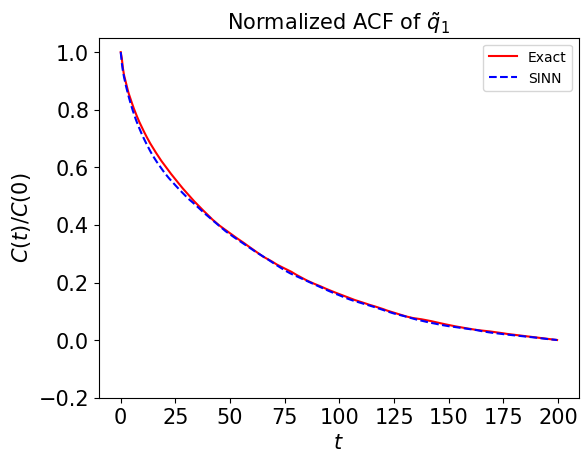

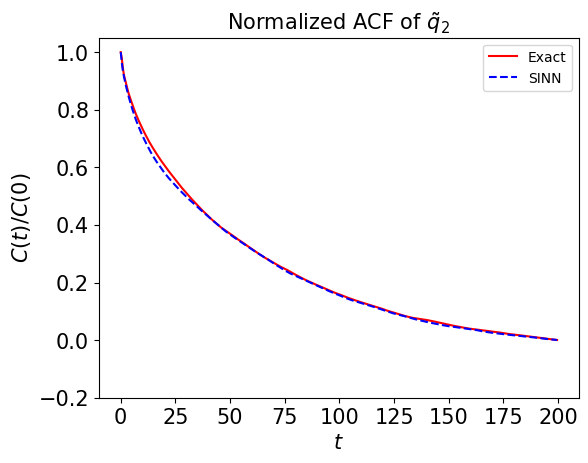

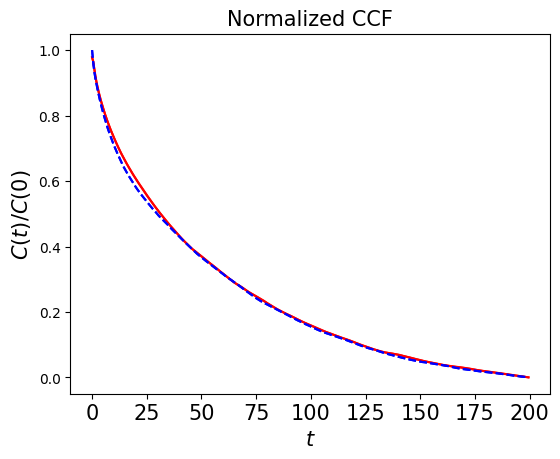

In [70]:
test2(model3)

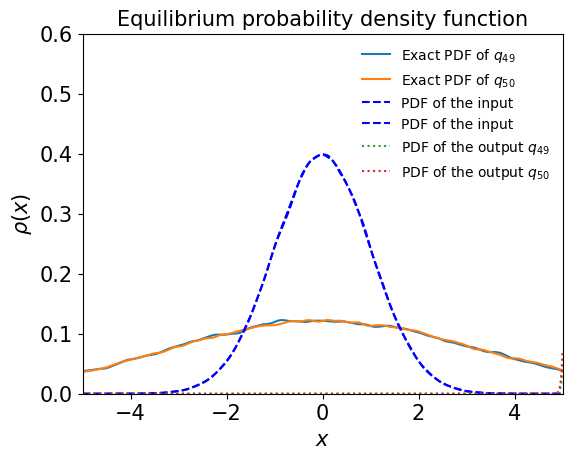

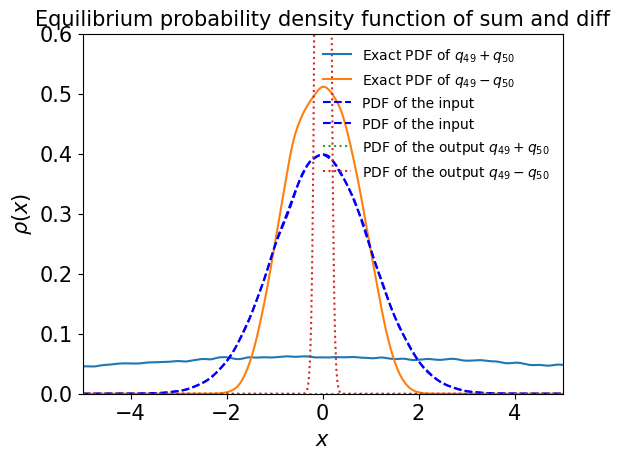

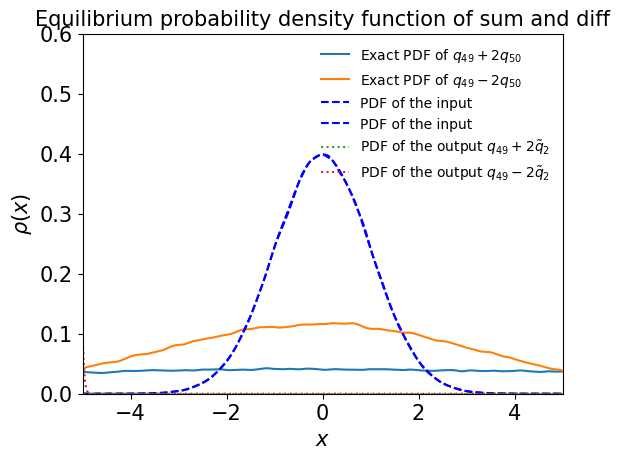

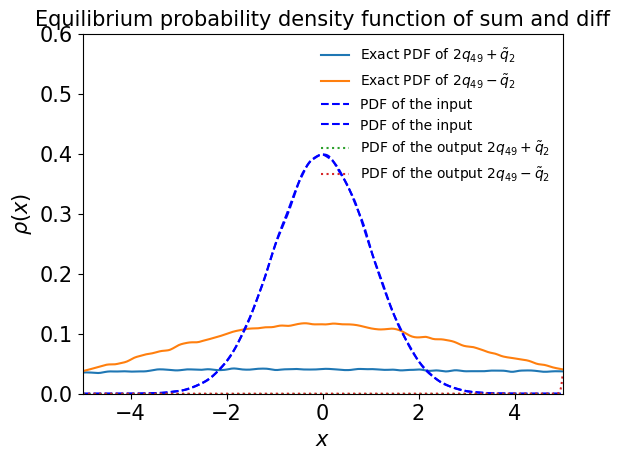

In [71]:
test3(model3)

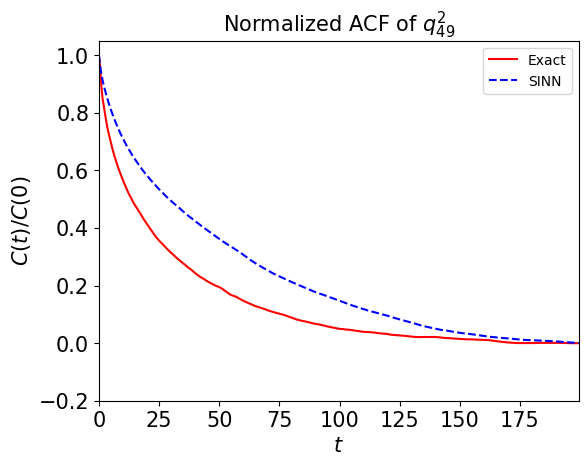

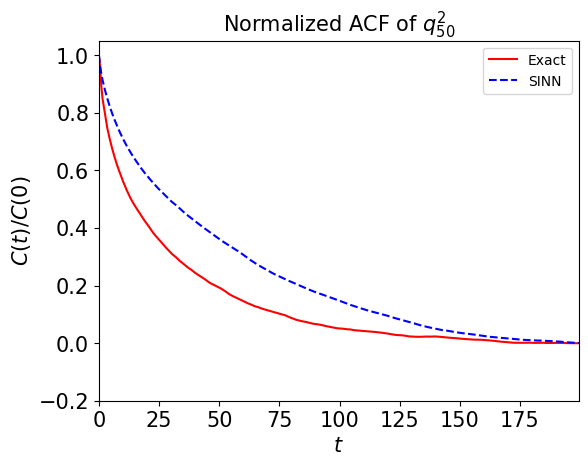

In [72]:
test4(model3)

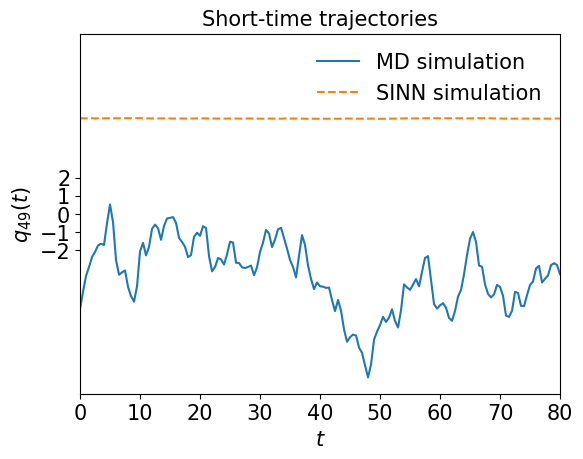

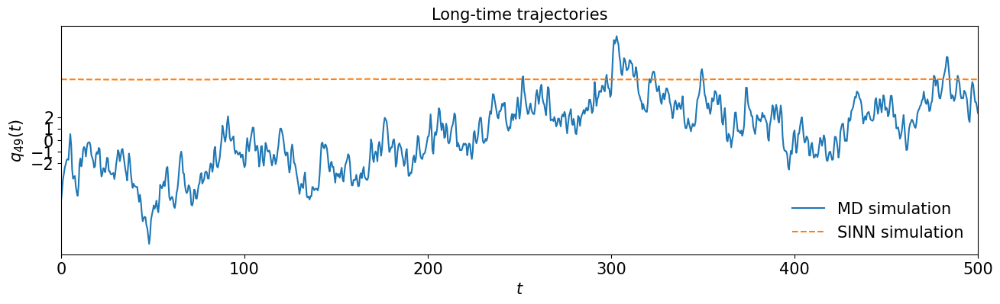

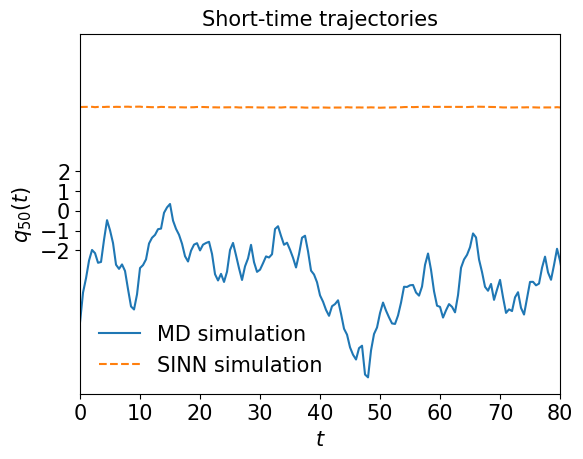

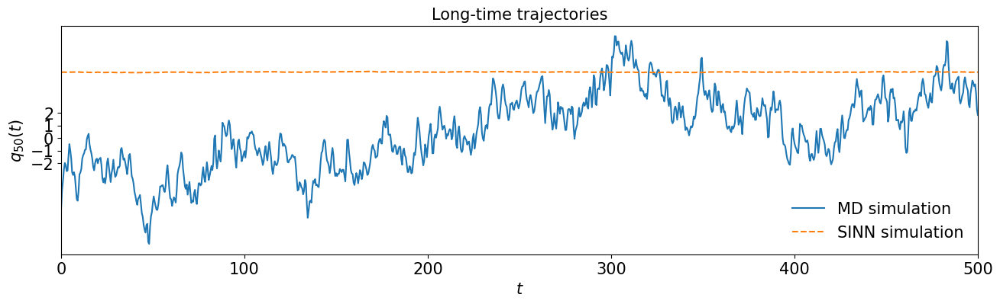

In [73]:
test5(model3)

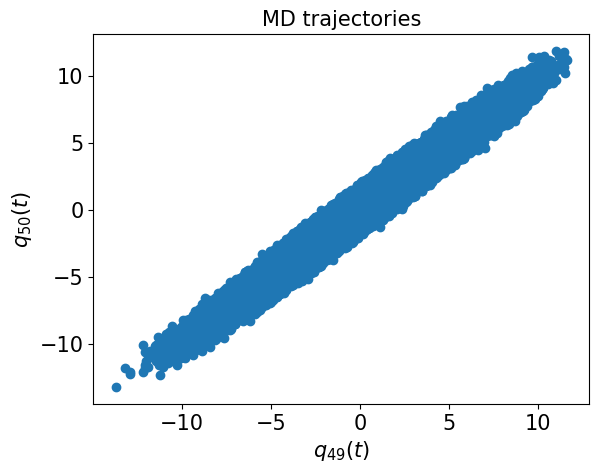

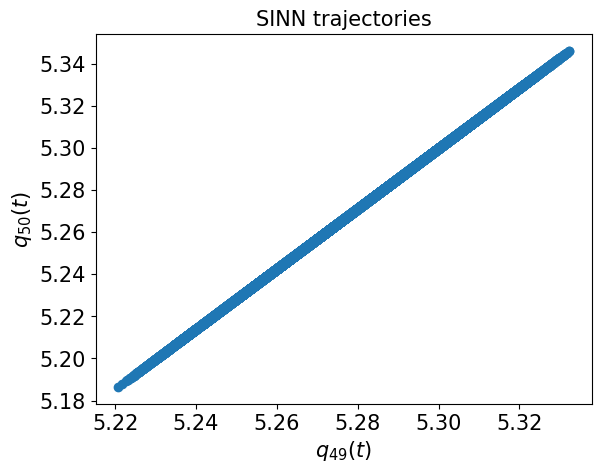

In [74]:
test6(model3)

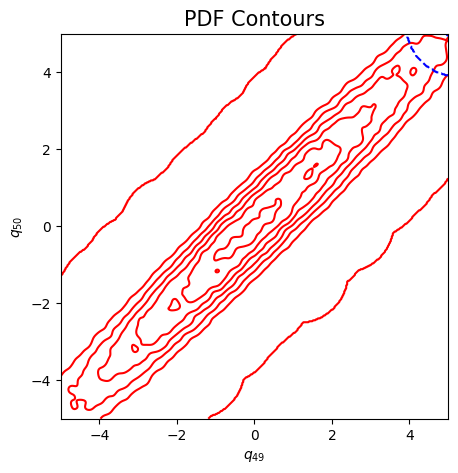

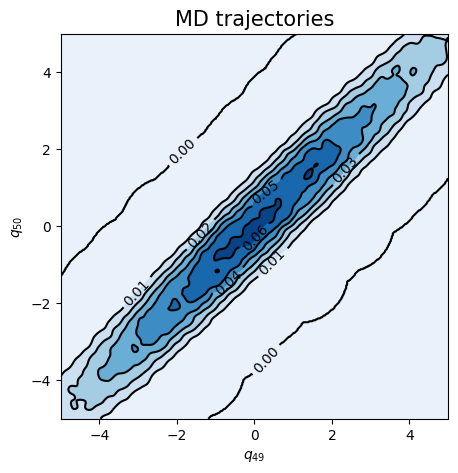

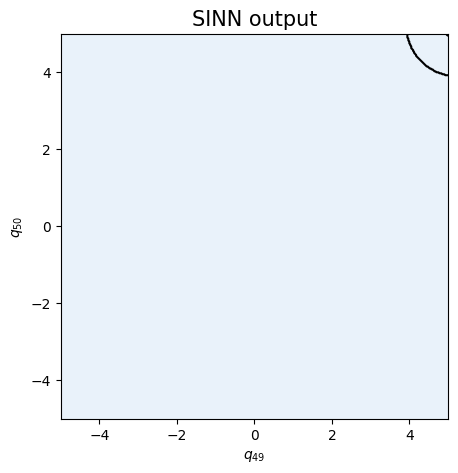

In [75]:
test7(model3)

In [76]:
### Defining SINN model
net4 = SINN(2, 75, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model4 = Model(net=net4)
model4.train()

[0]-th step loss: 0.8328, 0.8201, acf: 0.09788, ccf: 0.09771, pdf: 0.29317, pdf2: 0.28979, acf2: 0.04158
[50]-th step loss: 0.1503, 0.1431, acf: 0.04893, ccf: 0.04886, pdf: 0.01783, pdf2: 0.01258, acf2: 0.01493
[100]-th step loss: 0.1083, 0.1029, acf: 0.01804, ccf: 0.01815, pdf: 0.03952, pdf2: 0.02433, acf2: 0.00281
[150]-th step loss: 0.2896, 0.2698, acf: 0.02123, ccf: 0.02114, pdf: 0.13323, pdf2: 0.03244, acf2: 0.06177
[200]-th step loss: 0.0333, 0.0399, acf: 0.01274, ccf: 0.01272, pdf: 0.00875, pdf2: 0.00455, acf2: 0.00110
[250]-th step loss: 0.0209, 0.0170, acf: 0.00417, ccf: 0.00412, pdf: 0.00563, pdf2: 0.00287, acf2: 0.00026
[300]-th step loss: 0.2170, 0.2176, acf: 0.08210, ccf: 0.08231, pdf: 0.01667, pdf2: 0.00674, acf2: 0.02982
[350]-th step loss: 0.0667, 0.0558, acf: 0.02300, ccf: 0.02337, pdf: 0.00449, pdf2: 0.00357, acf2: 0.00140
[400]-th step loss: 0.0464, 0.0215, acf: 0.00720, ccf: 0.00731, pdf: 0.00383, pdf2: 0.00168, acf2: 0.00150
[450]-th step loss: 0.0234, 0.0336, acf:

[3850]-th step loss: 0.3456, 0.3410, acf: 0.01387, ccf: 0.31485, pdf: 0.00829, pdf2: 0.00393, acf2: 0.00006
[3900]-th step loss: 0.3372, 0.3391, acf: 0.01422, ccf: 0.31267, pdf: 0.00829, pdf2: 0.00387, acf2: 0.00006
[3950]-th step loss: 0.3260, 0.3352, acf: 0.01453, ccf: 0.30866, pdf: 0.00829, pdf2: 0.00370, acf2: 0.00005
[4000]-th step loss: 0.3453, 0.3365, acf: 0.01477, ccf: 0.30930, pdf: 0.00829, pdf2: 0.00410, acf2: 0.00008
[4050]-th step loss: 0.3492, 0.3462, acf: 0.01127, ccf: 0.32269, pdf: 0.00829, pdf2: 0.00376, acf2: 0.00023
[4100]-th step loss: 0.3372, 0.3383, acf: 0.01335, ccf: 0.31290, pdf: 0.00829, pdf2: 0.00371, acf2: 0.00008
[4150]-th step loss: 0.3390, 0.3498, acf: 0.01048, ccf: 0.32687, pdf: 0.00829, pdf2: 0.00378, acf2: 0.00033
[4200]-th step loss: 0.3438, 0.3420, acf: 0.01157, ccf: 0.31820, pdf: 0.00829, pdf2: 0.00372, acf2: 0.00017
[4250]-th step loss: 0.3417, 0.3388, acf: 0.01307, ccf: 0.31363, pdf: 0.00829, pdf2: 0.00371, acf2: 0.00009
[4300]-th step loss: 0.3355,

[7650]-th step loss: 0.0388, 0.0362, acf: 0.01185, ccf: 0.01183, pdf: 0.00823, pdf2: 0.00399, acf2: 0.00025
[7700]-th step loss: 0.0424, 0.0347, acf: 0.01138, ccf: 0.01139, pdf: 0.00819, pdf2: 0.00363, acf2: 0.00012
[7750]-th step loss: 0.0389, 0.0364, acf: 0.01221, ccf: 0.01220, pdf: 0.00822, pdf2: 0.00374, acf2: 0.00007
[7800]-th step loss: 0.0372, 0.0342, acf: 0.01097, ccf: 0.01103, pdf: 0.00818, pdf2: 0.00383, acf2: 0.00021
[7850]-th step loss: 0.0441, 0.0370, acf: 0.01250, ccf: 0.01251, pdf: 0.00823, pdf2: 0.00371, acf2: 0.00006
[7900]-th step loss: 0.0364, 0.0383, acf: 0.01311, ccf: 0.01311, pdf: 0.00821, pdf2: 0.00379, acf2: 0.00006
[7950]-th step loss: 0.0375, 0.0381, acf: 0.01295, ccf: 0.01295, pdf: 0.00821, pdf2: 0.00394, acf2: 0.00006
[8000]-th step loss: 0.0381, 0.0326, acf: 0.01024, ccf: 0.01024, pdf: 0.00823, pdf2: 0.00369, acf2: 0.00020
[8050]-th step loss: 0.0287, 0.0302, acf: 0.00895, ccf: 0.00896, pdf: 0.00819, pdf2: 0.00363, acf2: 0.00047
[8100]-th step loss: 0.0418,

[11450]-th step loss: 0.0313, 0.0372, acf: 0.00134, ccf: 0.00136, pdf: 0.00825, pdf2: 0.00445, acf2: 0.02181
[11500]-th step loss: 0.0251, 0.0293, acf: 0.00024, ccf: 0.00025, pdf: 0.00822, pdf2: 0.00371, acf2: 0.01691
[11550]-th step loss: 0.0236, 0.0272, acf: 0.00012, ccf: 0.00012, pdf: 0.00821, pdf2: 0.00360, acf2: 0.01512
[11600]-th step loss: 0.0265, 0.0271, acf: 0.00002, ccf: 0.00002, pdf: 0.00821, pdf2: 0.00366, acf2: 0.01523
[11650]-th step loss: 0.0235, 0.0250, acf: 0.00004, ccf: 0.00004, pdf: 0.00819, pdf2: 0.00359, acf2: 0.01317
[11700]-th step loss: 0.0252, 0.0273, acf: 0.00024, ccf: 0.00024, pdf: 0.00822, pdf2: 0.00396, acf2: 0.01467
[11750]-th step loss: 0.0309, 0.0299, acf: 0.00019, ccf: 0.00020, pdf: 0.00821, pdf2: 0.00365, acf2: 0.01763
[11800]-th step loss: 0.0226, 0.0273, acf: 0.00002, ccf: 0.00003, pdf: 0.00822, pdf2: 0.00362, acf2: 0.01544
[11850]-th step loss: 0.0251, 0.0284, acf: 0.00008, ccf: 0.00009, pdf: 0.00821, pdf2: 0.00364, acf2: 0.01635
[11900]-th step los

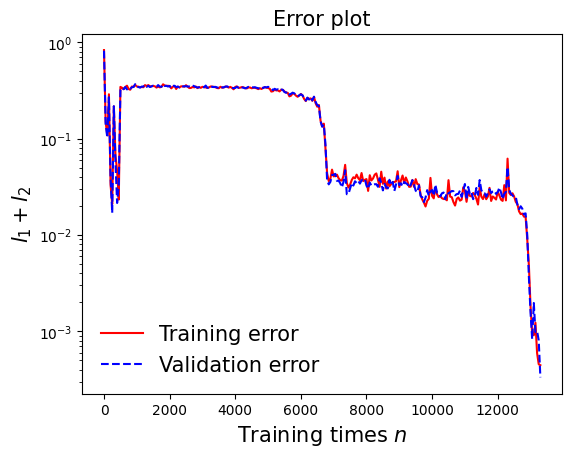

In [77]:
draw_loss(model4)

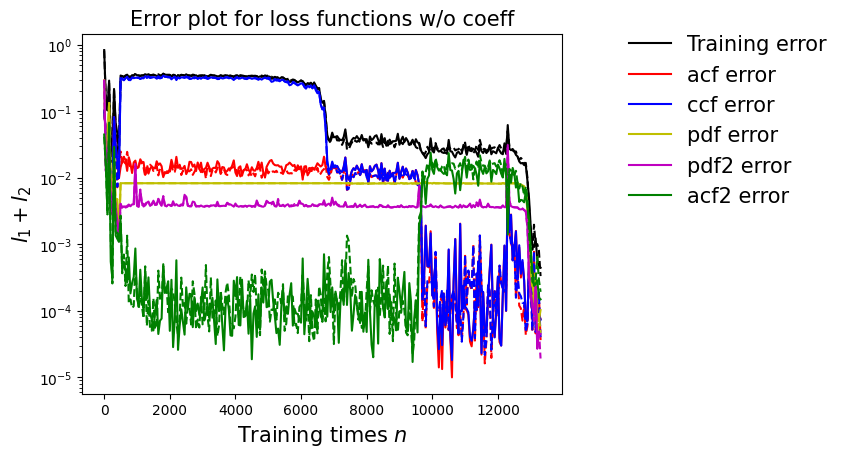

In [78]:
draw_errors(model4)

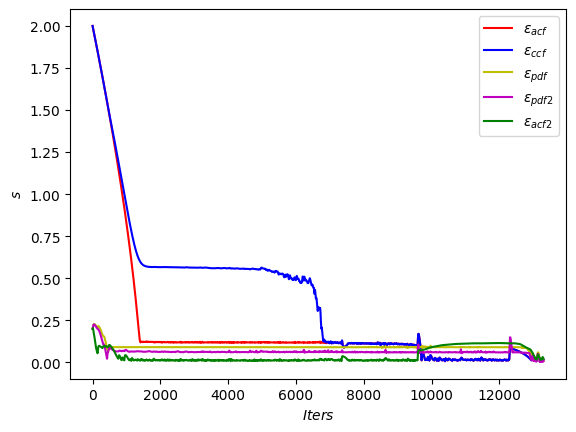

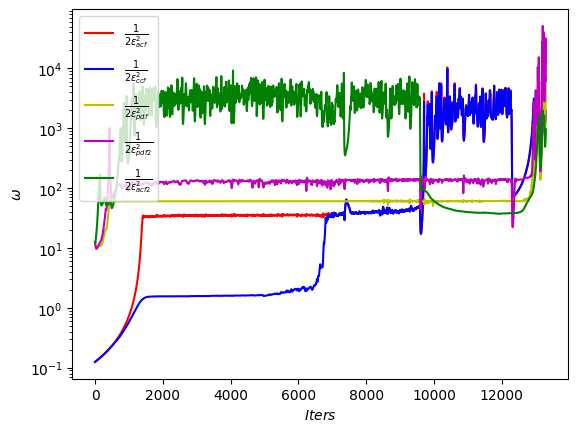

In [79]:
draw_adaptive_w(model4)
draw_epoch_w(model4)

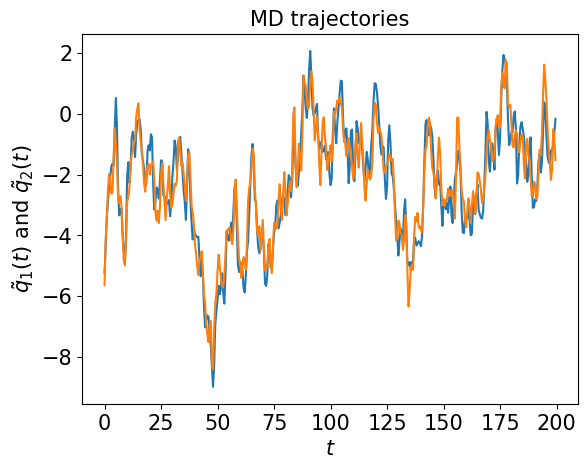

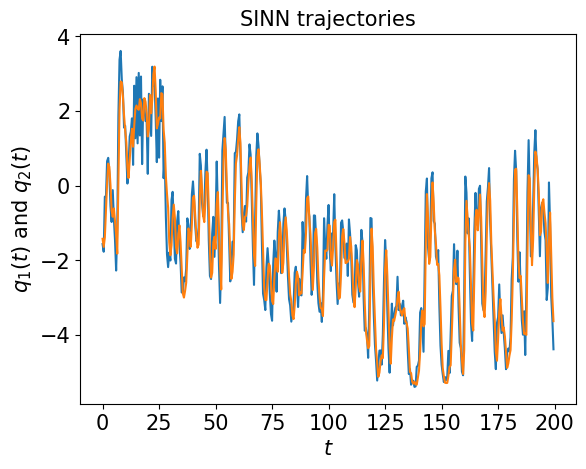

In [80]:
test1(model4)

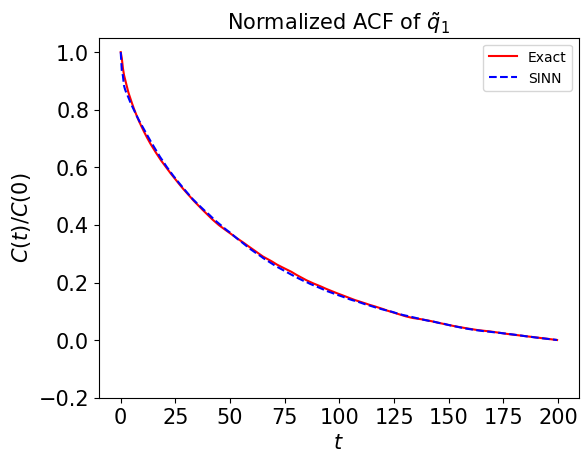

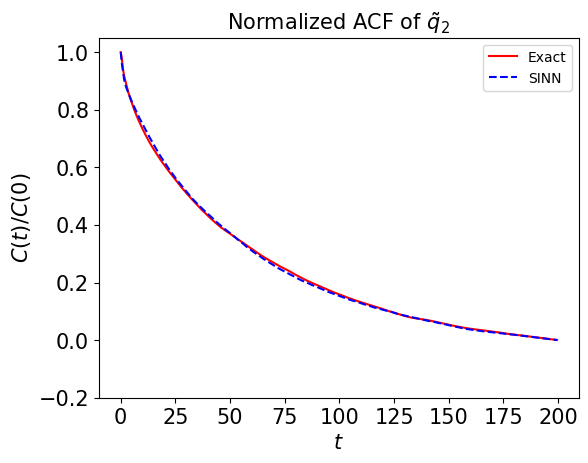

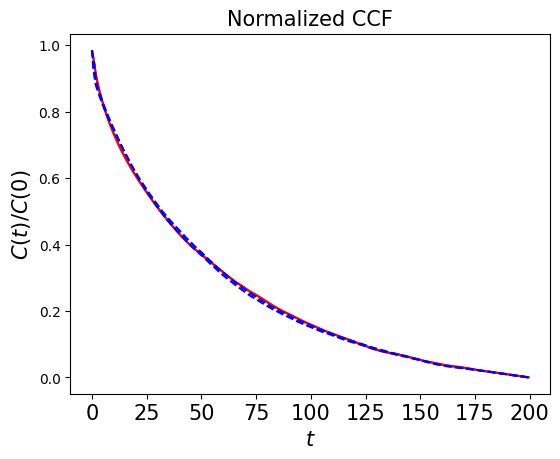

In [81]:
test2(model4)

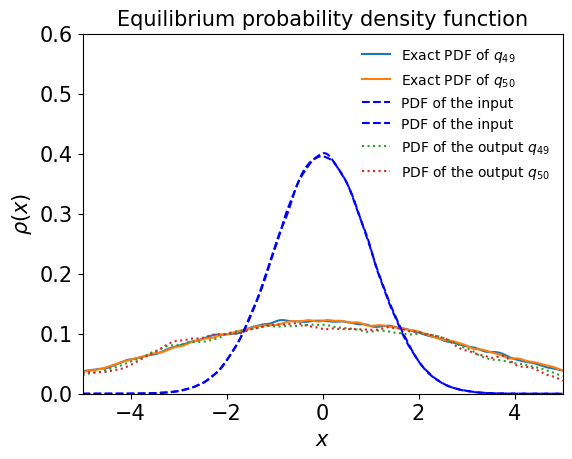

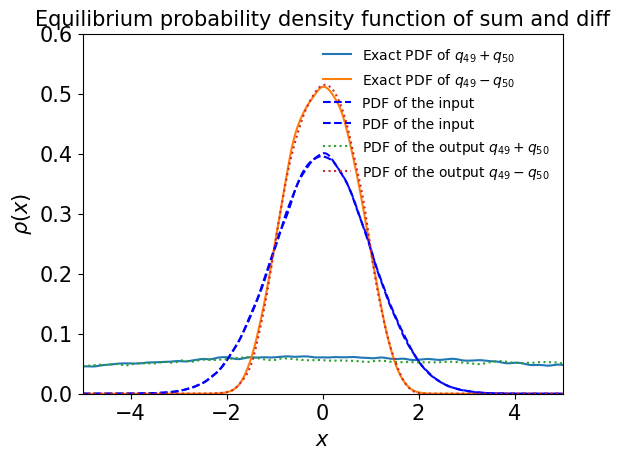

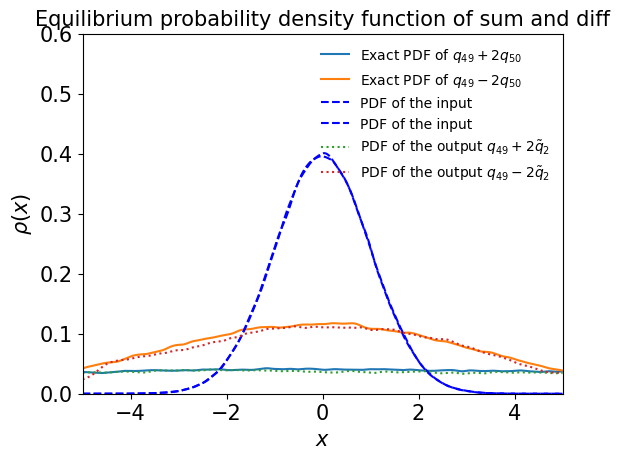

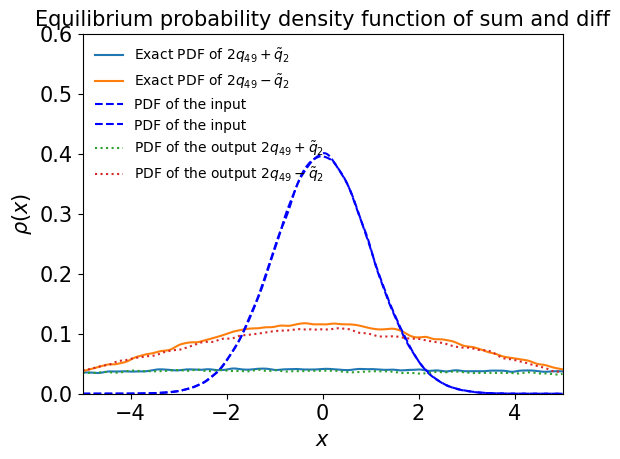

In [82]:
test3(model4)

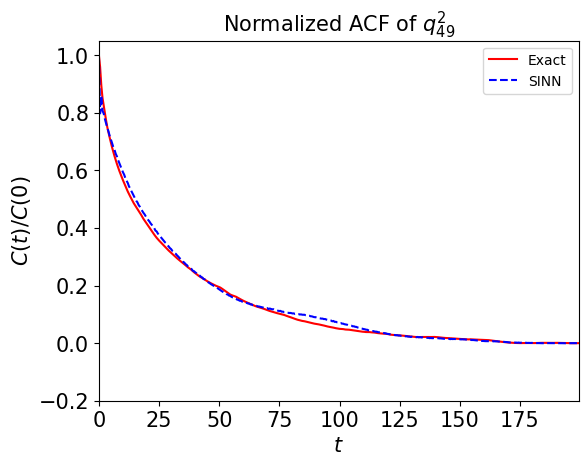

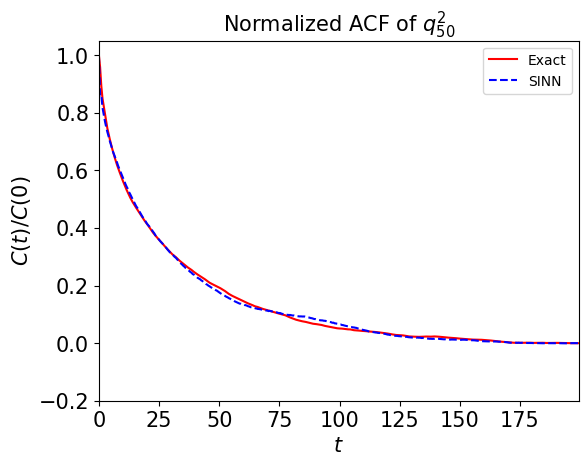

In [83]:
test4(model4)

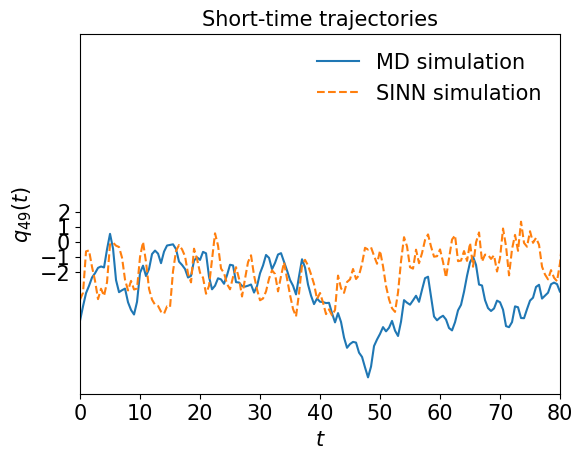

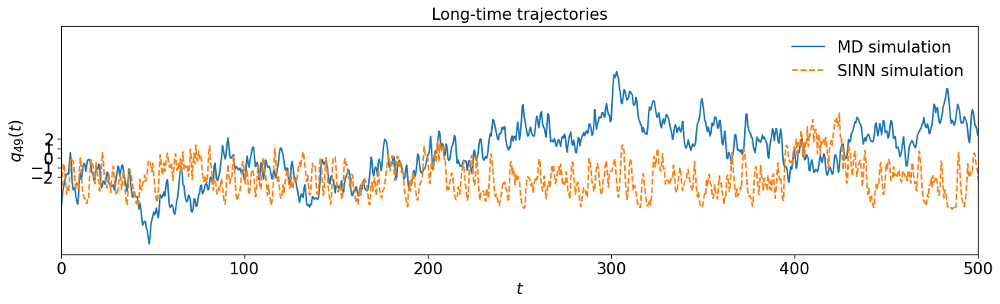

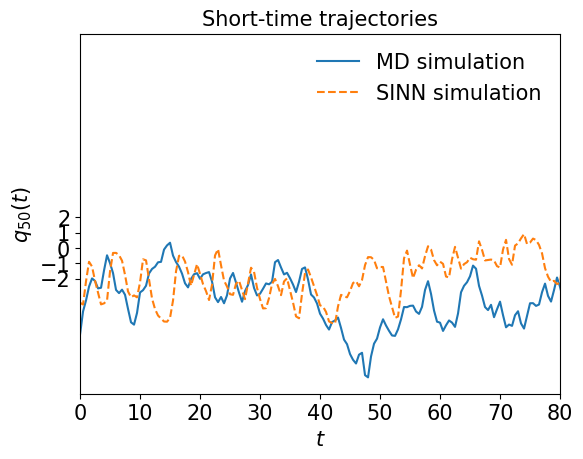

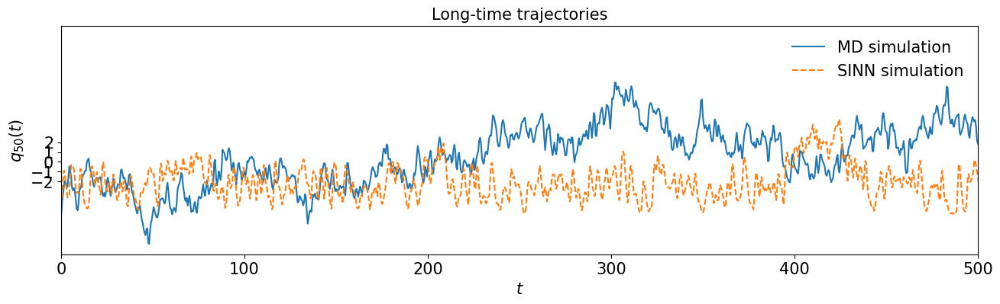

In [84]:
test5(model4)

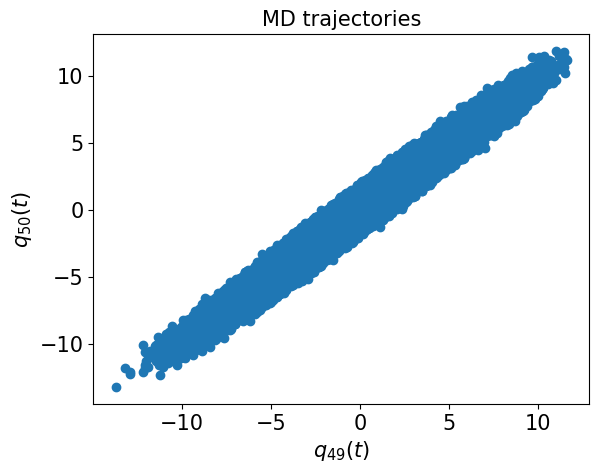

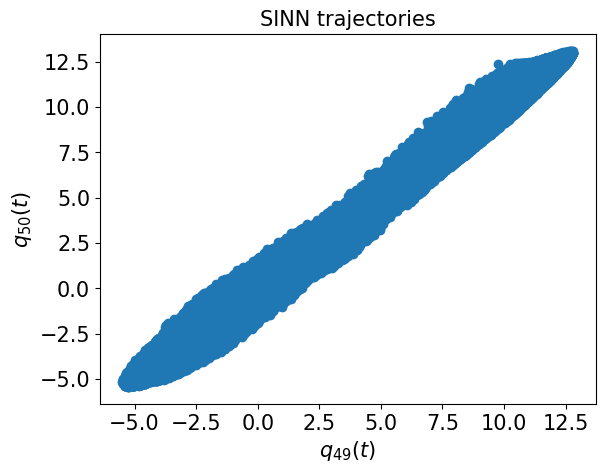

In [85]:
test6(model4)

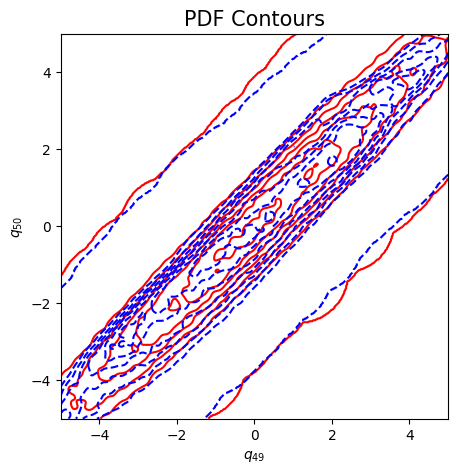

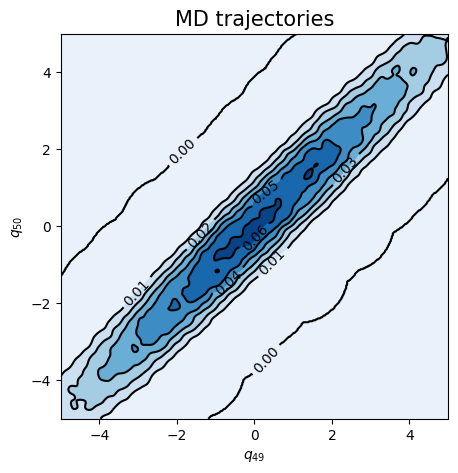

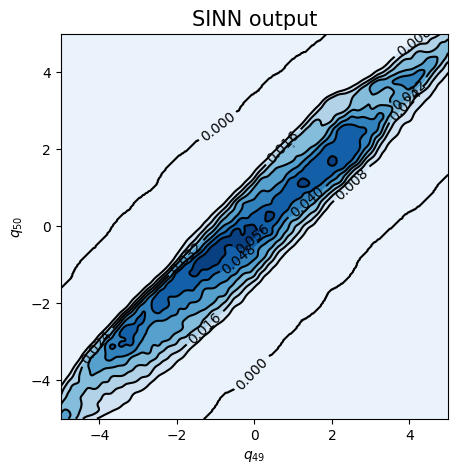

In [86]:
test7(model4)

In [87]:
### Defining SINN model
net5 = SINN(2, 75, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model5 = Model(net=net5)
model5.train()

[0]-th step loss: 0.8218, 0.8250, acf: 0.09648, ccf: 0.10515, pdf: 0.29312, pdf2: 0.28978, acf2: 0.04045
[50]-th step loss: 0.0977, 0.1280, acf: 0.04053, ccf: 0.04047, pdf: 0.02397, pdf2: 0.01565, acf2: 0.00739
[100]-th step loss: 0.0785, 0.1071, acf: 0.04076, ccf: 0.04067, pdf: 0.01266, pdf2: 0.00848, acf2: 0.00451
[150]-th step loss: 0.0870, 0.1172, acf: 0.04062, ccf: 0.04055, pdf: 0.01494, pdf2: 0.01010, acf2: 0.01094
[200]-th step loss: 0.1109, 0.1014, acf: 0.04155, ccf: 0.04146, pdf: 0.00863, pdf2: 0.00680, acf2: 0.00294
[250]-th step loss: 0.1216, 0.1351, acf: 0.04919, ccf: 0.04909, pdf: 0.01150, pdf2: 0.01098, acf2: 0.01439
[300]-th step loss: 0.0230, 0.0162, acf: 0.00252, ccf: 0.00251, pdf: 0.00424, pdf2: 0.00503, acf2: 0.00192
[350]-th step loss: 0.0807, 0.0174, acf: 0.00325, ccf: 0.00322, pdf: 0.00441, pdf2: 0.00500, acf2: 0.00156
[400]-th step loss: 0.0097, 0.0107, acf: 0.00069, ccf: 0.00066, pdf: 0.00300, pdf2: 0.00524, acf2: 0.00111
[450]-th step loss: 0.0187, 0.0197, acf:

[3850]-th step loss: 0.1536, 0.1579, acf: 0.01663, ccf: 0.01660, pdf: 0.00829, pdf2: 0.10968, acf2: 0.00671
[3900]-th step loss: 0.1190, 0.1981, acf: 0.03639, ccf: 0.03629, pdf: 0.00828, pdf2: 0.10509, acf2: 0.01207
[3950]-th step loss: 0.1007, 0.1059, acf: 0.00547, ccf: 0.00457, pdf: 0.01121, pdf2: 0.07460, acf2: 0.01000
[4000]-th step loss: 0.2537, 0.2640, acf: 0.00268, ccf: 0.00237, pdf: 0.14689, pdf2: 0.10282, acf2: 0.00920
[4050]-th step loss: 0.3270, 0.4280, acf: 0.06735, ccf: 0.06721, pdf: 0.15628, pdf2: 0.10953, acf2: 0.02767
[4100]-th step loss: 0.4231, 0.4087, acf: 0.06144, ccf: 0.06138, pdf: 0.15086, pdf2: 0.10800, acf2: 0.02697
[4150]-th step loss: 0.1970, 0.2178, acf: 0.00936, ccf: 0.00765, pdf: 0.09873, pdf2: 0.08955, acf2: 0.01256
[4200]-th step loss: 0.1615, 0.1626, acf: 0.00219, ccf: 0.00165, pdf: 0.08076, pdf2: 0.07128, acf2: 0.00668
[4250]-th step loss: 0.1055, 0.1217, acf: 0.01114, ccf: 0.00530, pdf: 0.04970, pdf2: 0.04296, acf2: 0.01255
[4300]-th step loss: 0.0814,

[7650]-th step loss: 0.0203, 0.0184, acf: 0.00018, ccf: 0.00014, pdf: 0.00772, pdf2: 0.00989, acf2: 0.00045
[7700]-th step loss: 0.0184, 0.0186, acf: 0.00019, ccf: 0.00016, pdf: 0.00782, pdf2: 0.00993, acf2: 0.00048
[7750]-th step loss: 0.0202, 0.0199, acf: 0.00046, ccf: 0.00044, pdf: 0.00861, pdf2: 0.01001, acf2: 0.00041
[7800]-th step loss: 0.0175, 0.0176, acf: 0.00051, ccf: 0.00036, pdf: 0.00615, pdf2: 0.00949, acf2: 0.00106
[7850]-th step loss: 0.0174, 0.0171, acf: 0.00041, ccf: 0.00028, pdf: 0.00614, pdf2: 0.00974, acf2: 0.00056
[7900]-th step loss: 0.0188, 0.0193, acf: 0.00073, ccf: 0.00070, pdf: 0.00752, pdf2: 0.00981, acf2: 0.00050
[7950]-th step loss: 0.0171, 0.0175, acf: 0.00024, ccf: 0.00021, pdf: 0.00692, pdf2: 0.00973, acf2: 0.00035
[8000]-th step loss: 0.0177, 0.0170, acf: 0.00047, ccf: 0.00030, pdf: 0.00620, pdf2: 0.00958, acf2: 0.00042
[8050]-th step loss: 0.0179, 0.0180, acf: 0.00047, ccf: 0.00043, pdf: 0.00688, pdf2: 0.00972, acf2: 0.00048
[8100]-th step loss: 0.0180,

[11450]-th step loss: 0.0152, 0.0154, acf: 0.00035, ccf: 0.00033, pdf: 0.00491, pdf2: 0.00955, acf2: 0.00026
[11500]-th step loss: 0.0156, 0.0154, acf: 0.00054, ccf: 0.00041, pdf: 0.00501, pdf2: 0.00926, acf2: 0.00017
[11550]-th step loss: 0.0164, 0.0174, acf: 0.00092, ccf: 0.00093, pdf: 0.00588, pdf2: 0.00923, acf2: 0.00049
[11600]-th step loss: 0.0172, 0.0155, acf: 0.00061, ccf: 0.00006, pdf: 0.00553, pdf2: 0.00919, acf2: 0.00011
[11650]-th step loss: 0.0175, 0.0180, acf: 0.00181, ccf: 0.00167, pdf: 0.00482, pdf2: 0.00892, acf2: 0.00078
[11700]-th step loss: 0.0151, 0.0144, acf: 0.00026, ccf: 0.00020, pdf: 0.00458, pdf2: 0.00898, acf2: 0.00042
[11750]-th step loss: 0.0143, 0.0147, acf: 0.00026, ccf: 0.00025, pdf: 0.00482, pdf2: 0.00901, acf2: 0.00032
[11800]-th step loss: 0.0149, 0.0146, acf: 0.00026, ccf: 0.00013, pdf: 0.00512, pdf2: 0.00894, acf2: 0.00015
[11850]-th step loss: 0.0146, 0.0142, acf: 0.00017, ccf: 0.00011, pdf: 0.00481, pdf2: 0.00881, acf2: 0.00031
[11900]-th step los

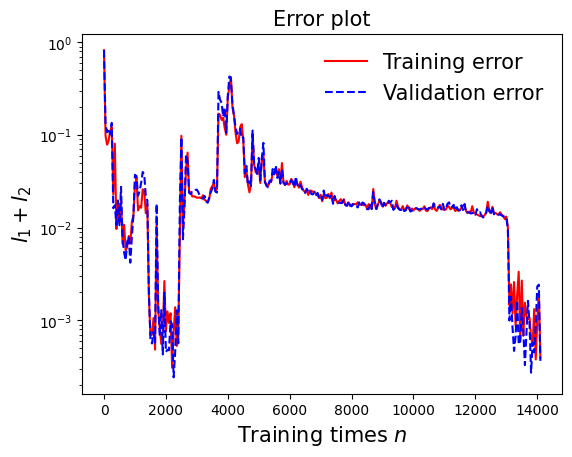

In [88]:
draw_loss(model5)

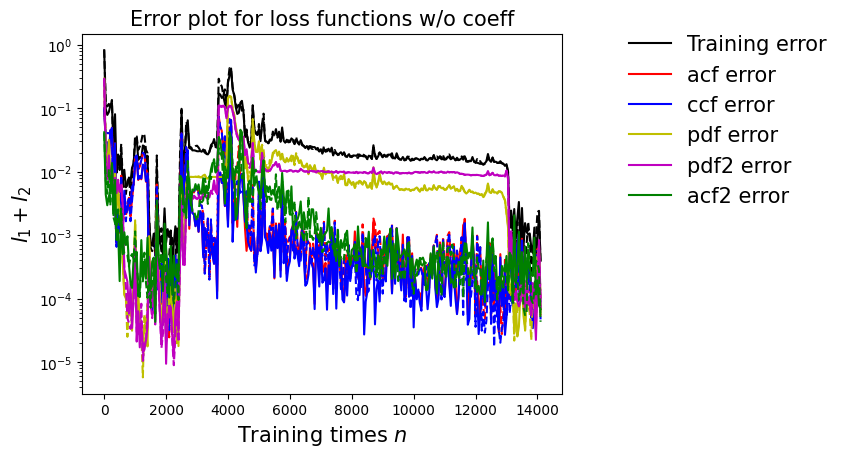

In [89]:
draw_errors(model5)

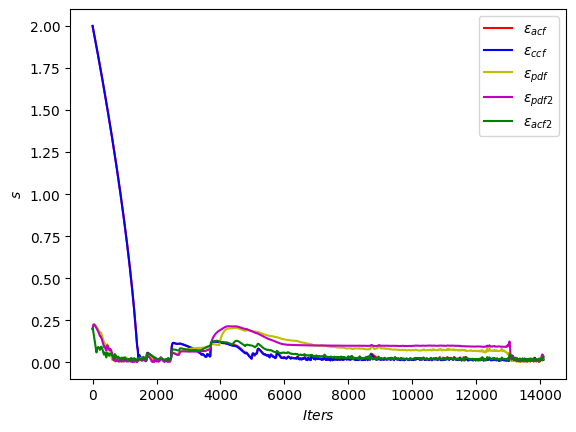

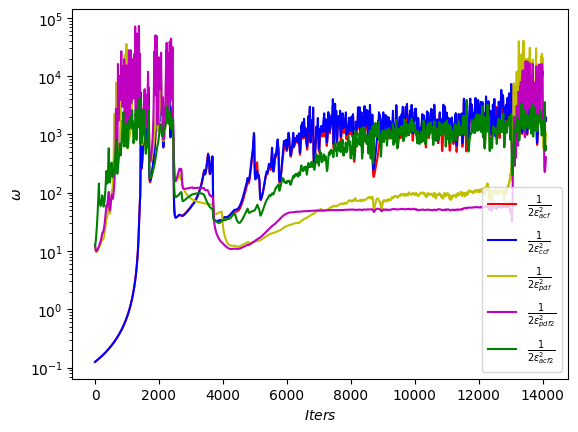

In [90]:
draw_adaptive_w(model5)
draw_epoch_w(model5)

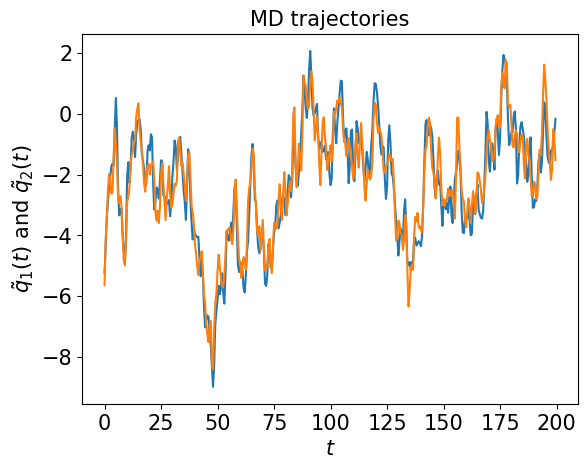

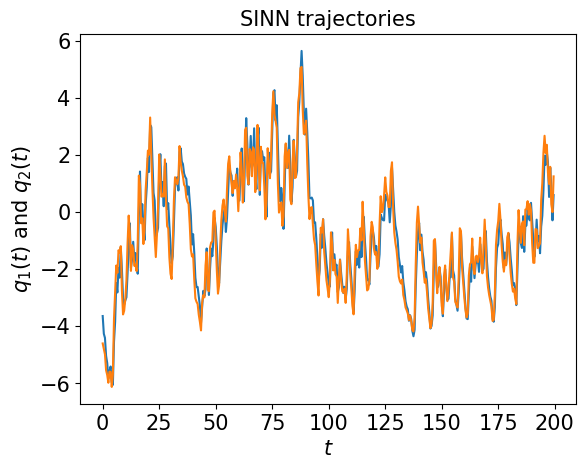

In [91]:
test1(model5)

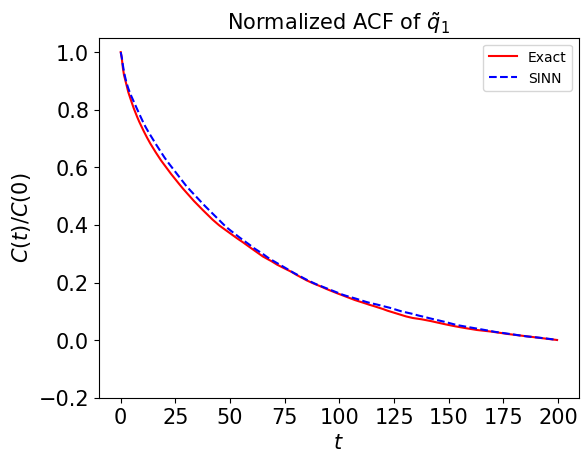

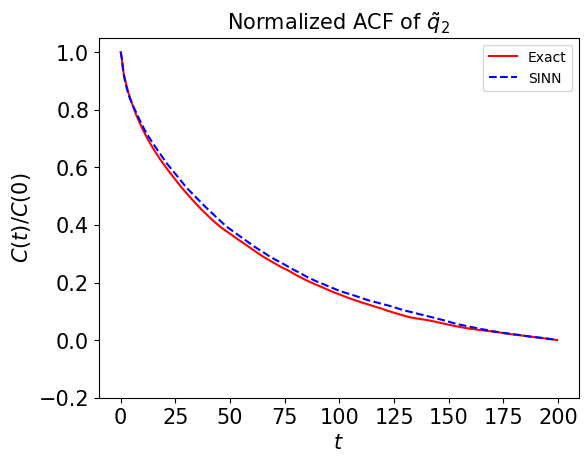

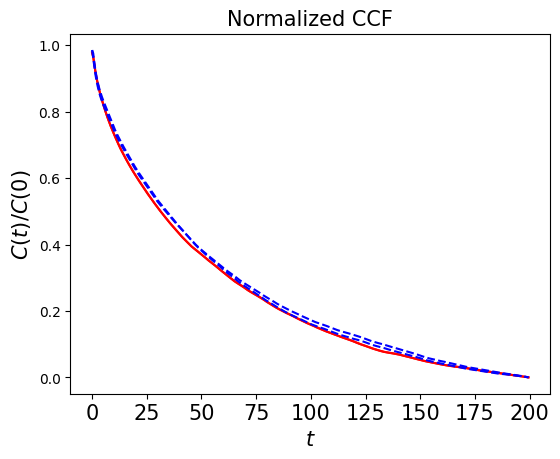

In [92]:
test2(model5)

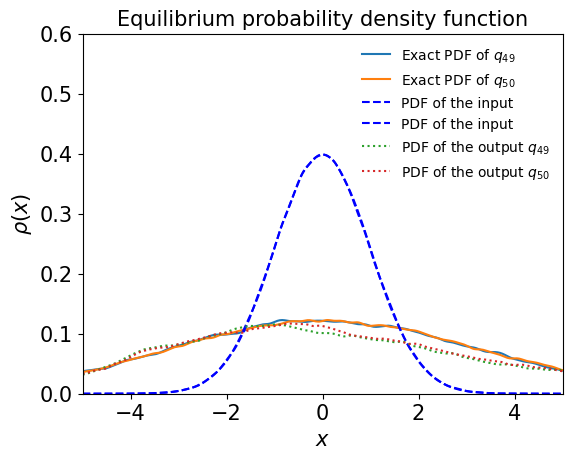

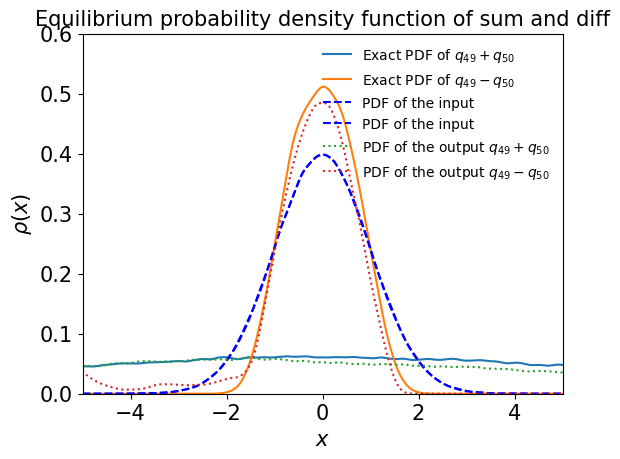

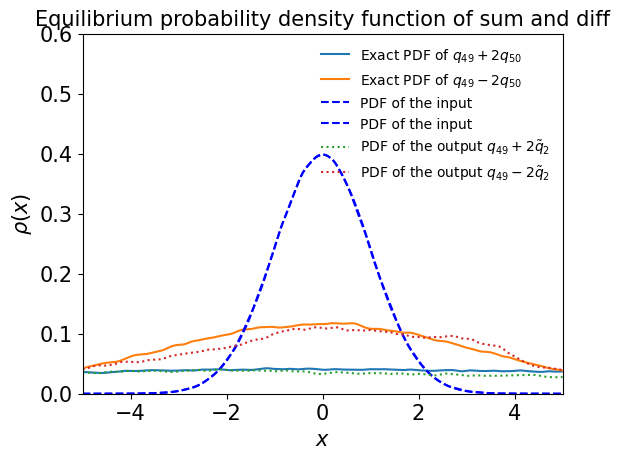

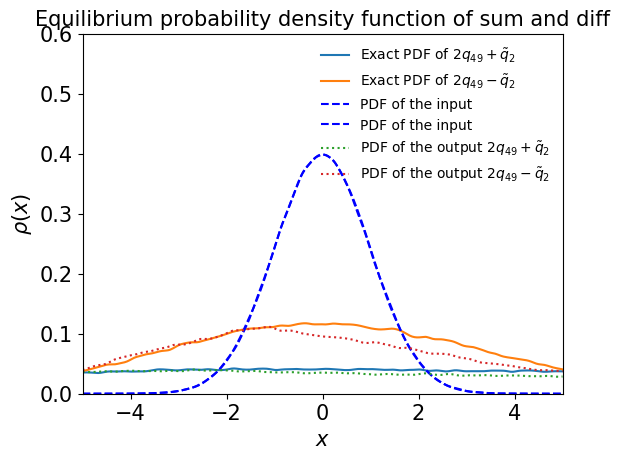

In [93]:
test3(model5)

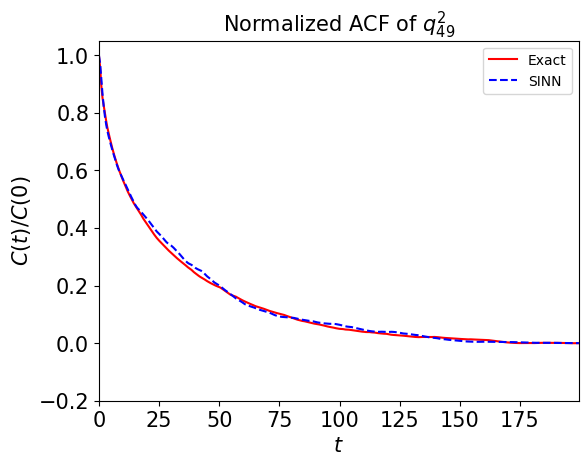

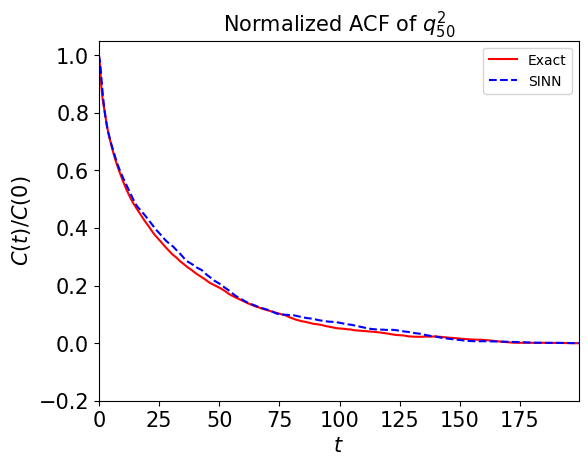

In [94]:
test4(model5)

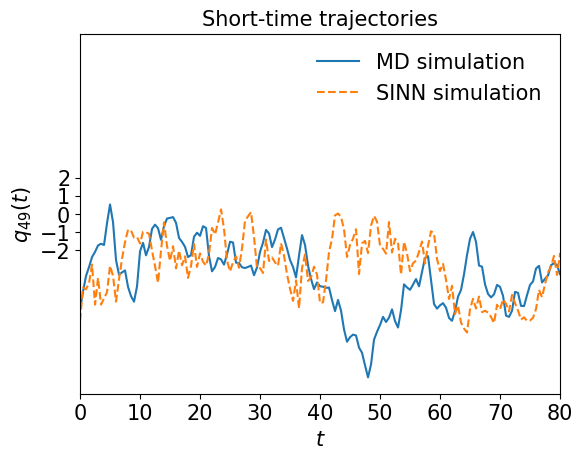

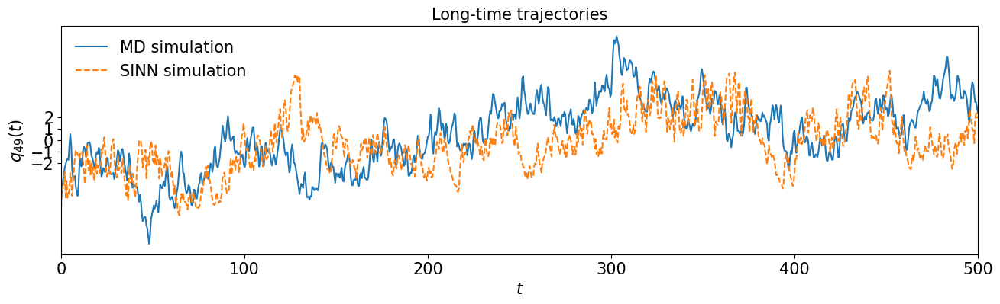

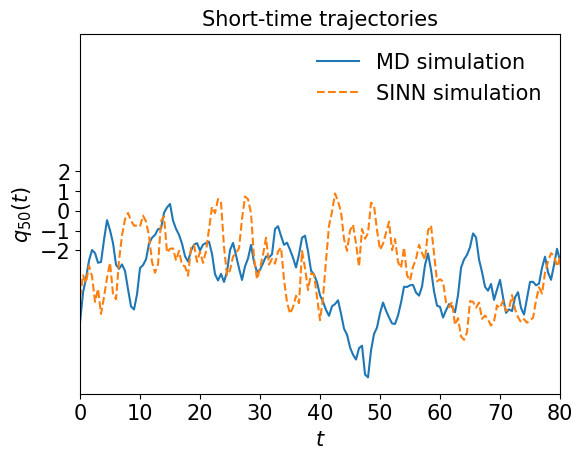

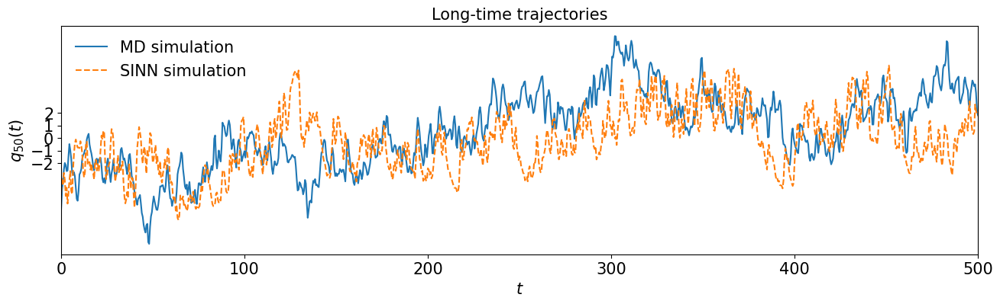

In [95]:
test5(model5)

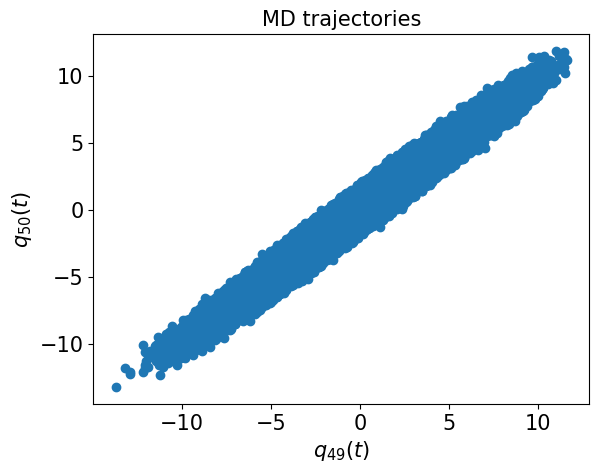

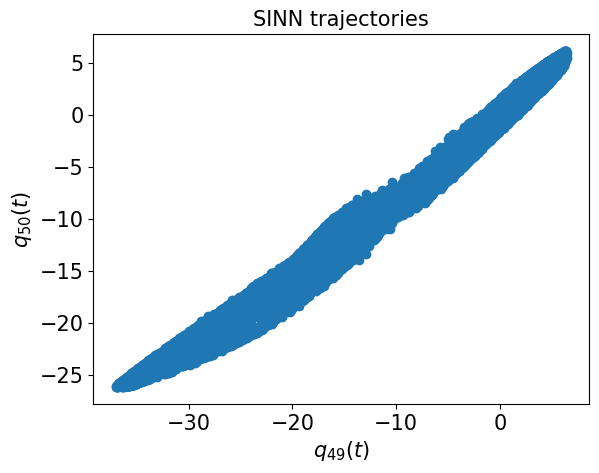

In [96]:
test6(model5)

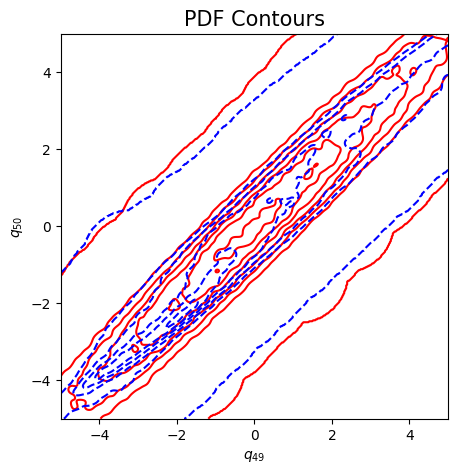

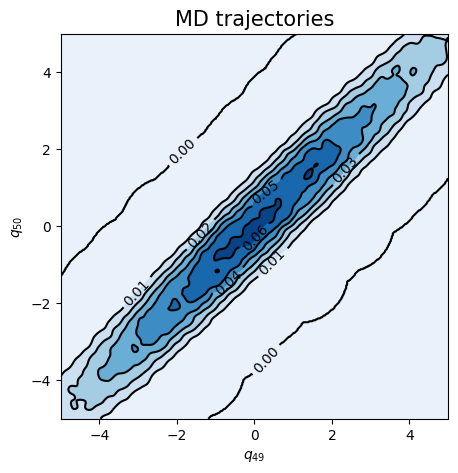

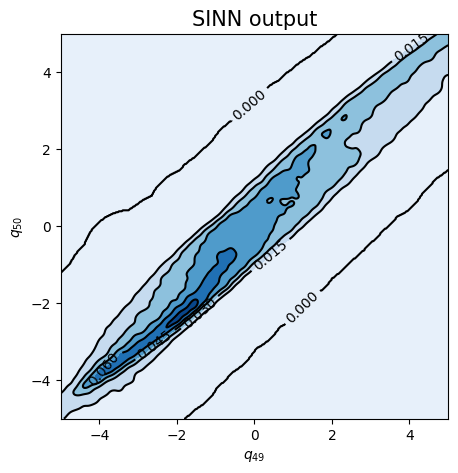

In [97]:
test7(model5)

In [98]:
### Defining SINN model
net6 = SINN(2, 75, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model6 = Model(net=net6)
model6.train()

[0]-th step loss: 0.8478, 0.8384, acf: 0.09558, ccf: 0.11981, pdf: 0.29325, pdf2: 0.28995, acf2: 0.03977
[50]-th step loss: 0.3207, 0.3072, acf: 0.04990, ccf: 0.19827, pdf: 0.02323, pdf2: 0.02297, acf2: 0.01280
[100]-th step loss: 0.3154, 0.2992, acf: 0.01065, ccf: 0.27051, pdf: 0.00817, pdf2: 0.00859, acf2: 0.00130
[150]-th step loss: 0.1928, 0.1950, acf: 0.06477, ccf: 0.08068, pdf: 0.01563, pdf2: 0.00844, acf2: 0.02551
[200]-th step loss: 0.1798, 0.1708, acf: 0.03548, ccf: 0.10444, pdf: 0.00758, pdf2: 0.01003, acf2: 0.01327
[250]-th step loss: 0.0414, 0.0362, acf: 0.00798, ccf: 0.00910, pdf: 0.00811, pdf2: 0.00962, acf2: 0.00136
[300]-th step loss: 0.0391, 0.0357, acf: 0.00977, ccf: 0.01052, pdf: 0.00565, pdf2: 0.00930, acf2: 0.00045
[350]-th step loss: 0.0328, 0.0348, acf: 0.00983, ccf: 0.01024, pdf: 0.00525, pdf2: 0.00907, acf2: 0.00036
[400]-th step loss: 0.0391, 0.0313, acf: 0.00797, ccf: 0.00857, pdf: 0.00512, pdf2: 0.00919, acf2: 0.00048
[450]-th step loss: 0.0435, 0.0336, acf:

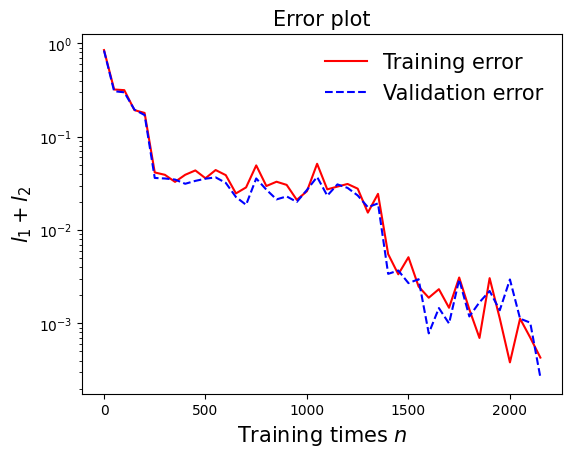

In [99]:
draw_loss(model6)

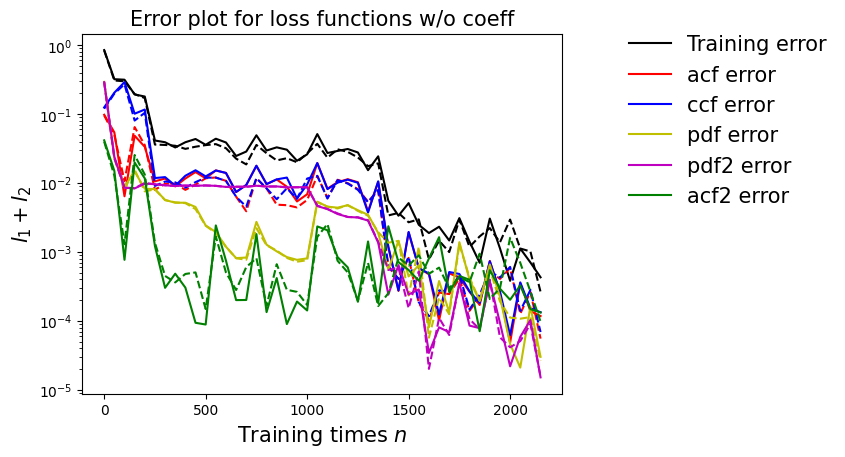

In [100]:
draw_errors(model6)

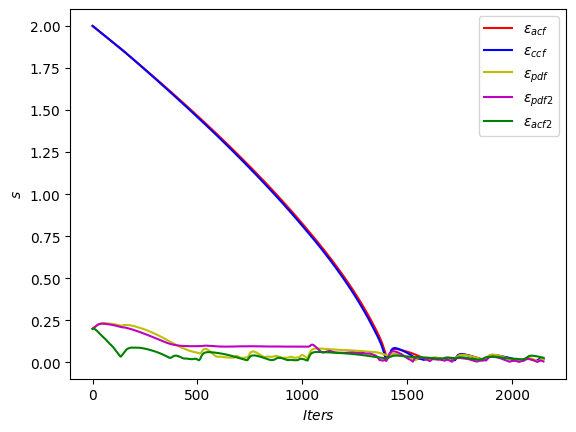

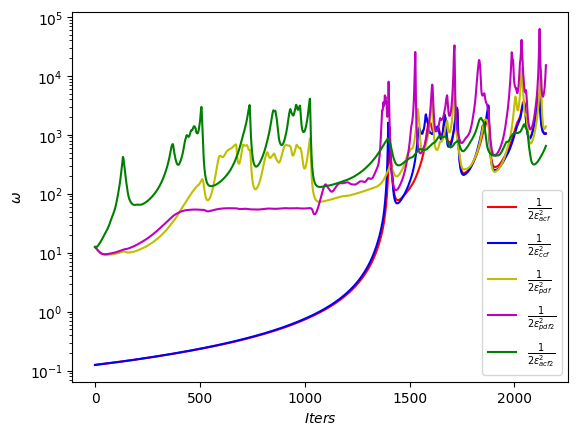

In [101]:
draw_adaptive_w(model6)
draw_epoch_w(model6)

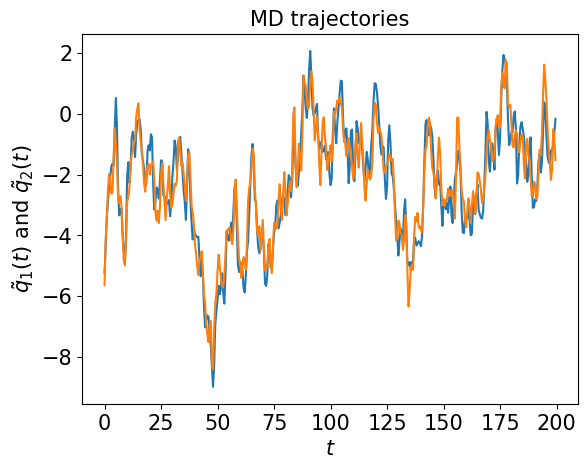

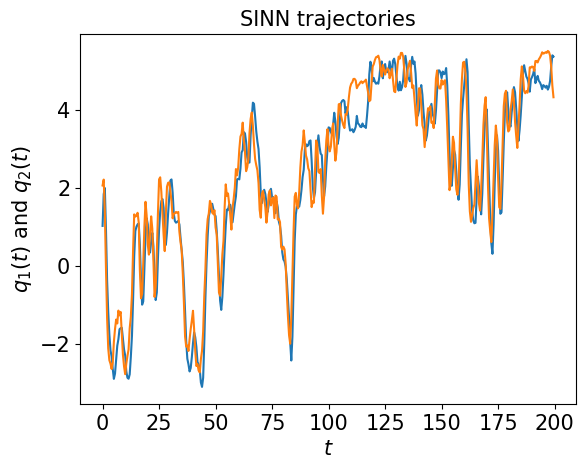

In [102]:
test1(model6)

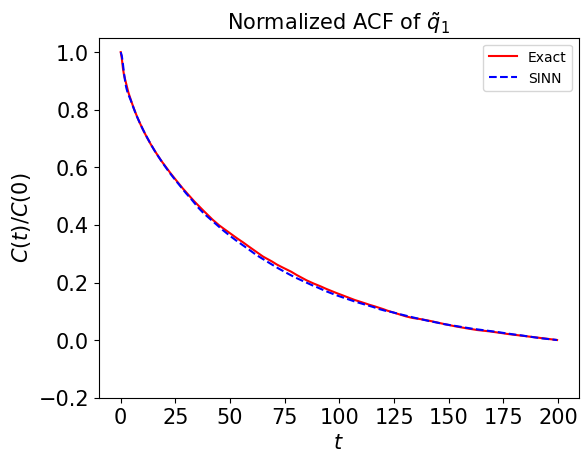

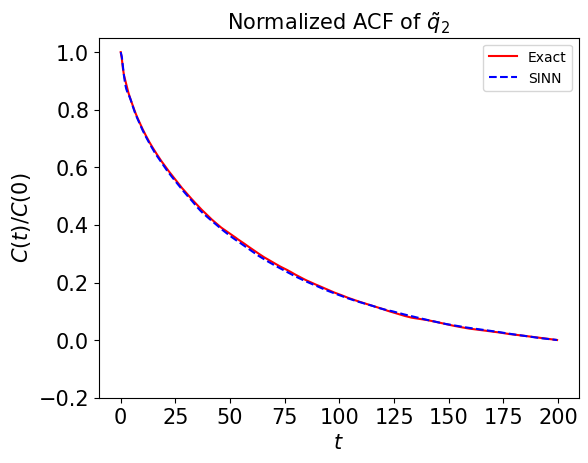

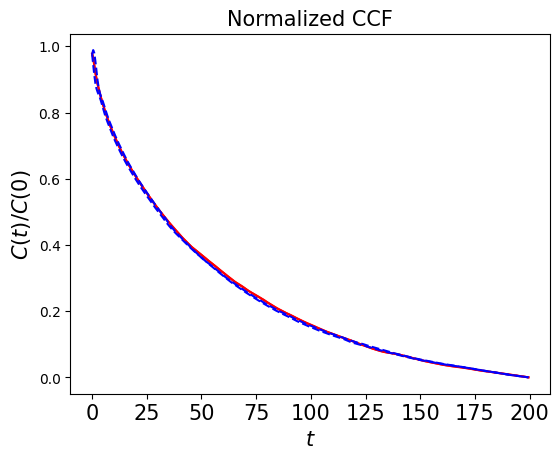

In [103]:
test2(model6)

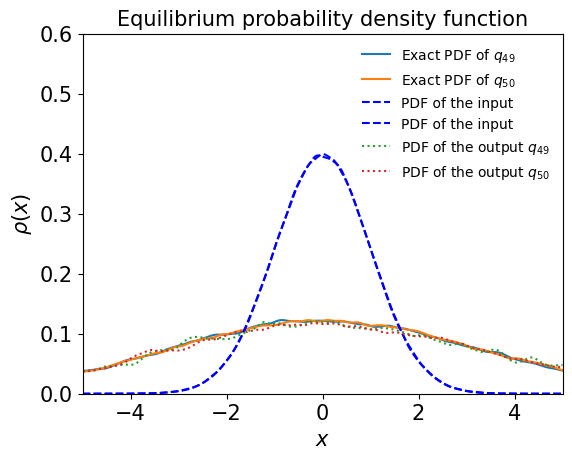

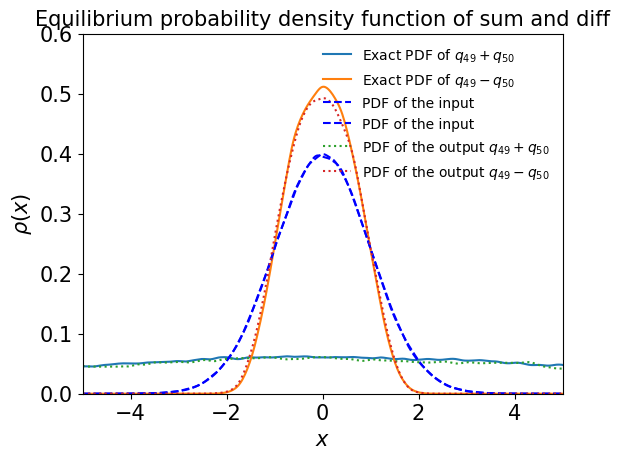

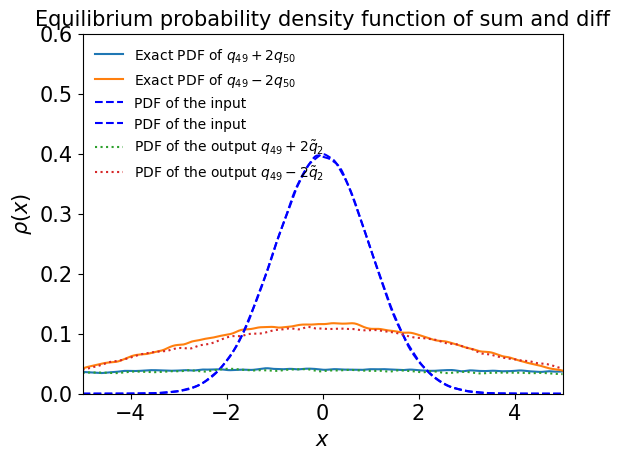

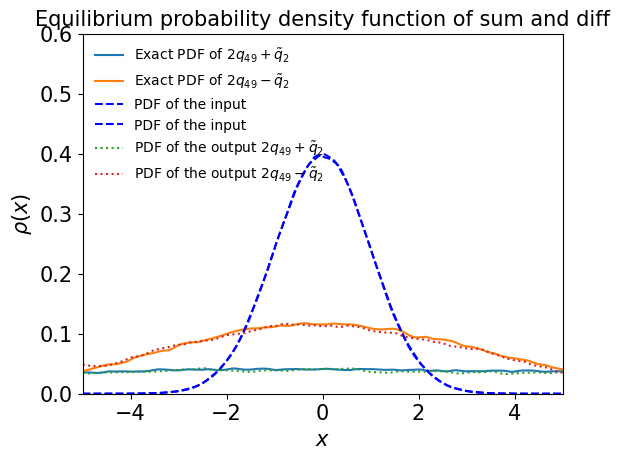

In [104]:
test3(model6)

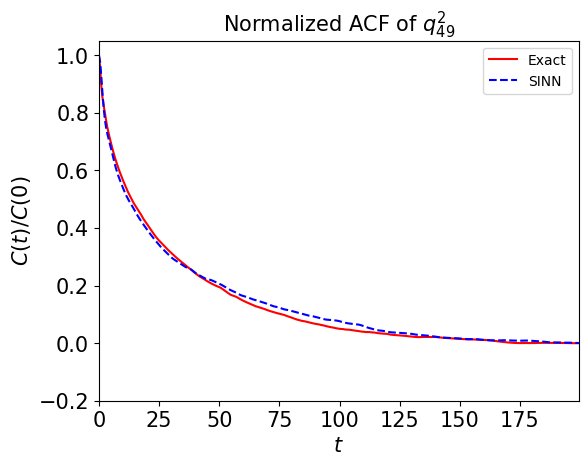

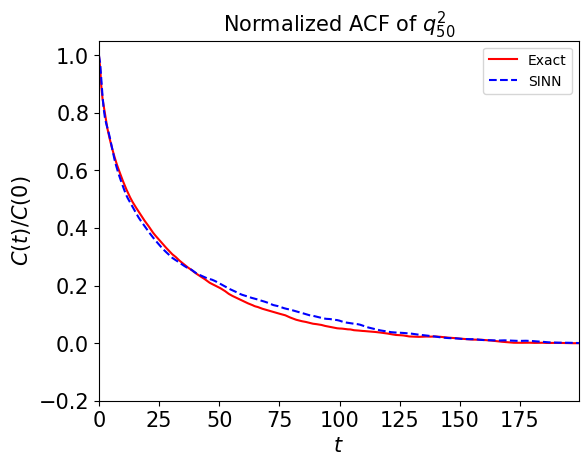

In [105]:
test4(model6)

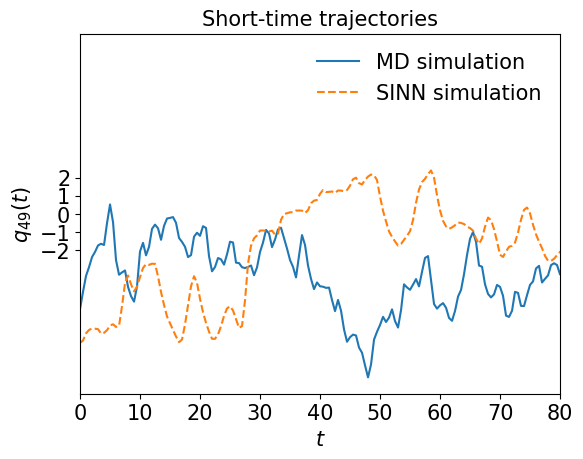

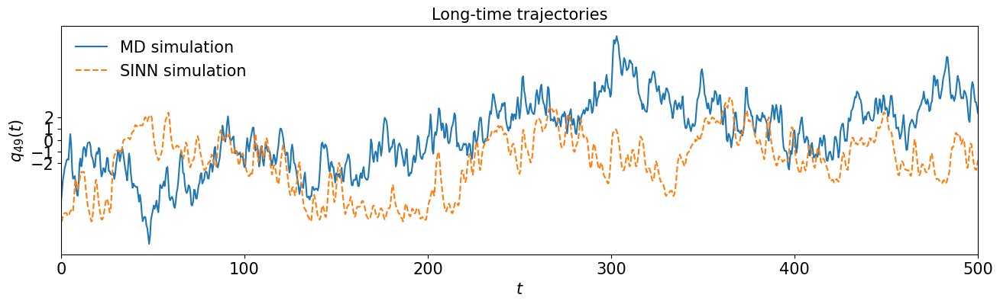

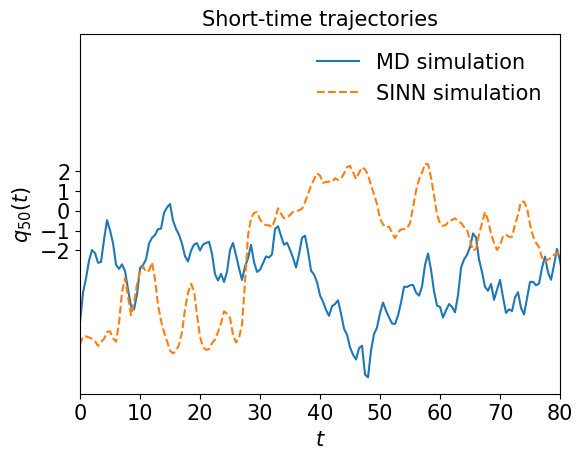

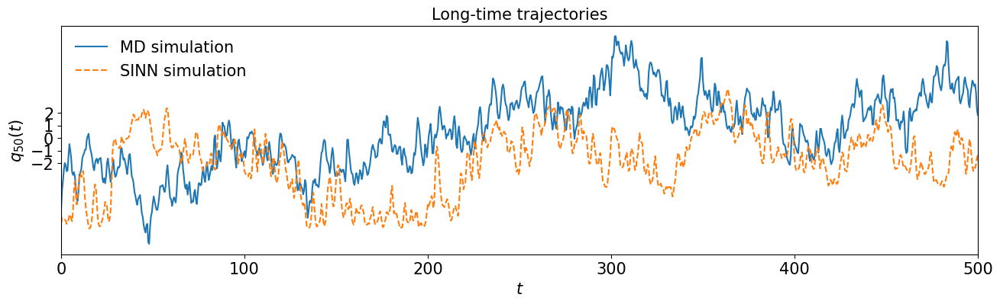

In [106]:
test5(model6)

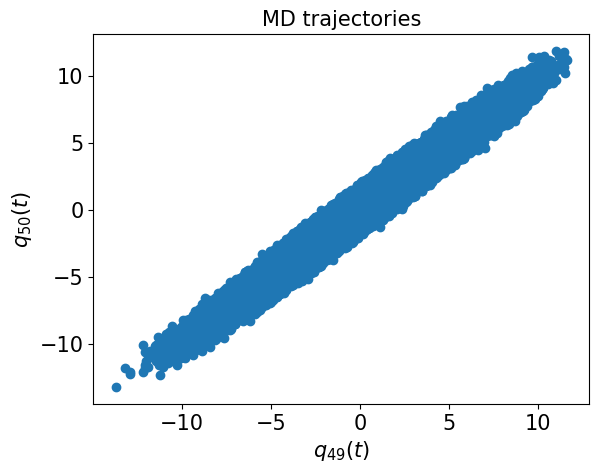

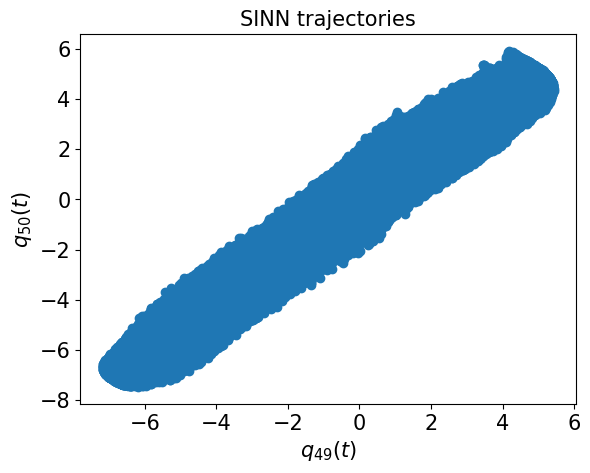

In [107]:
test6(model6)

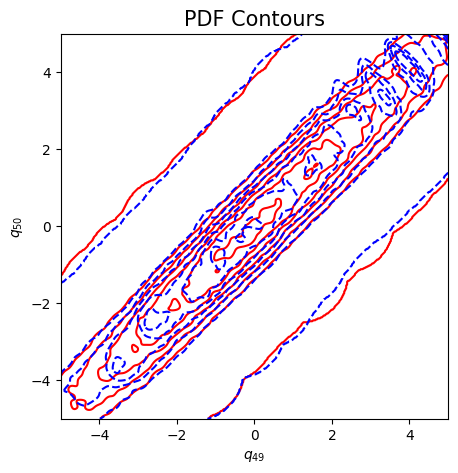

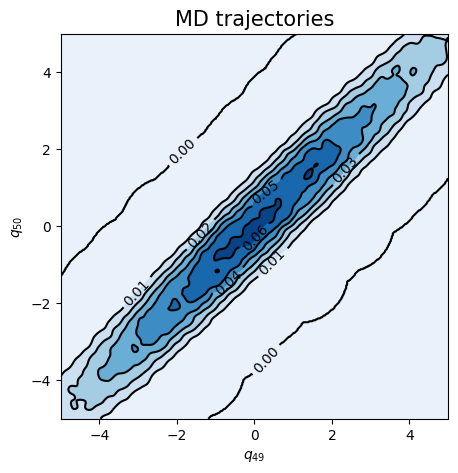

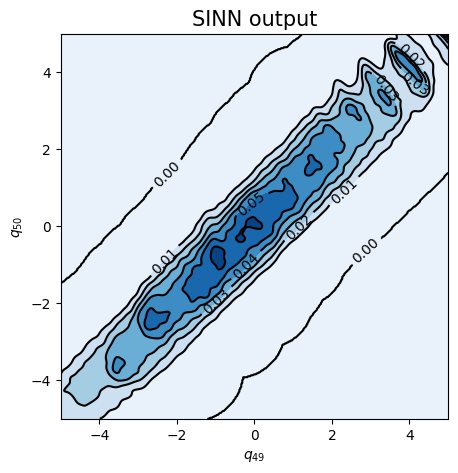

In [108]:
test7(model6)

In [ ]:
### Defining SINN model
net7 = SINN(2, 75, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model7 = Model(net=net7)
model7.train()

[0]-th step loss: 0.8289, 0.8518, acf: 0.09548, ccf: 0.13348, pdf: 0.29314, pdf2: 0.28991, acf2: 0.03976
[50]-th step loss: 0.4250, 0.3867, acf: 0.02976, ccf: 0.30988, pdf: 0.01888, pdf2: 0.02267, acf2: 0.00554
[100]-th step loss: 0.3517, 0.3568, acf: 0.06599, ccf: 0.21850, pdf: 0.02113, pdf2: 0.02895, acf2: 0.02223
[150]-th step loss: 0.3545, 0.4013, acf: 0.00899, ccf: 0.36296, pdf: 0.00751, pdf2: 0.01666, acf2: 0.00518
[200]-th step loss: 0.4875, 0.5109, acf: 0.00378, ccf: 0.45793, pdf: 0.02039, pdf2: 0.02701, acf2: 0.00179
[250]-th step loss: 0.4322, 0.4210, acf: 0.00899, ccf: 0.35330, pdf: 0.00827, pdf2: 0.04868, acf2: 0.00175
[300]-th step loss: 0.3775, 0.3680, acf: 0.02148, ccf: 0.31034, pdf: 0.00829, pdf2: 0.02682, acf2: 0.00109
[350]-th step loss: 0.3782, 0.3792, acf: 0.01554, ccf: 0.33170, pdf: 0.00829, pdf2: 0.02313, acf2: 0.00053
[400]-th step loss: 0.3816, 0.3642, acf: 0.01826, ccf: 0.31230, pdf: 0.00829, pdf2: 0.02477, acf2: 0.00062
[450]-th step loss: 0.3699, 0.3802, acf:

In [ ]:
draw_loss(model7)

In [ ]:
draw_errors(model7)

In [ ]:
draw_adaptive_w(model7)
draw_epoch_w(model7)

In [ ]:
test1(model7)

In [ ]:
test2(model7)

In [ ]:
test3(model7)

In [ ]:
test4(model7)

In [ ]:
test5(model7)

In [ ]:
test6(model7)

In [ ]:
test7(model7)

In [ ]:
### Defining SINN model
net8 = SINN(2, 75, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model8 = Model(net=net8)
model8.train()

In [ ]:
draw_loss(model8)

In [ ]:
draw_errors(model8)

In [ ]:
draw_adaptive_w(model8)
draw_epoch_w(model8)

In [ ]:
test1(model8)

In [ ]:
test2(model8)

In [ ]:
test3(model8)

In [ ]:
test4(model8)

In [ ]:
test5(model8)

In [ ]:
test6(model8)

In [ ]:
test7(model8)

In [ ]:
### Defining SINN model
net9 = SINN(2, 75, 3, 2).to(device) # input dimension, hidden size, number of layers, output dimension
model9 = Model(net=net9)
model9.train()

In [ ]:
draw_loss(model9)

In [ ]:
draw_errors(model9)

In [ ]:
draw_adaptive_w(model9)
draw_epoch_w(model9)

In [ ]:
test1(model9)

In [ ]:
test2(model9)

In [ ]:
test3(model9)

In [ ]:
test4(model9)

In [ ]:
test5(model9)

In [ ]:
test6(model9)

In [ ]:
test7(model9)